<a href="https://colab.research.google.com/github/towardsinnovationlab/Earthquake_Risk_Prediction/blob/main/earthquake_prediction_v_2_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![](https://www.worldatlas.com/upload/97/eb/bf/earthquake-cause.png)

An earthquake is a natural event that happen when the ground shakes and moves. It is caused by the movement of tectonic plates along faults or fractures in the Earth’s crust when they collide or move against each other. An earthquake can release a large amount of energy in the form of seismic waves, which can travel through the Earth and cause damage to buildings, infrastructure, and human lives. By understanding the causes and effects of earthquakes, insurers can better assess the risks associated with insuring properties located in areas prone to seismic activity. They can then use this knowledge to set appropriate premiums for their customers, ensuring that those who live in high-risk areas pay higher rates while those who live in low-risk areas pay lower rates.

Given an historical time series of Philippines earthquakes from 1979 to 2010, the purpose of this job is to predict the magnitude of the next earthquakes in the last year by the help of Supervised Learning models.

Magnitude variable is the outcome and it can be used as a feature in a pricing database to improve the quote of the risk premium.

When we use GLM in a pricing, we estimate the conditional mean of the response variable given the predictor variables. In estimating hazard events like earthquakes become relevant to have a measure of the prediction uncertainty, and the quantile regression solves this issue replacing a single value prediction by prediction intervals. Quantile regression allows for flexible modelling of the entire distribution of the response variable, it estimates the conditional quantiles of the response variable, given the explanatory variables.


### Prepare Workspace

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [2]:
! pip install feature_engine

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 326.6/326.6 kB 10.8 MB/s eta 0:00:00


In [3]:
! pip install sklearn-quantile

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for sklearn-quantile: filename=sklearn_quantile-0.0.21-cp310-cp310-linux_x86_64.whl size=1826542 sha256=21857bc365a721f4c5b34754d5da88be36ab95383c8e7af69e14ad57d2ebda69
  Stored in directory: /root/.cache/pip/wheels/83/91/04/5aa42bb873dc4a09f6614b8d85011a33f6a395207a1cf24d0b
Successfully built sklearn-quantile


In [4]:
!pip install dcor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 4.6 MB/s eta 0:00:00


In [5]:
! pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107730 sha256=125ec4256f481c6bd371c1e0d0679824f31f8ac437d340c1f0f626d149b21686
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [6]:
#setup deterministic results
import numpy as np
from numpy.random import seed
seed=0
np.random.seed(seed)
import tensorflow as tf
tf.random.set_seed(seed)
import os
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['TF_DETERMINISTIC_OPS'] = '1'


import random
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import plotly.express as px
import datetime
import scipy
import scipy.stats as stats
from scipy.stats import randint
from statsmodels.tsa.stattools import adfuller
import dcor
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf
from feature_engine.timeseries.forecasting import WindowFeatures
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn_quantile import (
    RandomForestQuantileRegressor,
    KNeighborsQuantileRegressor)
from sklearn.ensemble import IsolationForest
from sklearn.inspection import PartialDependenceDisplay
from feature_engine.encoding import MeanEncoder
import eli5
from eli5.sklearn import PermutationImportance


import warnings
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

### Load Data Set

In [7]:
from google.colab import files
uploaded = files.upload()

Saving train.csv to train.csv


In [8]:
df = pd.read_csv('train.csv',index_col=0,parse_dates=True)

Data are coming from a Kaggle hackathon, provided by the United States Geological Survey.

Data have been cleaned into homogeneous magnitude type and having more consistent values, so the data set has been reduced in dimensions (columns and rows) and time horizon.

Variables: from 9 to 5

Rows: from 10.188 to 8.999

Time horizion: from 1979-2020 to 1980-2009

### Have a look at the data set

In [9]:
print(df.shape)

(10188, 9)


In [10]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 10188 entries, 1979-11-12 14:46:47.800000+00:00 to 2010-06-12 00:14:12.100000+00:00
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   latitude        10188 non-null  float64
 1   longitude       10188 non-null  float64
 2   depth           10188 non-null  float64
 3   mag             10188 non-null  float64
 4   magType         10188 non-null  object 
 5   place           10188 non-null  object 
 6   type            10188 non-null  object 
 7   locationSource  10188 non-null  object 
 8   magSource       10188 non-null  object 
dtypes: float64(4), object(5)
memory usage: 795.9+ KB
None


In [11]:
print(df.columns)

Index(['latitude', 'longitude', 'depth', 'mag', 'magType', 'place', 'type',
       'locationSource', 'magSource'],
      dtype='object')


In [12]:
df.head(10)

,latitude,longitude,depth,mag,magType,place,type,locationSource,magSource
time,,,,,,,,,
1979-11-12 14:46:47.800000+00:00,9.752,125.935,106.0,5.0,mb,"Mindanao, Philippines",earthquake,us,us
1979-11-18 15:59:20.500000+00:00,11.327,125.690,43.0,5.0,mb,"Samar, Philippines",earthquake,us,us
1979-11-19 22:17:20.200000+00:00,5.861,125.295,85.0,6.1,mb,"Mindanao, Philippines",earthquake,us,us
1979-11-21 22:59:05.300000+00:00,5.571,127.016,63.0,4.8,mb,Philippine Islands region,earthquake,us,us
1979-11-22 18:39:07.600000+00:00,16.339,121.586,33.0,4.8,mb,"Luzon, Philippines",earthquake,us,us
1979-11-23 20:45:05.400000+00:00,5.813,126.995,143.0,4.5,mb,"Mindanao, Philippines",earthquake,us,us
1979-11-24 18:45:28.600000+00:00,17.662,119.806,33.0,4.1,mb,Philippine Islands region,earthquake,us,us
1979-11-27 09:18:58.500000+00:00,7.178,126.304,33.0,4.6,mb,"Mindanao, Philippines",earthquake,us,us
1979-12-03 06:11:23.900000+00:00,8.652,126.460,85.0,4.8,mb,"Mindanao, Philippines",earthquake,us,us


### Summary Statistics

In [13]:
# Summarize attribute distributions for data type of variables
obj_cols = [var for var in df.columns if df[var].dtype in ['object']]
df[obj_cols].describe().T

,count,unique,top,freq
magType,10188,5,mb,9116
place,10188,25,"Mindanao, Philippines",3951
type,10188,1,earthquake,10188
locationSource,10188,2,us,10187
magSource,10188,4,us,9277


In [14]:
# Summarize attribute distributions for data type of variables
num_cols = [var for var in df.columns if df[var].dtype in ['int64','float64']]
df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,10188.0,10.295055,3.775376,4.632,6.748,9.867,13.225,19.041
longitude,10188.0,124.567383,2.436067,117.115,122.584,125.605,126.438,129.797
depth,10188.0,70.589694,92.418147,1.100,33.000,34.450,74.800,678.000
mag,10188.0,4.630752,0.472133,3.000,4.300,4.600,4.900,7.700


### Data Cleaning

In [15]:
# Delete duplicate rows
df.drop_duplicates(inplace=True)
print(df.shape)

(10188, 9)


In [16]:
# Check missing values
missing = df.isnull().sum()/df.shape[0]*100
missing

latitude          0.0
longitude         0.0
depth             0.0
mag               0.0
magType           0.0
place             0.0
type              0.0
locationSource    0.0
magSource         0.0
dtype: float64

In [17]:
df.index.min()

Timestamp('1979-11-12 14:46:47.800000+0000', tz='UTC')

In [18]:
df.index.max()

Timestamp('2010-06-12 00:14:12.100000+0000', tz='UTC')

In [19]:
# formatting index
df.index = pd.to_datetime(df.index)

In [20]:
# Filter data frmae with homogeneous magnitude type
df1=df[df['magType']=='mb']

In [21]:
# check statistics and not helpful variables after filtering
df1.describe(include='all')

,latitude,longitude,depth,mag,magType,place,type,locationSource,magSource
count,9116.000000,9116.000000,9116.000000,9116.000000,9116,9116,9116,9116,9116
unique,NaN,NaN,NaN,NaN,1,25,1,1,1
top,NaN,NaN,NaN,NaN,mb,"Mindanao, Philippines",earthquake,us,us
freq,NaN,NaN,NaN,NaN,9116,3499,9116,9116,9116
mean,10.306526,124.579464,71.423651,4.529750,NaN,NaN,NaN,NaN,NaN
std,3.768411,2.435928,93.494684,0.351621,NaN,NaN,NaN,NaN,NaN
min,4.632000,117.115000,1.100000,3.000000,NaN,NaN,NaN,NaN,NaN
25%,6.756750,122.603750,33.000000,4.300000,NaN,NaN,NaN,NaN,NaN
50%,9.882500,125.618000,33.400000,4.500000,NaN,NaN,NaN,NaN,NaN
75%,13.229750,126.440000,75.600000,4.800000,NaN,NaN,NaN,NaN,NaN


In [22]:
df1.head(10)

,latitude,longitude,depth,mag,magType,place,type,locationSource,magSource
time,,,,,,,,,
1979-11-12 14:46:47.800000+00:00,9.752,125.935,106.0,5.0,mb,"Mindanao, Philippines",earthquake,us,us
1979-11-18 15:59:20.500000+00:00,11.327,125.690,43.0,5.0,mb,"Samar, Philippines",earthquake,us,us
1979-11-19 22:17:20.200000+00:00,5.861,125.295,85.0,6.1,mb,"Mindanao, Philippines",earthquake,us,us
1979-11-21 22:59:05.300000+00:00,5.571,127.016,63.0,4.8,mb,Philippine Islands region,earthquake,us,us
1979-11-22 18:39:07.600000+00:00,16.339,121.586,33.0,4.8,mb,"Luzon, Philippines",earthquake,us,us
1979-11-23 20:45:05.400000+00:00,5.813,126.995,143.0,4.5,mb,"Mindanao, Philippines",earthquake,us,us
1979-11-24 18:45:28.600000+00:00,17.662,119.806,33.0,4.1,mb,Philippine Islands region,earthquake,us,us
1979-11-27 09:18:58.500000+00:00,7.178,126.304,33.0,4.6,mb,"Mindanao, Philippines",earthquake,us,us
1979-12-03 06:11:23.900000+00:00,8.652,126.460,85.0,4.8,mb,"Mindanao, Philippines",earthquake,us,us


In [23]:
# drop not more helpful variables (type, magType and magSource, because uniques)
df2 = df1.drop(['magType','type','magSource','locationSource'], axis=1)

In [24]:
df3 = df2.copy()
# include date time variables for analysis
df3['year'] = pd.DatetimeIndex(df3.index).year
df3['month'] = pd.DatetimeIndex(df3.index).month
df3['day'] = pd.DatetimeIndex(df3.index).day
df3['hour'] = pd.DatetimeIndex(df3.index).hour

In [25]:
# Drop head and tail with inconsistent number of observations
df4 = df3.query('year >= 1980 and year <= 2009')

In [26]:
df_cleaned = df4.drop(['year','month','day','hour'], axis=1)

In [27]:
df_cleaned.to_csv('train_cleaned.csv', index=True)

### Functions

In [28]:
# Vis Chart
def plot_target(data, var):
    plt.rcParams['figure.figsize']=(15,5)
    plt.suptitle('Earthquake Magnitude Exploratory Data Analysis',fontsize=15)
    plt.subplot(1,3,1)
    x=data[var]
    plt.hist(x,color='green',edgecolor='black')
    plt.title('{} histogram'.format(var))
    plt.yticks(rotation=45, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)

    plt.subplot(1,3,2)
    x=data[var]
    sns.boxplot(x, color="orange")
    plt.title('{} boxplot'.format(var))
    plt.yticks(rotation=45, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,3)
    res = stats.probplot(data[var], plot=plt)
    plt.title('{} Q-Q plot'.format(var))
    plt.yticks(rotation=45, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)

    plt.show()

In [29]:
# vis chart
def barplot(data, var):
    plt.rcParams['figure.figsize']=(20,10)
    df= data.groupby(data[var])['mag'].count()
    df.plot.bar(color='blue')
    plt.suptitle('Magnitude Distribution observations per {}'.format(var),fontsize=25)
    plt.xlabel('{}'.format(var), fontsize=15)
    plt.ylabel('count mag', fontsize=15)
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)
    plt.show()

In [30]:
# vis chart
def lineplot(data,var):
    plt.rcParams['figure.figsize']=(20,10)
    df= data.groupby(data[var])['mag'].mean()
    df.plot(color='blue', linewidth=5)
    plt.suptitle('Magnitude Average Distribution per {}'.format(var),fontsize=25)
    plt.xlabel('{}'.format(var), fontsize=15)
    plt.ylabel('mag', fontsize=15)
    plt.yticks(rotation=0,fontsize=15)
    plt.xticks(rotation=45, fontsize=15)
    plt.show()

In [31]:
# vis chart
def boxplot(data,var):
    plt.rcParams['figure.figsize']=(20,10)
    sns.boxplot(x=var, y='mag', data=data, linewidth=5)
    plt.suptitle('Magnitude Distribution per {}'.format(var),fontsize=25)
    plt.xlabel('{}'.format(var), fontsize=15)
    plt.ylabel('mag', fontsize=15)
    plt.yticks(rotation=0,fontsize=15)
    plt.xticks(rotation=45, fontsize=15)
    plt.show()

In [32]:
#vis chart
def boxplot2(data1,data2, var):
    plt.rcParams['figure.figsize']=(20,10)
    data1_ = pd.DataFrame(data1).reset_index()
    data2_ = pd.DataFrame(data2, columns=['mag_pred'])
    data_new = pd.concat([data1_, data2_], axis=1).set_index("time")
    #data_new['month'] = pd.to_datetime(data_new.index).month
    data_new['year_month'] = data_new.index.strftime('%Y-%m')
    sns.boxplot(x="year_month", y="value", hue="variable",
                data=pd.melt(data_new,id_vars="year_month", value_vars=["mag", "mag_pred"]))
    plt.suptitle('Magnitude Distribution per month compared with {} mean prediction'.format(var),fontsize=25)
    plt.xlabel('{}'.format(var), fontsize=15)
    plt.ylabel('value', fontsize=15)
    plt.yticks(rotation=0,fontsize=15)
    plt.xticks(rotation=45, fontsize=15)
    plt.legend(loc="upper right", fontsize=15)
    plt.show()

In [33]:
# vis chart
def tsplot(data,var,period):
    plt.rcParams['figure.figsize']=(20,10)
    if period=='all':
        plt.plot(data[var], linewidth=3, color='Orange')
    else:
        plt.plot(data[var].loc[period], linewidth=3,color='Orange')
    plt.suptitle('Earthquake Magnitude Time Series',fontsize=25)
    plt.xlabel('Time', fontsize=15)
    plt.ylabel('{}'.format(var), fontsize=15)
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)
    plt.show()

In [34]:
# vis chart
def results_tsplot(results_lower, results_mean, results_median, results_upper,model):
    # Create a figure with a single subplot
    fig, ax = plt.subplots(figsize=(18, 10))


    # Plot the actual data points
    ax.plot(X_test.index, y_test, color='blue', label='Actual')

    # Plot the predicted mean
    ax.plot(X_test.index, results_median, color='red', linestyle='dashed', linewidth=3,label='Predicted Median')
    #ax.plot(X_test.index, results_mean, color='yellow', linestyle='dotted', linewidth=3,label='Predicted Mean')


    # Plot the lower and upper quantiles
    results_lower_flat = np.ravel(results_lower)
    results_upper_flat = np.ravel(results_upper)
    ax.fill_between(X_test.index, results_lower_flat, results_upper_flat, alpha=0.4, color='green',
                linewidth=3,label='Prediction Interval')

    # Set the x-axis label and title
    ax.set_xlabel('Time', fontsize=12)
    ax.set_ylabel('Magnitude', fontsize=12)
    ax.set_title('{} Regression Results'.format(model), fontsize=15, fontweight='bold')

    # Set the tick label font size
    ax.tick_params(axis='both', labelsize=12)

    # Add a legend
    ax.legend(fontsize=12)

    # Show the chart
    plt.show()

In [35]:
# vis chart
def tsmultiplot(data1,data2,var):
    plt.rcParams['figure.figsize']=(20,10)
    data1_ = pd.DataFrame(data1).reset_index()
    data2_ = pd.DataFrame(data2, columns=['mag_pred'])
    data_new = pd.concat([data1_, data2_], axis=1).set_index("time")
    plt.plot(data_new, linewidth=3)
    my_labels=['Mag_Actual', 'Mag_Prediction']
    plt.suptitle('Magnitude Distribution: Actual vs {} Mean Prediction'.format(var),fontsize=25)
    plt.xlabel('Time', fontsize=15)
    plt.ylabel('Actual vs Prediction',fontsize=20)
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)
    plt.legend(my_labels,fontsize=15)
    plt.show()

In [36]:
# Vis Chart
def plot_cat(data, col1, col2):
    plt.rcParams['figure.figsize']=(20,30)
    plt.subplot(2,1,1)
    data.groupby(col1).count()[col2].plot(kind='pie',autopct='%.0f%%', labels=None).set_title("Pie {} Variable Distribution".format(col1))
    plt.subplot(2,1,2)
    sns.countplot(x=data[col1], data=data).set_title("Barplot {} Variable Distribution".format(col1))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=90, fontsize=15)
    plt.show()

In [37]:
# vis chart
def plot_num(data, var):
    plt.rcParams['figure.figsize']=(15,5)
    plt.subplot(1,3,1)
    x=data[var]
    plt.hist(x,color='green',edgecolor='black')
    plt.title('{} histogram'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,2)
    x=data[var]
    sns.boxplot(x, color="orange")
    plt.title('{} boxplot'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,3)
    res = stats.probplot(data[var], plot=plt)
    plt.title('{} Q-Q plot'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)

    plt.show()

In [38]:
# Function for query and barplot
def query(data, col):
    # groupby
    df = data.groupby(data[col], as_index=False)['mag'].max()
    df['PERCENTAGE'] = df['mag']/df['mag'].sum()*100
    # dropping not matching rows
    df = df.dropna()
    # ranking
    df = df.sort_values(by = 'mag', ascending = False).reset_index(drop=True)
    df_q = df.style.background_gradient(cmap='winter').format({'PERCENTAGE': "{:.2f}"}).format({'mag':"{:,.2f}"})
    # barplot
    index=list(df.columns[0:1])
    barplot = df[df.columns[0:2]].sort_values(by = "mag", ascending = True).set_index(index).plot.barh()
    plt.xlabel('mag', fontsize=15)
    plt.ylabel('{}'.format(col), fontsize=15)
    plt.xticks(rotation=0, fontsize=15)
    plt.yticks(rotation=0, fontsize=15)
    plt.legend(loc='best', bbox_to_anchor=(1, 0.5))
    return df_q
    plt.show()
    return barplot
    plt.show()

In [39]:
# Function for query and barplot
def query2(data,col):
    # groupby
    df = data.groupby(data[col], as_index=False)['mag'].mean()
    df['PERCENTAGE'] = df['mag']/df['mag'].sum()*100
    # dropping not matching rows
    df = df.dropna()
    # ranking
    df = df.sort_values(by = 'mag', ascending = False).reset_index(drop=True)
    df_q = df.style.background_gradient(cmap='winter').format({'PERCENTAGE': "{:.2f}"}).format({'mag':"{:,.2f}"})
    # barplot
    index=list(df.columns[0:1])
    barplot = df[df.columns[0:2]].sort_values(by = "mag", ascending = True).set_index(index).plot.barh()
    plt.xlabel('mag', fontsize=15)
    plt.ylabel('{}'.format(col), fontsize=15)
    plt.xticks(rotation=0, fontsize=15)
    plt.yticks(rotation=0, fontsize=15)
    plt.legend(loc='best', bbox_to_anchor=(1, 0.5))
    return df_q
    plt.show()
    return barplot
    plt.show()

In [40]:
# Function for query and barplot
def query3(data,col):
    # groupby
    df = data.groupby(data[col], as_index=False)['mag'].min()
    df['PERCENTAGE'] = df['mag']/df['mag'].sum()*100
    # dropping not matching rows
    df = df.dropna()
    # ranking
    df = df.sort_values(by = 'mag', ascending = True).reset_index(drop=True)
    df_q = df.style.background_gradient(cmap='winter').format({'PERCENTAGE': "{:.2f}"}).format({'mag':"{:,.2f}"})
    # barplot
    index=list(df.columns[0:1])
    barplot = df[df.columns[0:2]].sort_values(by = "mag", ascending = False).set_index(index).plot.barh()
    plt.xlabel('mag', fontsize=15)
    plt.ylabel('{}'.format(col), fontsize=15)
    plt.xticks(rotation=0, fontsize=15)
    plt.yticks(rotation=0, fontsize=15)
    plt.legend(loc='best', bbox_to_anchor=(1, 0.5))
    return df_q
    plt.show()
    return barplot
    plt.show()

In [41]:
# vis chart
def train_metrics_model(mae_lower, mae_mean, mae_median, mae_upper,
                        rmse_lower, rmse_mean, rmse_median, rmse_upper, model):
    plt.rcParams['figure.figsize']=(15,10)
    # Create a dictionary of the data for MAE
    mae_train_data = {
    'train_lower': mae_lower,
    'train_mean': mae_mean,
    'train_median': mae_median,
    'train_upper': mae_upper
    }

    # Create a dictionary of the data for RMSE
    rmse_train_data = {
    'train_lower': rmse_lower,
    'train_mean': rmse_mean,
    'train_median': rmse_median,
    'train_upper': rmse_upper
    }

    # Create a figure and axis
    fig, ax = plt.subplots()

    # Plot the MAE data as a red dashed line with asterisk markers
    ax.plot([x.replace('_', ' ').title() for x in mae_train_data.keys()], list(mae_train_data.values()), color='red', linestyle='--', linewidth=5, marker='*', label='MAE')

    # Plot the RMSE data as a blue solid line with triangle markers
    ax.plot([x.replace('_', ' ').title() for x in rmse_train_data.keys()], list(rmse_train_data.values()), color='blue', linestyle='-', linewidth=5, marker='^', label='RMSE')

    # Set the title and axis labels
    ax.set_title('Train Metrics for {}'.format(model), fontsize=30)
    ax.set_xlabel('Metric', fontsize=30)
    ax.set_ylabel('Value', fontsize=30)
    plt.yticks(fontsize=25)
    plt.xticks(fontsize=25)

    # Add a legend
    ax.legend(fontsize=15)

    # Show the plot
    plt.show()

In [42]:
# vis chart
def test_metrics_model(mae_lower, mae_mean, mae_median, mae_upper,
                        rmse_lower, rmse_mean, rmse_median, rmse_upper, model):
    plt.rcParams['figure.figsize']=(15,10)
    # Create a dictionary of the data for MAE
    mae_test_data = {
    'test_lower': mae_lower,
    'test_mean': mae_mean,
    'test_median': mae_median,
    'test_upper': mae_upper
    }

    # Create a dictionary of the data for RMSE
    rmse_test_data = {
    'test_lower': rmse_lower,
    'test_mean': rmse_mean,
    'test_median': rmse_median,
    'test_upper': rmse_upper
    }

    # Create a figure and axis
    fig, ax = plt.subplots()

    # Plot the MAE data as a red dashed line with asterisk markers
    ax.plot([x.replace('_', ' ').title() for x in mae_test_data.keys()], list(mae_test_data.values()), color='red', linestyle='--', linewidth=5, marker='*', label='MAE')

    # Plot the RMSE data as a blue solid line with triangle markers
    ax.plot([x.replace('_', ' ').title() for x in rmse_test_data.keys()], list(rmse_test_data.values()), color='blue', linestyle='-', linewidth=5, marker='^', label='RMSE')

    # Set the title and axis labels
    ax.set_title('Test Metrics for {}'.format(model), fontsize=30)
    ax.set_xlabel('Metric', fontsize=30)
    ax.set_ylabel('Value', fontsize=30)
    plt.yticks(fontsize=25)
    plt.xticks(fontsize=25)

    # Add a legend
    ax.legend(fontsize=15)

    # Show the plot
    plt.show()

In [43]:
# vis chart
def overall_train_metric(knn_metric_lower, knn_metric_mean, knn_metric_median, knn_metric_upper,
                  rf_metric_lower, rf_metric_mean, rf_metric_median, rf_metric_upper,
                  gbm_metric_lower, gbm_metric_mean, gbm_metric_median, gbm_metric_upper,
                  nn_metric_lower, nn_metric_mean, nn_metric_median, nn_metric_upper,
                  dl_metric_lower, dl_metric_mean, dl_metric_median, dl_metric_upper,
                  cnn_metric_lower, cnn_metric_mean, cnn_metric_median, cnn_metric_upper, metric):
    plt.rcParams['figure.figsize']=(15,10)
    # Create a dictionary of the data for knn
    knn_train_data = {
    'train_lower': knn_metric_lower,
    'train_mean': knn_metric_mean,
    'train_median': knn_metric_median,
    'train_upper': knn_metric_upper
    }

    # Create a dictionary of the data for rf
    rf_train_data = {
    'train_lower': rf_metric_lower,
    'train_mean': rf_metric_mean,
    'train_median': rf_metric_median,
    'train_upper': rf_metric_upper
    }

    # Create a dictionary of the data for gbm
    gbm_train_data = {
    'train_lower': gbm_metric_lower,
    'train_mean': gbm_metric_mean,
    'train_median': gbm_metric_median,
    'train_upper': gbm_metric_upper
    }

    # Create a dictionary of the data for nn
    nn_train_data = {
    'train_lower': nn_metric_lower,
    'train_mean': nn_metric_mean,
    'train_median': nn_metric_median,
    'train_upper': nn_metric_upper
    }


    # Create a dictionary of the data for dl
    dl_train_data = {
    'train_lower': dl_metric_lower,
    'train_mean': dl_metric_mean,
    'train_median': dl_metric_median,
    'train_upper': dl_metric_upper
    }

    # Create a dictionary of the data for cnn
    cnn_train_data = {
    'train_lower': cnn_metric_lower,
    'train_mean': cnn_metric_mean,
    'train_median': cnn_metric_median,
    'train_upper': cnn_metric_upper
    }

    # Create a figure and axis
    fig, ax = plt.subplots()

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in knn_train_data.keys()], list(knn_train_data.values()), color='red', linestyle='--', marker='P',  linewidth=5, label='KNN')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in rf_train_data.keys()], list(rf_train_data.values()), color='blue', linestyle='-', marker='8', linewidth=5,label='RF')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in gbm_train_data.keys()], list(gbm_train_data.values()), color='green', linestyle='--', marker='D', linewidth=5,label='GBM')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in nn_train_data.keys()], list(nn_train_data.values()), color='orange', linestyle='--', marker='H', linewidth=5,label='NN')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in dl_train_data.keys()], list(dl_train_data.values()), color='purple', linestyle='--', marker='X', linewidth=5,label='DL')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in cnn_train_data.keys()], list(cnn_train_data.values()), color='brown', linestyle='--', marker='v', linewidth=5,label='CNN')


    # Set the title and axis labels
    ax.set_title('Train {} Metric for ML'.format(metric), fontsize=30)
    ax.set_xlabel('Metric', fontsize=30)
    ax.set_ylabel('Value', fontsize=30)
    plt.yticks(fontsize=25)
    plt.xticks(fontsize=25)

    # Add a legend
    ax.legend(fontsize=15)

    # Show the plot
    plt.show()

In [44]:
# vis chart
def overall_test_metric(knn_metric_lower, knn_metric_mean, knn_metric_median, knn_metric_upper,
                  rf_metric_lower, rf_metric_mean, rf_metric_median, rf_metric_upper,
                  gbm_metric_lower, gbm_metric_mean, gbm_metric_median, gbm_metric_upper,
                  nn_metric_lower, nn_metric_mean, nn_metric_median, nn_metric_upper,
                  dl_metric_lower, dl_metric_mean, dl_metric_median, dl_metric_upper,
                  cnn_metric_lower, cnn_metric_mean, cnn_metric_median, cnn_metric_upper, metric):

    # Create a dictionary of the data for knn
    knn_test_data = {
    'test_lower': knn_metric_lower,
    'test_mean': knn_metric_mean,
    'test_median': knn_metric_median,
    'test_upper': knn_metric_upper
    }

    # Create a dictionary of the data for rf
    rf_test_data = {
    'test_lower': rf_metric_lower,
    'test_mean': rf_metric_mean,
    'test_median': rf_metric_median,
    'test_upper': rf_metric_upper
    }

    # Create a dictionary of the data for gbm
    gbm_test_data = {
    'test_lower': gbm_metric_lower,
    'test_mean': gbm_metric_mean,
    'test_median': gbm_metric_median,
    'test_upper': gbm_metric_upper
    }

    # Create a dictionary of the data for nn
    nn_test_data = {
    'test_lower': nn_metric_lower,
    'test_mean': nn_metric_mean,
    'test_median': nn_metric_median,
    'test_upper': nn_metric_upper
    }


    # Create a dictionary of the data for dl
    dl_test_data = {
    'test_lower': dl_metric_lower,
    'test_mean': dl_metric_mean,
    'test_median': dl_metric_median,
    'test_upper': dl_metric_upper
    }

    # Create a dictionary of the data for cnn
    cnn_test_data = {
    'test_lower': cnn_metric_lower,
    'test_mean': cnn_metric_mean,
    'test_median': cnn_metric_median,
    'test_upper': cnn_metric_upper
    }

    # Create a figure and axis
    fig, ax = plt.subplots()

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in knn_test_data.keys()], list(knn_test_data.values()), color='red', linestyle='--', marker='P',  linewidth=5, label='KNN')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in rf_test_data.keys()], list(rf_test_data.values()), color='blue', linestyle='-', marker='8', linewidth=5,label='RF')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in gbm_test_data.keys()], list(gbm_test_data.values()), color='green', linestyle='--', marker='D', linewidth=5,label='GBM')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in nn_test_data.keys()], list(nn_test_data.values()), color='orange', linestyle='--', marker='H', linewidth=5,label='NN')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in dl_test_data.keys()], list(dl_test_data.values()), color='purple', linestyle='--', marker='X', linewidth=5,label='DL')

    # Plot the data
    ax.plot([x.replace('_', ' ').title() for x in cnn_test_data.keys()], list(cnn_test_data.values()), color='brown', linestyle='--', marker='v', linewidth=5,label='CNN')


    # Set the title and axis labels
    ax.set_title('test {} Metric for ML'.format(metric), fontsize=30)
    ax.set_xlabel('Metric', fontsize=30)
    ax.set_ylabel('Value', fontsize=30)
    plt.yticks(fontsize=25)
    plt.xticks(fontsize=25)

    # Add a legend
    ax.legend(fontsize=15)

    # Show the plot
    plt.show()

In [45]:
# quantile loss function
def quantile_loss(q, y, y_p):
        e = y-y_p
        return tf.keras.backend.mean(tf.keras.backend.maximum(q*e, (q-1)*e))

In [46]:
# function
def mse(y_true, y_pred):
    return np.mean((y_true - y_pred) ** 2)

In [47]:
# Permutation feature importance from scratch
def permutation_feature_importance(model, X, y):
    # Get the baseline MSE using the original data
    y_pred = model.predict(X)
    baseline_mse = mse(y, y_pred)

    # Initialize an empty array to store the feature importances
    feature_importances = np.zeros(X.shape[1])

    # Loop over each feature column
    for i in range(X.shape[1]):
        # Make a copy of the original data
        X_permuted = X.copy()

        # Shuffle the values of the current feature column
        np.random.shuffle(X_permuted[:, i])

        # Get the MSE using the permuted data
        y_pred_permuted = model.predict(X_permuted)
        permuted_mse = mse(y, y_pred_permuted)

        # Calculate the feature importance as the difference between the baseline and permuted MSEs
        feature_importances[i] = baseline_mse - permuted_mse

    # Return the feature importances array
    return feature_importances


In [48]:
# Partial dependence plot
n_features = 4 # Number of features in X
n_grid = 10 # Number of grid points for each feature

# Define a function to calculate the partial dependence plot
def partial_dependence(model, X, feature_index, kind="average"):
    # Get the unique values of the feature
    feature_values = np.unique(X[:, feature_index])
    # Create a grid of values for the feature
    grid = np.linspace(feature_values.min(), feature_values.max(), n_grid)
    # Initialize an empty array to store the partial dependence values
    pdp = np.zeros(n_grid)
    # Loop over the grid points
    for i, value in enumerate(grid):
        # Create a copy of X
        X_new = X.copy()
        # Replace the feature column with the grid value
        X_new[:, feature_index] = value
        # Make predictions with the model
        #preds = model.predict(X_new.reshape(-1,n_features,1))
        preds = model.predict(X_new)
        # Calculate the average or individual effect
        if kind == "average":
            pdp[i] = preds.mean()
        elif kind == "individual":
            pdp[i] = preds
        else:
            raise ValueError("kind must be either 'average' or 'individual'")
    # Return the grid and the partial dependence values
    return grid, pdp

In [49]:
# Partial dependence plot
n_features = 4 # Number of features in X
n_grid = 10 # Number of grid points for each feature

# Define a function to calculate the partial dependence plot
def partial_dependence_mod(model, X, feature_index, kind="average"):
    # Get the unique values of the feature
    feature_values = np.unique(X[:, feature_index])
    # Create a grid of values for the feature
    grid = np.linspace(feature_values.min(), feature_values.max(), n_grid)
    # Initialize an empty array to store the partial dependence values
    pdp = np.zeros(n_grid)
    # Loop over the grid points
    for i, value in enumerate(grid):
        # Create a copy of X
        X_new = X.copy()
        # Replace the feature column with the grid value
        X_new[:, feature_index] = value
        # Make predictions with the model
        preds = model.predict(X_new.reshape(-1,n_features,1))
        # Calculate the average or individual effect
        if kind == "average":
            pdp[i] = preds.mean()
        elif kind == "individual":
            pdp[i] = preds
        else:
            raise ValueError("kind must be either 'average' or 'individual'")
    # Return the grid and the partial dependence values
    return grid, pdp

### Target Variable Analysis

After removing first year and the last year from the distribution, the outcome seems to assume a shape close to the Normal distribution with slight skewness, and the presence of outliers. From the analysis with past values is clear that there is not the autocorrelation and for this reason no generation of lag features.

In [50]:
# Univariate analysis looking at Mean, Standard Deviation, Skewness and Kurtosis
print('\nMean :', np.mean(df4['mag']),
        '\nVariance :', np.var(df4['mag']),
        '\nStandard Deviation :', np.var(df4['mag']**0.5),
        '\nSkewness :', stats.skew(df4['mag']),
        '\nKurtosis :', stats.kurtosis(df4['mag']))


Mean : 4.529247694188243 
Variance : 0.12349172206796918 
Standard Deviation : 0.006869618579328928 
Skewness : -0.045528770253248585 
Kurtosis : 0.37159700869843704


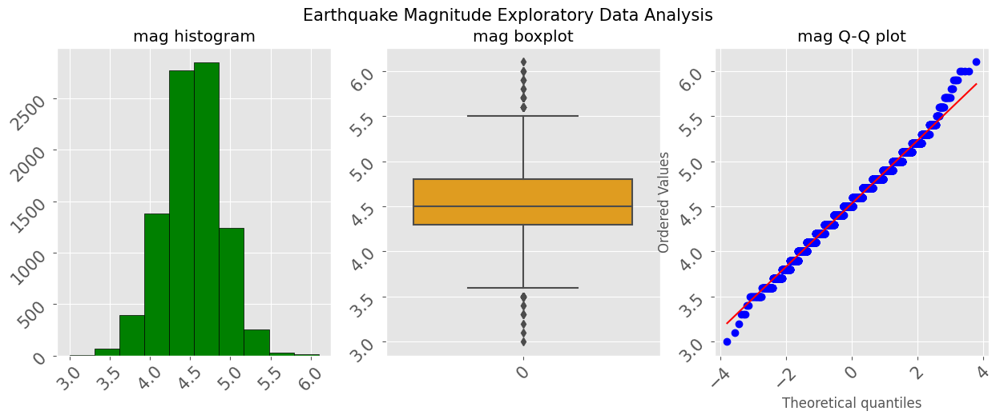

In [51]:
plot_target(df4, var='mag')

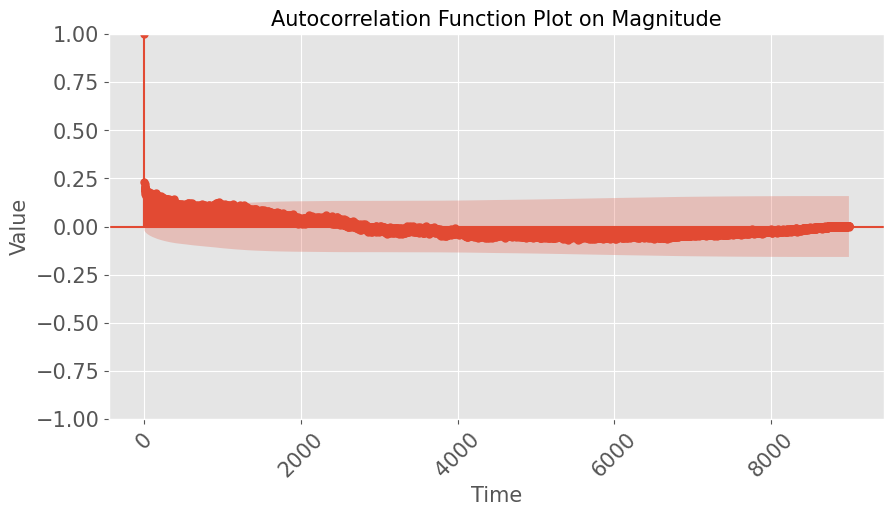

In [52]:
plt.rcParams['figure.figsize']=(10,5)
plot_acf(df4['mag'], lags=np.arange(len(df4)))
plt.title('Autocorrelation Function Plot on Magnitude', fontsize=15)
plt.xlabel('Time', fontsize=15)
plt.ylabel('Value',fontsize=15)
plt.yticks(rotation=0, fontsize=15)
plt.xticks(rotation=45, fontsize=15)
plt.show()

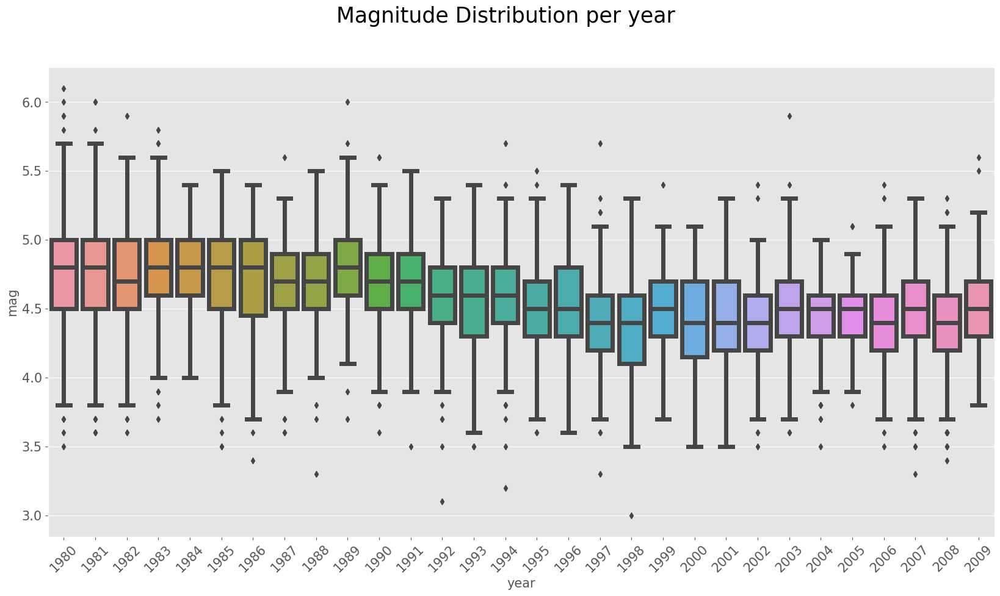

In [53]:
# distribution per year
boxplot(df4,'year')

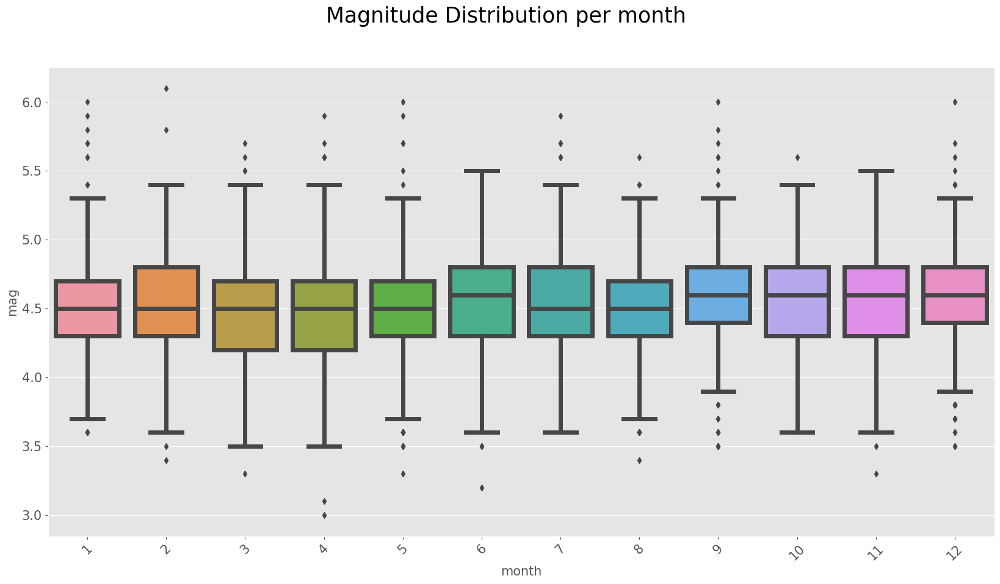

In [54]:
# Distribution per month
boxplot(df4,'month')

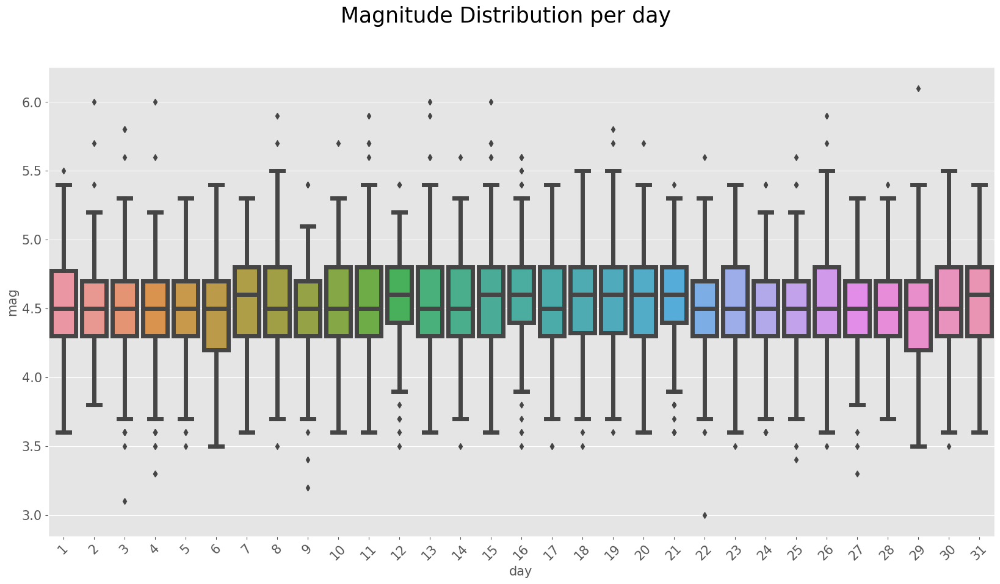

In [55]:
# Distribution per day
boxplot(df4,'day')

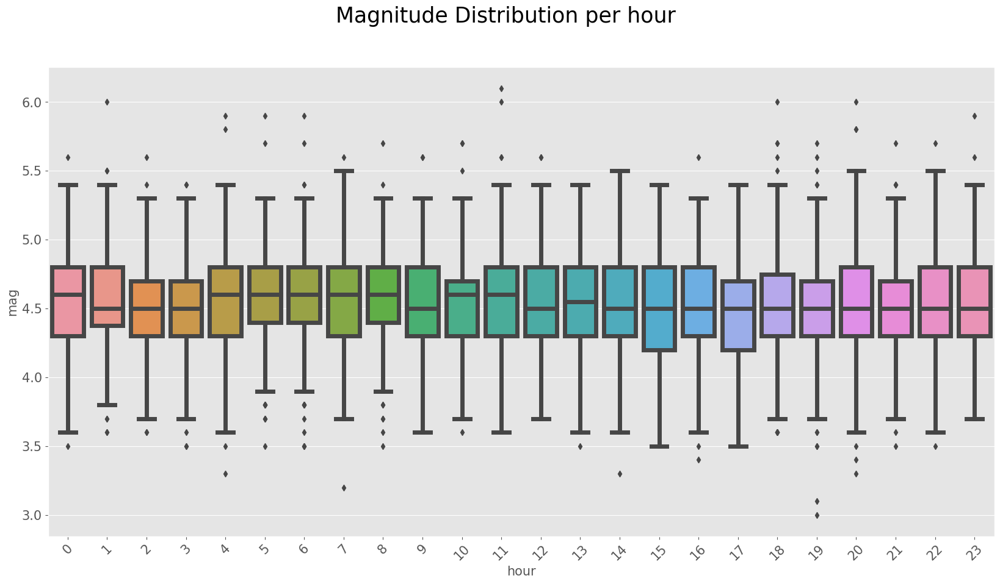

In [56]:
# Distribution per hour
boxplot(df4,'hour')

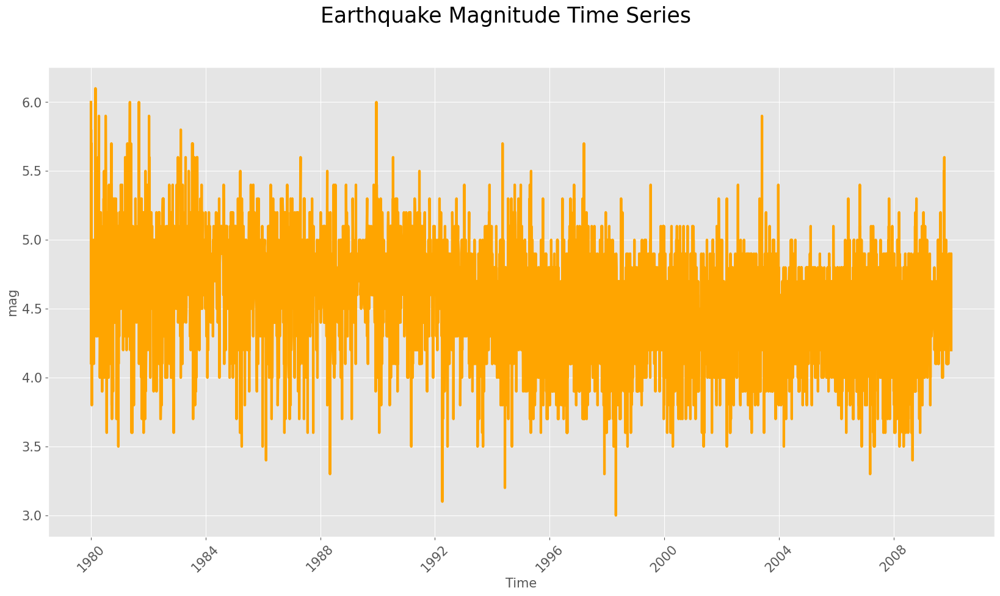

In [57]:
# Look at the whole Magnitude time series
tsplot(df4, var='mag', period='all')

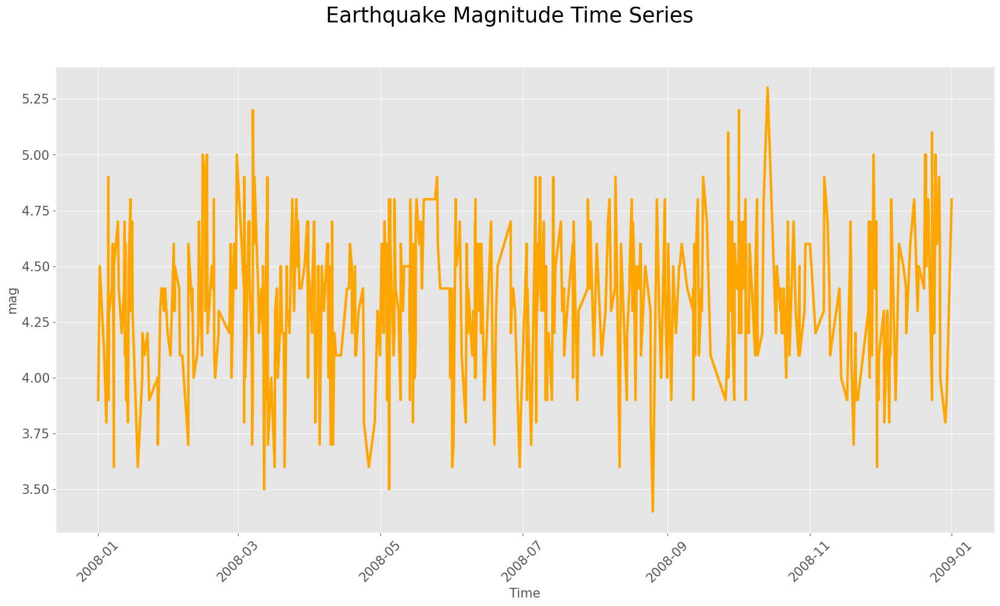

In [58]:
# Look at the single magnitude year
tsplot(df4,var='mag', period='2008')

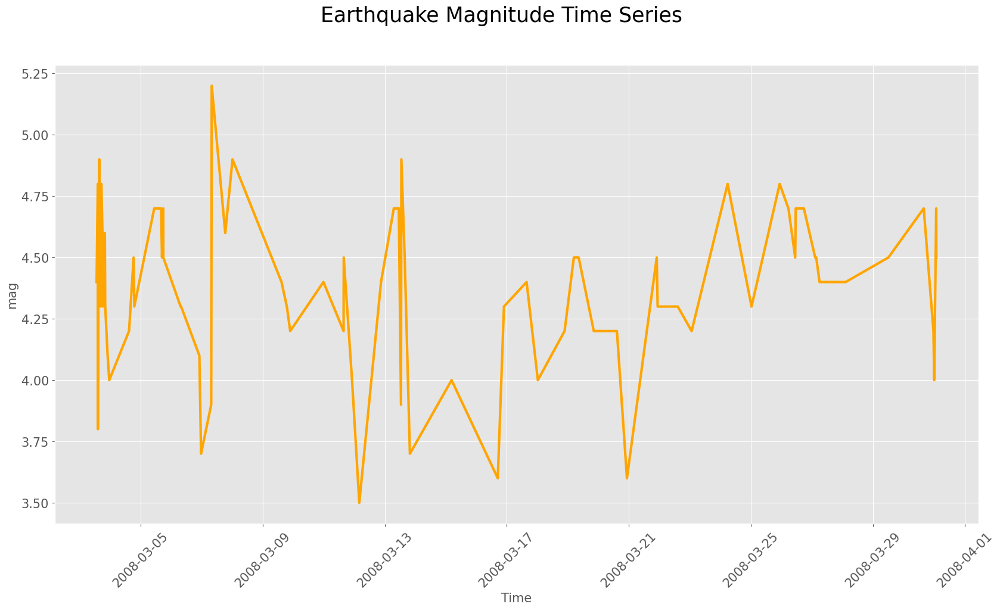

In [59]:
# Look at the single magnitude year-month
tsplot(df4,var='mag', period='2008-03')

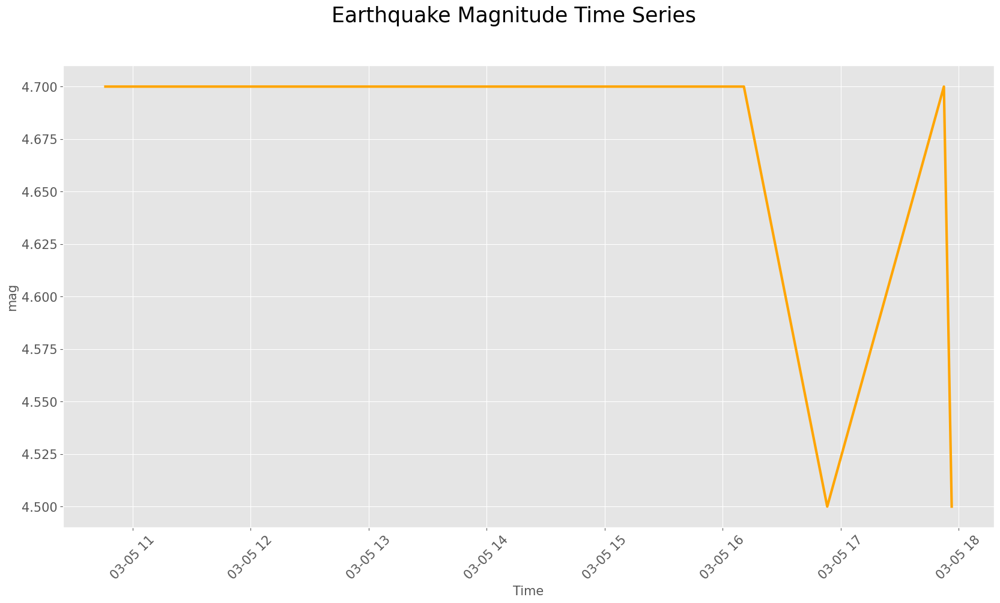

In [60]:
# Look at the single magnitude year-month-day
tsplot(df4,var='mag', period='2008-03-05')

In [61]:
df_new = df4.copy()
df_new = df_new.sort_values(by='mag', ascending=False)
df_max= df_new.reset_index()
df_max=df_max[['place','mag','depth','year','month','day','hour']].head(10)
df_max

,place,mag,depth,year,month,day,hour
0,"Mindanao, Philippines",6.1,104.0,1980,2,29,11
1,"Mindanao, Philippines",6.0,63.0,1980,1,2,20
2,"Mindanao, Philippines",6.0,33.0,1989,12,15,18
3,Philippine Islands region,6.0,145.0,1981,5,13,1
4,"Bohol, Philippines",6.0,644.5,1981,9,4,11
5,"Moro Gulf, Mindanao, Philippines",5.9,583.5,2003,5,26,23
6,"Catanduanes, Philippines",5.9,33.0,1982,1,11,6
7,"Mindanao, Philippines",5.9,49.0,1980,4,13,5
8,"Mindanao, Philippines",5.9,178.0,1980,7,8,4
9,"Mindanao, Philippines",5.8,114.0,1980,1,3,20


In [62]:
df_new = df4.copy()
df_new = df_new.sort_values(by='mag', ascending=True)
df_min= df_new.reset_index()
df_min=df_min[['place','mag','depth','year','month','day','hour']].head(10)
df_min

,place,mag,depth,year,month,day,hour
0,"Samar, Philippines",3.0,33.0,1998,4,22,19
1,Philippine Islands region,3.1,10.0,1992,4,3,19
2,"Luzon, Philippines",3.2,10.0,1994,6,9,7
3,"Mindanao, Philippines",3.3,33.0,1997,11,27,20
4,"Mindanao, Philippines",3.3,85.8,1988,5,4,4
5,Celebes Sea,3.3,390.3,2007,3,4,14
6,"Panay, Philippines",3.4,119.0,1986,2,9,16
7,"Luzon, Philippines",3.4,73.4,2008,8,25,20
8,Philippine Islands region,3.5,33.0,1998,3,25,22
9,"Luzon, Philippines",3.5,5.0,1993,6,26,6


Max Earthquake Magnitude per place


,place,mag,PERCENTAGE
0,"Mindanao, Philippines",6.10,4.565868
1,Philippine Islands region,6.00,4.491018
2,"Bohol, Philippines",6.00,4.491018
3,"Moro Gulf, Mindanao, Philippines",5.90,4.416168
4,"Catanduanes, Philippines",5.90,4.416168
5,"Mindoro, Philippines",5.70,4.266467
6,"Luzon, Philippines",5.70,4.266467
7,Celebes Sea,5.50,4.116766
8,"Kepulauan Talaud, Indonesia",5.50,4.116766
9,"Samar, Philippines",5.40,4.041916


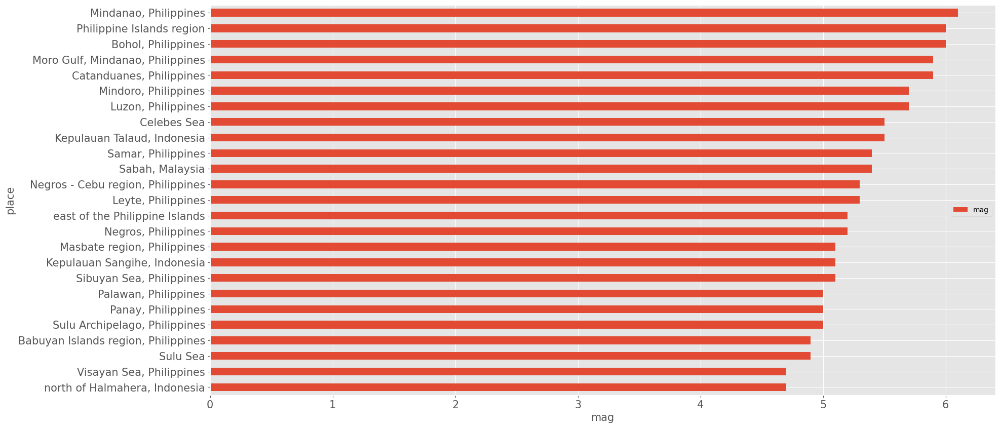

In [63]:
# Max magnitude distribution for place
variable = 'place'
print('Max Earthquake Magnitude per {}'.format(variable))
query(df4, col='place')

Average Earthquake Magnitude per place


,place,mag,PERCENTAGE
0,"Bohol, Philippines",4.66,4.156802
1,"Negros, Philippines",4.62,4.122031
2,"Catanduanes, Philippines",4.58,4.087095
3,"Sibuyan Sea, Philippines",4.57,4.077456
4,"Mindanao, Philippines",4.57,4.070582
5,"Sabah, Malaysia",4.56,4.063771
6,"Moro Gulf, Mindanao, Philippines",4.55,4.059583
7,"Leyte, Philippines",4.54,4.051127
8,"Kepulauan Talaud, Indonesia",4.54,4.046582
9,"Negros - Cebu region, Philippines",4.53,4.041483


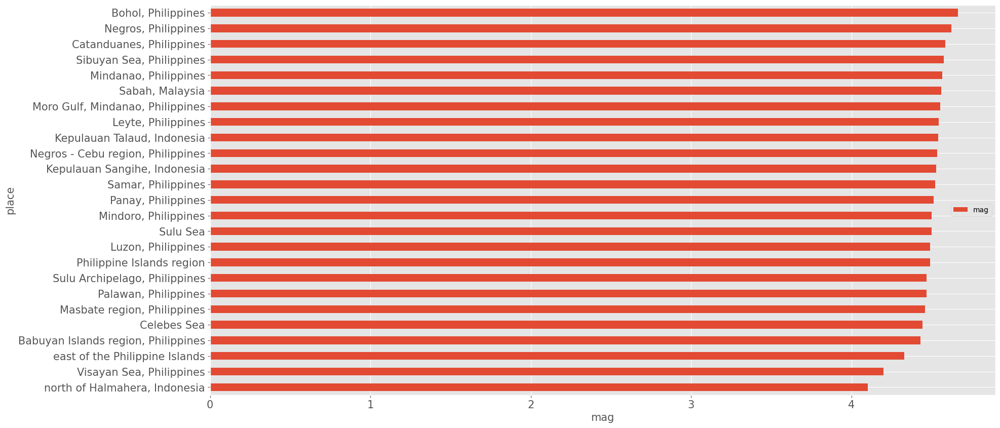

In [64]:
# Average magnitude distribution for place
variable = 'place'
print('Average Earthquake Magnitude per {}'.format(variable))
query2(df4, col='place')

Min Earthquake Magnitude per place


,place,mag,PERCENTAGE
0,"Samar, Philippines",3.00,3.289474
1,Philippine Islands region,3.10,3.399123
2,"Luzon, Philippines",3.20,3.508772
3,Celebes Sea,3.30,3.618421
4,"Mindanao, Philippines",3.30,3.618421
5,"Panay, Philippines",3.40,3.728070
6,"Mindoro, Philippines",3.50,3.837719
7,"Catanduanes, Philippines",3.60,3.947368
8,"Visayan Sea, Philippines",3.60,3.947368
9,"Moro Gulf, Mindanao, Philippines",3.60,3.947368


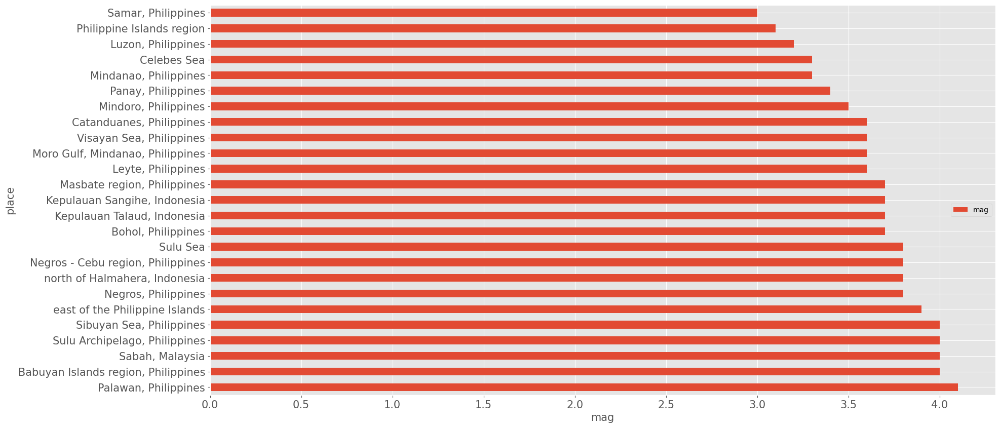

In [65]:
# Min magnitude distribution for place
variable = 'place'
print('Min Earthquake Magnitude per {}'.format(variable))
query3(df4, col='place')

In [66]:
fig=px.density_mapbox(df4, lat='latitude',lon='longitude',radius=1,
                    zoom=3.5, mapbox_style='stamen-terrain',center=dict(lat=11,lon=125),
                      title='Earthquake Magnitude Geographical Distribution')
fig.show()


### Stationarity

In [67]:
#  statistics of partitioned time series
X = df4['mag'].values
split = int(len(X) / 2)
X1, X2 = X[0:split], X[split:]
mean1, mean2 = X1.mean(), X2.mean()
var1, var2 = X1.var(), X2.var()
print('mean1=%f, mean2=%f' % (mean1, mean2))
print('variance1=%f, variance2=%f' % (var1, var2))

mean1=4.641031, mean2=4.417489
variance1=0.126247, variance2=0.095754


In [68]:
#  statistics of log partitioned time series
X = df4['mag'].values
X = np.log1p(X)
split = int(len(X) / 2)
X1, X2 = X[0:split], X[split:]
mean1, mean2 = X1.mean(), X2.mean()
var1, var2 = X1.var(), X2.var()
print('mean1=%f, mean2=%f' % (mean1, mean2))
print('variance1=%f, variance2=%f' % (var1, var2))

mean1=1.728054, mean2=1.687979
variance1=0.004061, variance2=0.003332


In [69]:
# Augmented Dickey-Fuller test
X = df4['mag'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -6.166833
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


### Decomposition

In the decomposition of the time series, there is no evidence of seasonality patterns, also trend doesn’t show specific up or down patterns, but there is just a jump from 1996 to 2000, more clear looking at the rolling window. The last analysis has been done by looking at the stationarity of the series. From the rolling window mean of observations, increasing window sizes have smoothed the shape over time. This allows the model to make use of behaviours seen at different time scales. In the end, the Augmented Dickey-Fuller test, which uses an autoregressive model, rejects the null hypothesis which means the time series is stationary, it doesn’t have a time-dependent structure.

In [70]:
daily_data = df4.groupby(pd.Grouper(freq='D')).agg({'mag': 'mean'})
daily_data_ = daily_data.dropna()

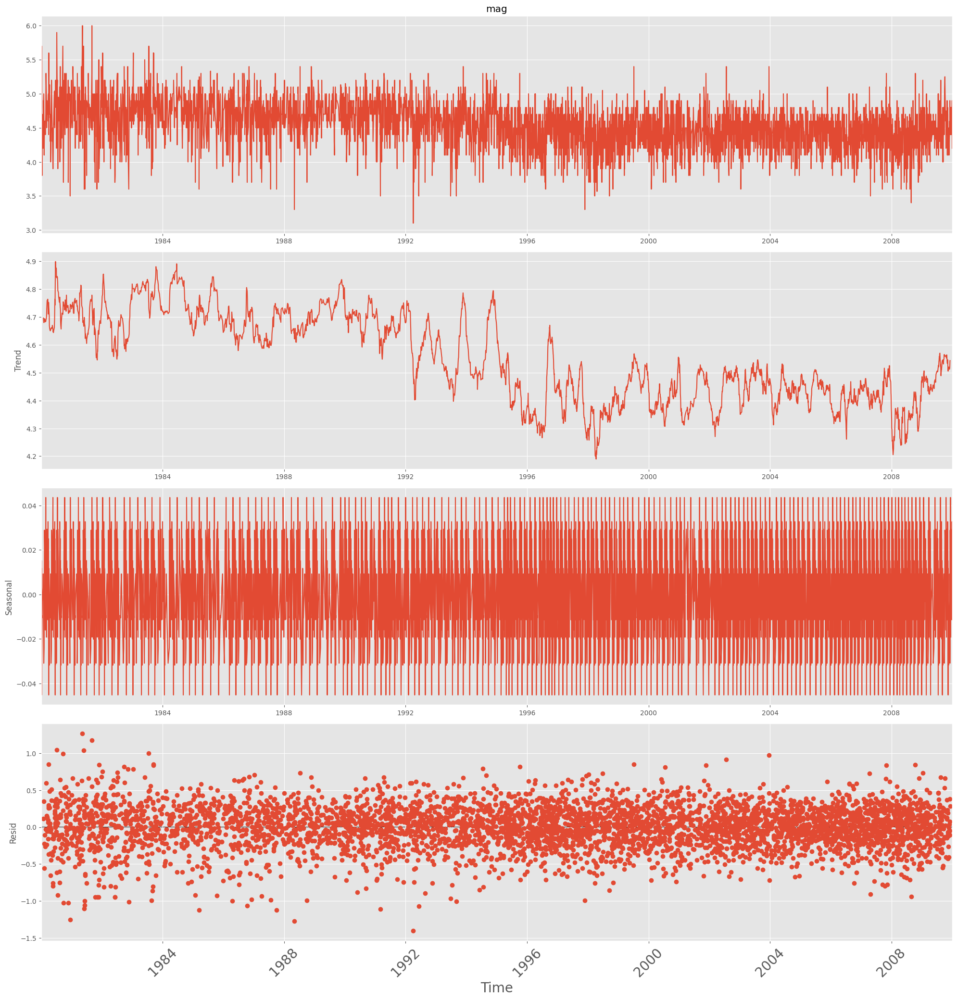

In [71]:
# Additive Decomposition
add_res = seasonal_decompose(x=daily_data_['mag'], model="additive", period=30)
plt.rcParams['figure.figsize']=(20,20)
add_res.plot()
plt.xlabel('Time', fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=45, fontsize=20)
plt.show()

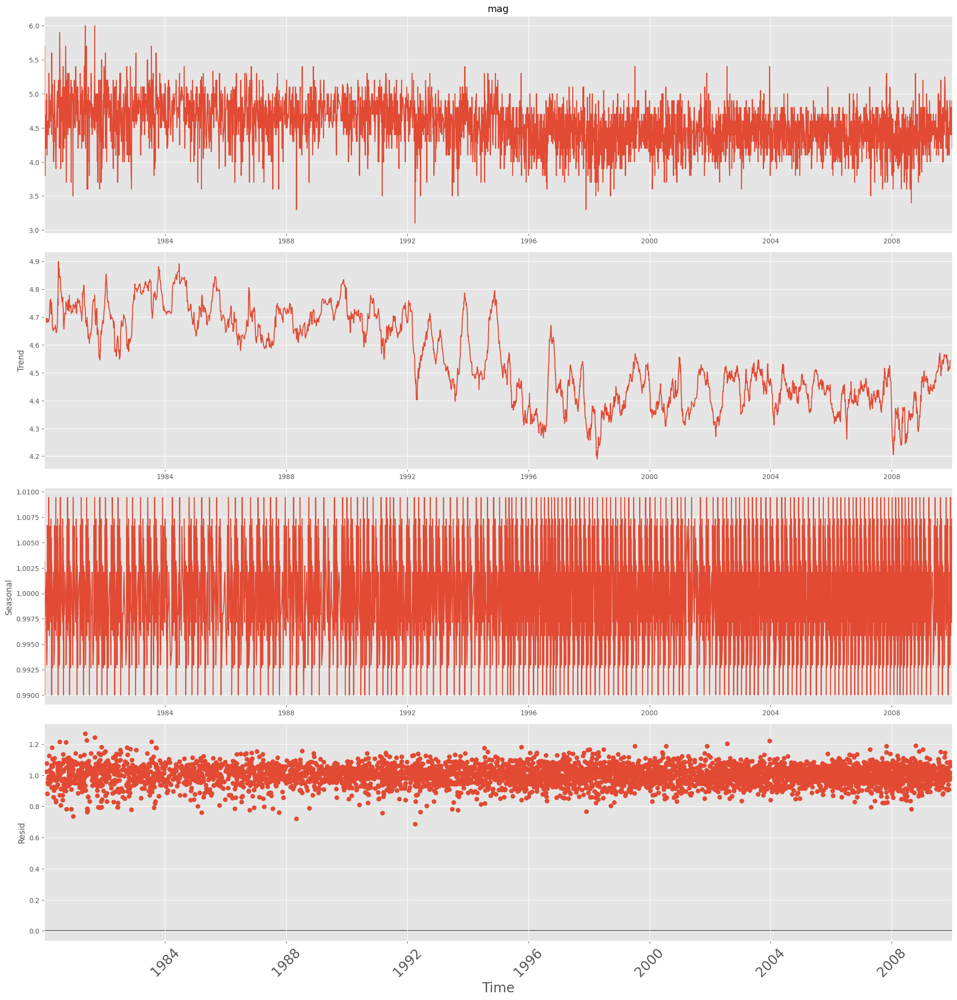

In [72]:
# Multiplicative Decomposition
mul_res = seasonal_decompose(x=daily_data_['mag'], model="multiplicative", period=30)
plt.rcParams['figure.figsize']=(20,20)
mul_res.plot()
plt.xlabel('Time', fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=45, fontsize=20)
plt.show()

### Rolling window statistics

In [73]:
# Create window features for rolling window
transformer = WindowFeatures(
    variables=["mag"],
    functions=["mean", "std"],
    window=[1,7,30,365], # Day, week, month, year.
)

df_rolling = transformer.fit_transform(daily_data_)

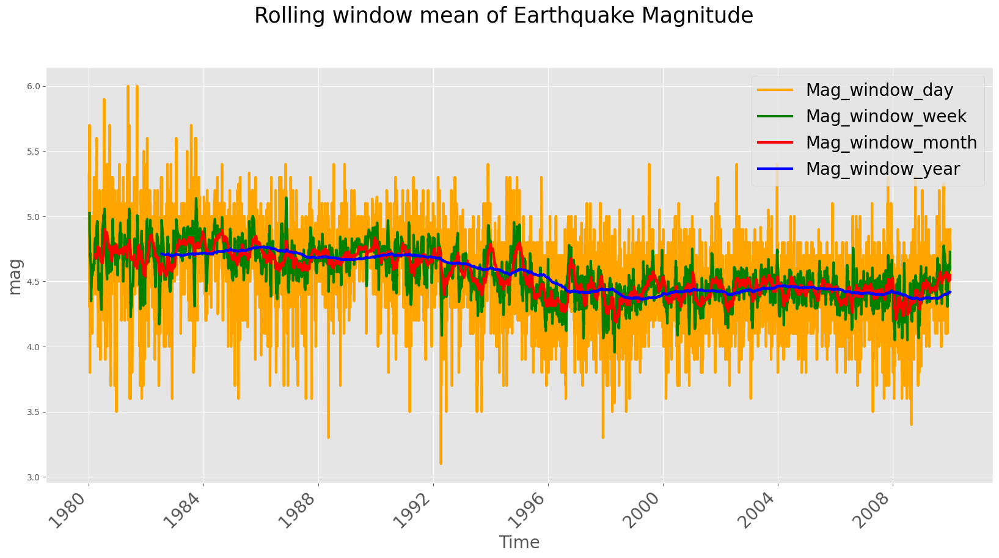

In [74]:
# Plot time series with mean rolling window for day, week month and year
colors = ['orange', 'green', 'red', 'blue']
df_rolling.filter(
    regex="mag_.*?_mean", # `.*?` means any number of any characters.
    axis=1  # Filter by column names.
).plot(color=colors, linewidth=3,figsize=(20,10))
my_labels=['Mag_window_day', 'Mag_window_week','Mag_window_month','Mag_window_year']
plt.suptitle("Rolling window mean of Earthquake Magnitude",fontsize=25)
plt.xlabel('Time', fontsize=20)
plt.ylabel('mag', fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=45, fontsize=20)
plt.legend(my_labels,fontsize=20)
plt.show()

### Remove outliers

In [75]:
def is_outlier(x):
    return 'yes' if x == -1 else 'no'

model = IsolationForest(contamination=0.025, random_state=0)
predictions = model.fit_predict(df4[['mag']])
outliers = np.vectorize(is_outlier)(predictions)
outliers_series = pd.DataFrame(outliers, columns=['outliers'], index=df4.index)
df4_ = pd.concat([df4, outliers_series], axis=1)


In [76]:
df4_.query('outliers=="yes"')

,latitude,longitude,depth,mag,place,year,month,day,hour,outliers
time,,,,,,,,,,
1980-01-02 20:58:44.200000+00:00,5.984,126.188,63.0,6.0,"Mindanao, Philippines",1980,1,2,20,yes
1980-01-02 21:48:16.500000+00:00,5.935,126.132,76.0,5.7,"Mindanao, Philippines",1980,1,2,21,yes
1980-01-03 20:22:28.100000+00:00,5.688,126.023,114.0,5.8,"Mindanao, Philippines",1980,1,3,20,yes
1980-01-08 10:08:45.900000+00:00,5.672,126.038,112.0,5.7,"Mindanao, Philippines",1980,1,8,10,yes
1980-02-29 11:13:26.700000+00:00,6.299,126.881,104.0,6.1,"Mindanao, Philippines",1980,2,29,11,yes
...,...,...,...,...,...,...,...,...,...,...
2008-08-11 13:54:02.430000+00:00,13.576,121.082,173.8,3.6,"Mindoro, Philippines",2008,8,11,13,yes
2008-08-25 20:01:43.830000+00:00,15.062,119.776,73.4,3.4,"Luzon, Philippines",2008,8,25,20,yes
2008-11-29 22:58:15.240000+00:00,9.394,126.208,84.0,3.6,"Mindanao, Philippines",2008,11,29,22,yes


In [77]:
df4_.query('outliers=="yes"').shape

(157, 10)

In [78]:
df5 = df4_.query('outliers=="no"')

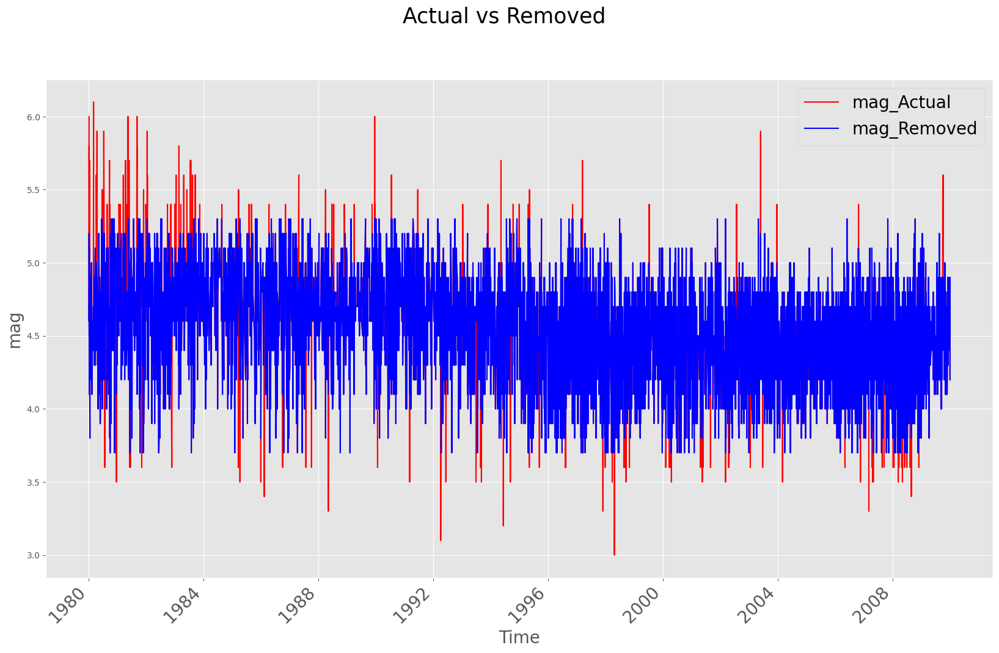

In [79]:
# Actual distribution vs new distribution plot
plt.rcParams['figure.figsize']=(20,12)
df4['mag'].plot(style="r-")
df5['mag'].plot(style="b-")
my_labels=['mag_Actual', 'mag_Removed']
plt.suptitle("Actual vs Removed",fontsize=25)
plt.xlabel('Time', fontsize=20)
plt.ylabel('mag', fontsize=20)
plt.yticks(rotation=0)
plt.xticks(rotation=45, fontsize=20)
plt.legend(my_labels,fontsize=20)
plt.show()

In [80]:
# Split data set between target variable and features
X_full = df5.copy()
y = X_full.mag
X_full.drop(['mag'], axis=1, inplace=True)
# Drop useless features
X_full.drop(['year','month','day','hour','outliers'], axis=1, inplace=True)

### Categorical features analysis

The greater observations concern Mindanao Island, that also have registered highest magnitude.

In [81]:
# let's have a look at how many labels for categorical features
for col in X_full.columns:
    if X_full[col].dtype =="object":
        print(col, ': ', len(X_full[col].unique()), ' labels')

place :  25  labels


In [82]:
# Select categorical columns with relatively low cardinality (convenient but arbitrary)
categorical_cols = [var for var in X_full.columns if
                    X_full[var].dtype == "object"]

In [83]:
# Subset with categorical features
cat = X_full[categorical_cols]
cat.columns

Index(['place'], dtype='object')

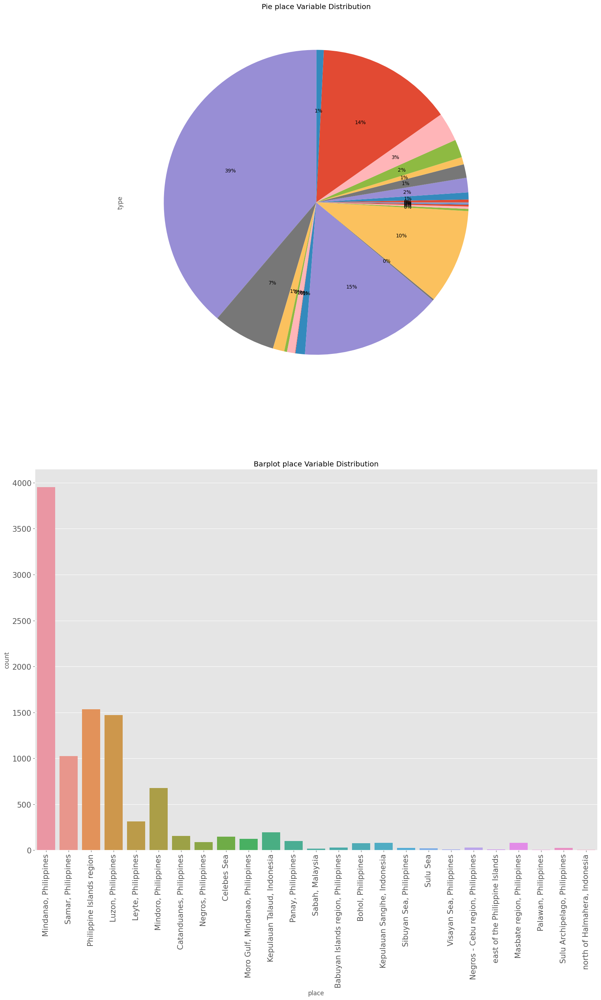

In [84]:
plot_cat(df, col1='place', col2='type')

In [85]:
# Univariate analysis looking at frequency
for col in cat:
    count = pd.crosstab(index = cat[col], columns="count")
    percentage = pd.crosstab(index = cat[col], columns="frequency")/pd.crosstab(index = cat[col], columns="frequency").sum()
    tab = pd.concat([count, percentage], axis=1)
    print('\n',tab)


 col_0                                count  frequency
place                                                
Babuyan Islands region, Philippines     20   0.002262
Bohol, Philippines                      65   0.007351
Catanduanes, Philippines               126   0.014250
Celebes Sea                            130   0.014703
Kepulauan Sangihe, Indonesia            72   0.008143
Kepulauan Talaud, Indonesia            167   0.018887
Leyte, Philippines                     264   0.029857
Luzon, Philippines                    1278   0.144537
Masbate region, Philippines             63   0.007125
Mindanao, Philippines                 3397   0.384189
Mindoro, Philippines                   584   0.066048
Moro Gulf, Mindanao, Philippines       105   0.011875
Negros - Cebu region, Philippines       27   0.003054
Negros, Philippines                     76   0.008595
Palawan, Philippines                     3   0.000339
Panay, Philippines                      85   0.009613
Philippine Islands region 

### Numerical features analysis

Numerical features show skewness in the distribution and depth shows many outliers.

In [86]:
# Select numerical columns
numerical_cols = [var for var in X_full.columns if X_full[var].dtype in ['float64','int64']]

In [87]:
# Subset with numerical features
num = X_full[numerical_cols]
num.columns

Index(['latitude', 'longitude', 'depth'], dtype='object')

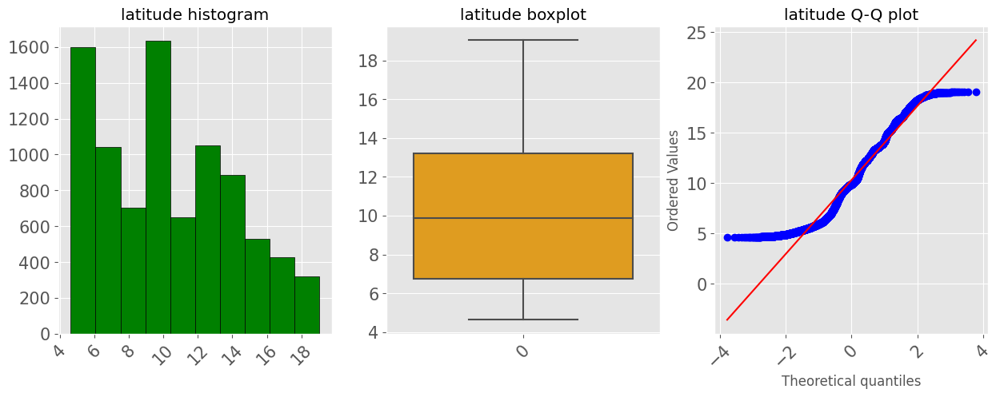

In [88]:
plot_num(num, var='latitude')

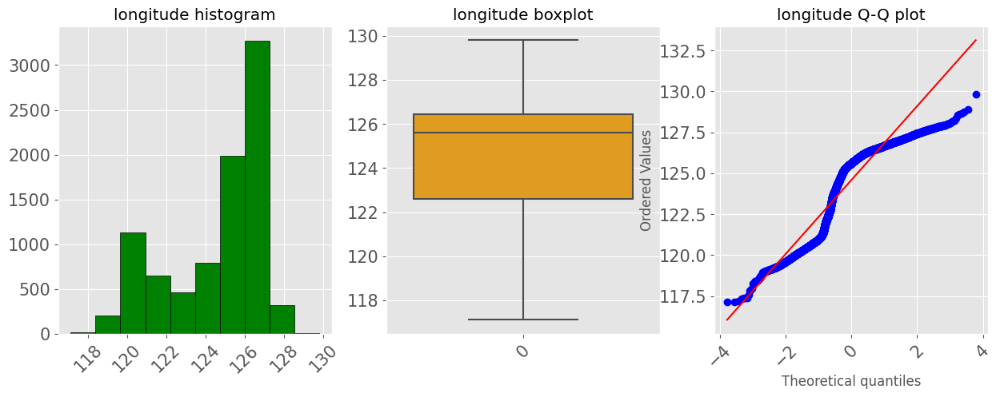

In [89]:
plot_num(num, var='longitude')

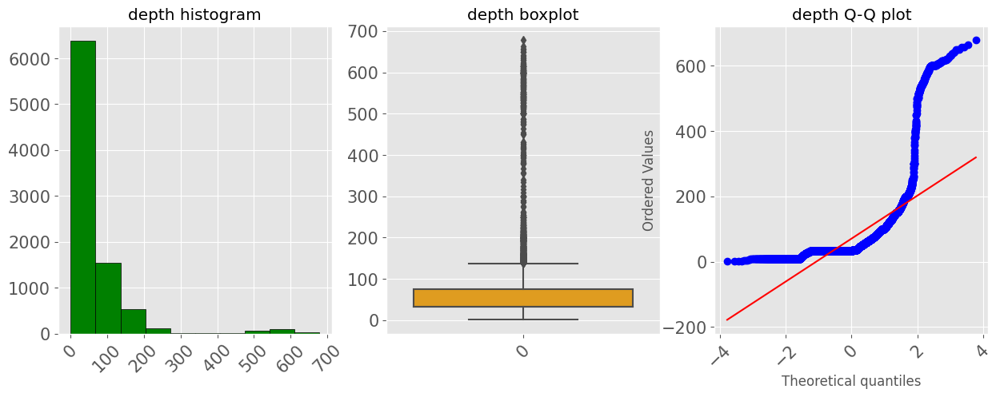

In [90]:
plot_num(num, var='depth')

### Feature engineering for Categorical features and Lag features

In [91]:
def distance_correlation(a,b):
    return dcor.distance_correlation(a,b)

In [92]:
distance_correlation(df5['longitude'], df5['latitude'])

0.7022654112258493

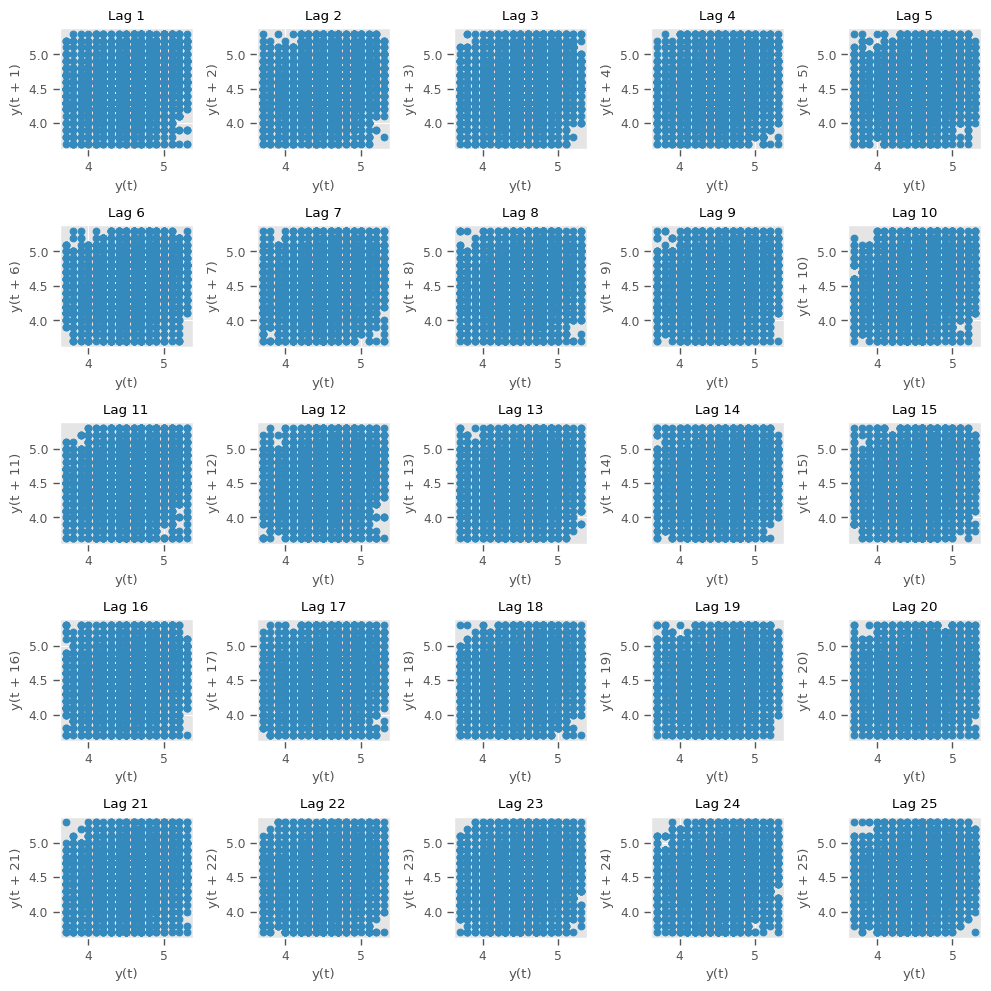

In [93]:
with sns.plotting_context("paper"):
    fig, ax = plt.subplots(nrows=5, ncols=5, figsize=[10, 10])
    for i, ax_ in enumerate(ax.flatten()):
        lag_series = df5["mag"].shift(i + 1)
        pd.plotting.lag_plot(df5["mag"], lag=i + 1, ax=ax_)
        ax_.set_title(f"Lag {i+1}")
        ax_.ticklabel_format(style="sci", scilimits=(0, 0))
    plt.tight_layout()


In [94]:
# Lag features
df_tot = pd.concat(
    [
        y,
        num,
        cat,
    ],
    axis="columns")

In [95]:
# Remove nan values
df_tot = df_tot.dropna()

In [96]:
# Mean encoding
enc = MeanEncoder()
y = df_tot['mag']
X = df_tot.drop(['mag'], axis=1)
enc.fit(X, y)
X_t = enc.transform(X)

### Correlation Heatmap

In [97]:
# Correlation heatmap
corr_matrix = df_tot.corr()

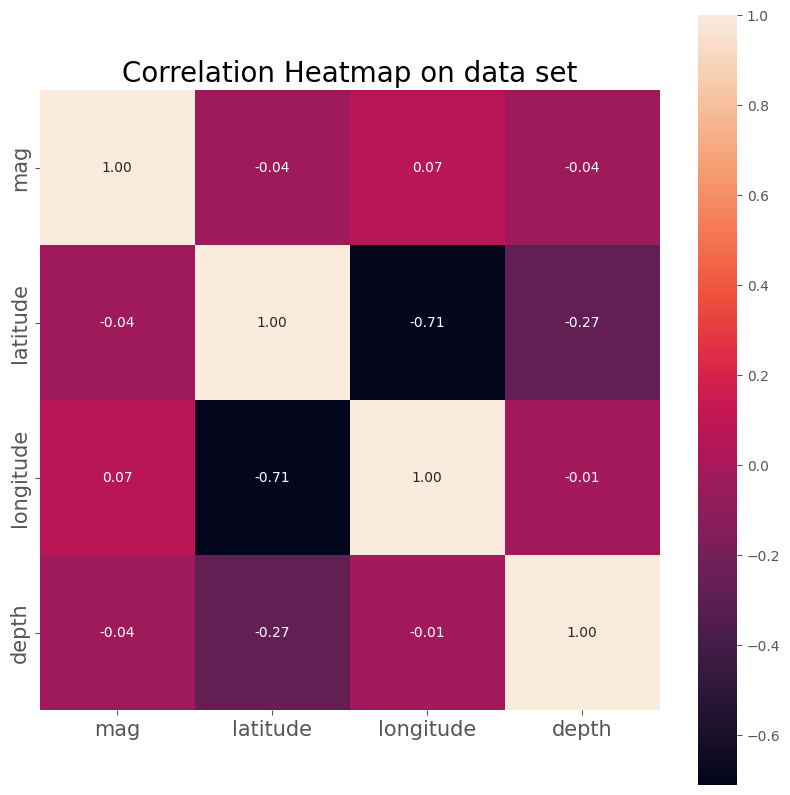

In [98]:
plt.rcParams['figure.figsize']=(10,10)
plt.figure()
sns.heatmap(corr_matrix, square = True, annot=True, fmt='.2f')
plt.title('Correlation Heatmap on data set',size=20)
plt.yticks(fontsize="15")
plt.xticks(fontsize="15")
plt.show()

### Split data set & pre-processing

In [99]:
# Test set on 1 year
split_point = '2009-01-01'
X_train, X_test = X_t[X_t.index<split_point], X_t[X_t.index>=split_point]
y_train, y_test = y[y.index<split_point], y[y.index>=split_point]
len(X_train), len(X_test)

(8605, 237)

In [100]:
# Split for time series cross validation
ts_cv = TimeSeriesSplit(n_splits=5)
# splits
splits = list(ts_cv.split(X_t, y))

In [101]:
scaling = MinMaxScaler()

In [102]:
# Scaled features for KNN and NN, DL, CNN
X_sc= pd.DataFrame(scaling.fit_transform(X_t),columns= ['latitude','longitude','depth','place'])
X_train_sc= pd.DataFrame(scaling.fit_transform(X_train),columns= ['latitude','longitude','depth','place'])
X_test_sc= pd.DataFrame(scaling.fit_transform(X_test),columns= ['latitude','longitude','depth','place'])
y_sc = scaling.fit_transform(pd.DataFrame(y).values.reshape(-1,1))
y_train_sc = scaling.fit_transform(pd.DataFrame(y_train).values.reshape(-1,1))
y_test_sc = scaling.fit_transform(pd.DataFrame(y_test).values.reshape(-1,1))

### Modelling

Models have been fitted in the noraml way with the mean regression and then with 3 quantile points: 0.05 lower quantile, 0.50 median quantile, and 0.95 upper quantile. The dataset was splitted in two parts: train set from 1980 to 2008 and test set equal to 2009 as test set used for prediction. In the training process has been used the time series split cross validation with 5 folds suitable for a proper evaluation splitting strategies that takes into account the temporal structure of the dataset to evaluate the model's ability to predict data points in the future. Gradient Boosting Machine in scikit-learn allows to model the quantile loss function, just declare it and so on the quantile point.
For K-Nearest-Neighbours and Random Forest have been employed modified version with quantile regression, meanwhile for the neural networks family models have been created models from scratch using tensorflow.
Models have been trained with default hyperparameters values, given several points to train. Default values are enough to understand if the model is suitable for your data points.

### K-Nearest Neighbours

In [103]:
# Evaluation following quantile approach
KNN = KNeighborsRegressor()
param_grid = {}
KNN_model = GridSearchCV(KNN,param_grid,cv=ts_cv)
KNN_model.fit(X_train_sc,np.log1p(y_train_sc))
knn_mean_tr = KNN_model.predict(X_train_sc)
knn_mean_te = KNN_model.predict(X_test_sc)
qKNN = KNeighborsQuantileRegressor(q=[0.05, 0.5, 0.95])
qKNN_model = GridSearchCV(qKNN,param_grid,cv=ts_cv)
qKNN_model.fit(X_train_sc,np.log1p(y_train_sc))
qKNN_pred_tr = qKNN_model.predict(X_train_sc)
qKNN_pred_te = qKNN_model.predict(X_test_sc)
qknn_lower_tr = qKNN_pred_tr[0,:,0]
qknn_lower_te = qKNN_pred_te[0,:,0]
qknn_median_tr = qKNN_pred_tr[1,:,0]
qknn_median_te = qKNN_pred_te[1,:,0]
qknn_upper_tr = qKNN_pred_tr[2,:,0]
qknn_upper_te = qKNN_pred_te[2,:,0]

In [104]:
#Train evaluation
mae_knn_mean_tr = mean_absolute_error(np.log1p(y_train_sc), knn_mean_tr)
rmse_knn_mean_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), knn_mean_tr))
mae_qknn_lower_tr = mean_absolute_error(np.log1p(y_train_sc), qknn_lower_tr)
rmse_qknn_lower_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qknn_lower_tr))
mae_qknn_median_tr = mean_absolute_error(np.log1p(y_train_sc), qknn_median_tr)
rmse_qknn_median_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qknn_median_tr))
mae_qknn_upper_tr = mean_absolute_error(np.log1p(y_train_sc), qknn_upper_tr)
rmse_qknn_upper_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qknn_upper_tr))


In [105]:
#Test evaluation
mae_knn_mean_te = mean_absolute_error(np.log1p(y_test_sc), knn_mean_te)
rmse_knn_mean_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), knn_mean_te))
mae_qknn_lower_te = mean_absolute_error(np.log1p(y_test_sc), qknn_lower_te)
rmse_qknn_lower_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qknn_lower_te))
mae_qknn_median_te = mean_absolute_error(np.log1p(y_test_sc), qknn_median_te)
rmse_qknn_median_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qknn_median_te))
mae_qknn_upper_te = mean_absolute_error(np.log1p(y_test_sc), qknn_upper_te)
rmse_qknn_upper_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qknn_upper_te))


In [106]:
# knn metrics table
df_knn = {'model': ['KNN','KNN'],
        'evaluation':['MAE','RMSE'],
        'train_mean':[mae_knn_mean_tr,rmse_knn_mean_tr],
        'test_mean': [mae_knn_mean_te,rmse_knn_mean_te],
        'train_lower': [mae_qknn_lower_tr,rmse_qknn_lower_tr],
        'test_lower': [mae_qknn_lower_te,rmse_qknn_lower_te],
        'train_median': [mae_qknn_median_tr,rmse_qknn_median_tr],
        'test_median': [mae_qknn_median_te,rmse_qknn_median_te],
        'train_upper': [mae_qknn_median_tr,rmse_qknn_upper_tr],
        'test_upper': [mae_qknn_median_te,rmse_qknn_upper_te]
         }
df_knn = pd.DataFrame(data=df_knn, columns=['model','evaluation',
                                            'train_lower','test_lower',
                                            'train_mean','test_mean',
                                           'train_median','test_median',
                                           'train_upper','test_upper'])
df_knn

,model,evaluation,train_lower,test_lower,train_mean,test_mean,train_median,test_median,train_upper,test_upper
0,KNN,MAE,0.146551,0.218374,0.092670,0.130619,0.085718,0.135926,0.085718,0.135926
1,KNN,RMSE,0.191989,0.257147,0.117534,0.159268,0.124681,0.163720,0.180733,0.181969


In [107]:
# create data as a list of dictionaries
df_knn_MAE_tr = [
  {'MAE': 'train_lower', 'value': mae_qknn_lower_tr},
  {'MAE': 'train_mean', 'value': mae_knn_mean_tr},
  {'MAE': 'train_median', 'value': mae_qknn_median_tr},
  {'MAE': 'train_upper', 'value': mae_qknn_upper_tr},
]

# create the DataFrame
df_knn_MAE_tr = pd.DataFrame(df_knn_MAE_tr)

# print the DataFrame
df_knn_MAE_tr


,MAE,value
0,train_lower,0.146551
1,train_mean,0.092670
2,train_median,0.085718
3,train_upper,0.132605


In [108]:
# create data as a list of dictionaries
df_knn_RMSE_tr = [
  {'RMSE': 'train_lower', 'value': rmse_qknn_lower_tr},
  {'RMSE': 'train_mean', 'value': rmse_knn_mean_tr},
  {'RMSE': 'train_median', 'value': rmse_qknn_median_tr},
  {'RMSE': 'train_upper', 'value': rmse_qknn_upper_tr},
]

# create the DataFrame
df_knn_RMSE_tr = pd.DataFrame(df_knn_RMSE_tr)

# print the DataFrame
df_knn_RMSE_tr


,RMSE,value
0,train_lower,0.191989
1,train_mean,0.117534
2,train_median,0.124681
3,train_upper,0.180733


In [109]:
# create data as a list of dictionaries
df_knn_MAE_te = [
  {'MAE': 'test_lower', 'value': mae_qknn_lower_te},
  {'MAE': 'test_mean', 'value': mae_knn_mean_te},
  {'MAE': 'test_median', 'value': mae_qknn_median_te},
  {'MAE': 'test_upper', 'value': mae_qknn_upper_te},
]

# create the DataFrame
df_knn_MAE_te = pd.DataFrame(df_knn_MAE_te)

# print the DataFrame
df_knn_MAE_te


,MAE,value
0,test_lower,0.218374
1,test_mean,0.130619
2,test_median,0.135926
3,test_upper,0.143642


In [110]:
# create data as a list of dictionaries
df_knn_RMSE_te = [
  {'RMSE': 'test_lower', 'value': rmse_qknn_lower_te},
  {'RMSE': 'test_mean', 'value': rmse_knn_mean_te},
  {'RMSE': 'test_median', 'value': rmse_qknn_median_te},
  {'RMSE': 'test_upper', 'value': rmse_qknn_upper_te},
]

# create the DataFrame
df_knn_RMSE_te = pd.DataFrame(df_knn_RMSE_tr)

# print the DataFrame
df_knn_RMSE_te


,RMSE,value
0,train_lower,0.191989
1,train_mean,0.117534
2,train_median,0.124681
3,train_upper,0.180733


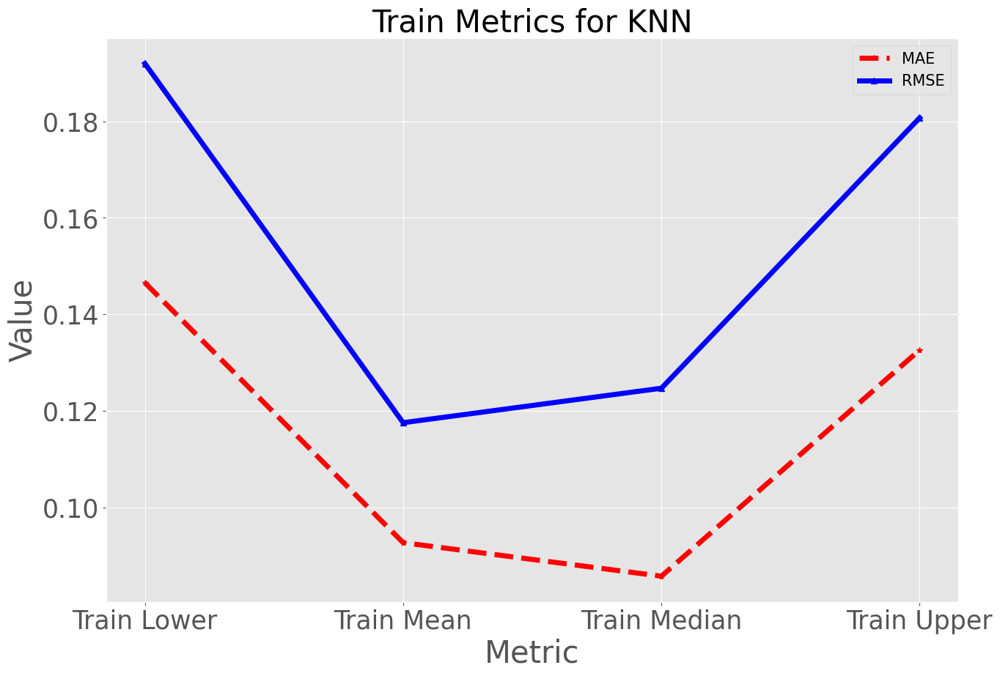

In [111]:
train_metrics_model(mae_qknn_lower_tr, mae_knn_mean_tr, mae_qknn_median_tr, mae_qknn_upper_tr,
                   rmse_qknn_lower_tr, rmse_knn_mean_tr, rmse_qknn_median_tr, rmse_qknn_upper_tr,'KNN')

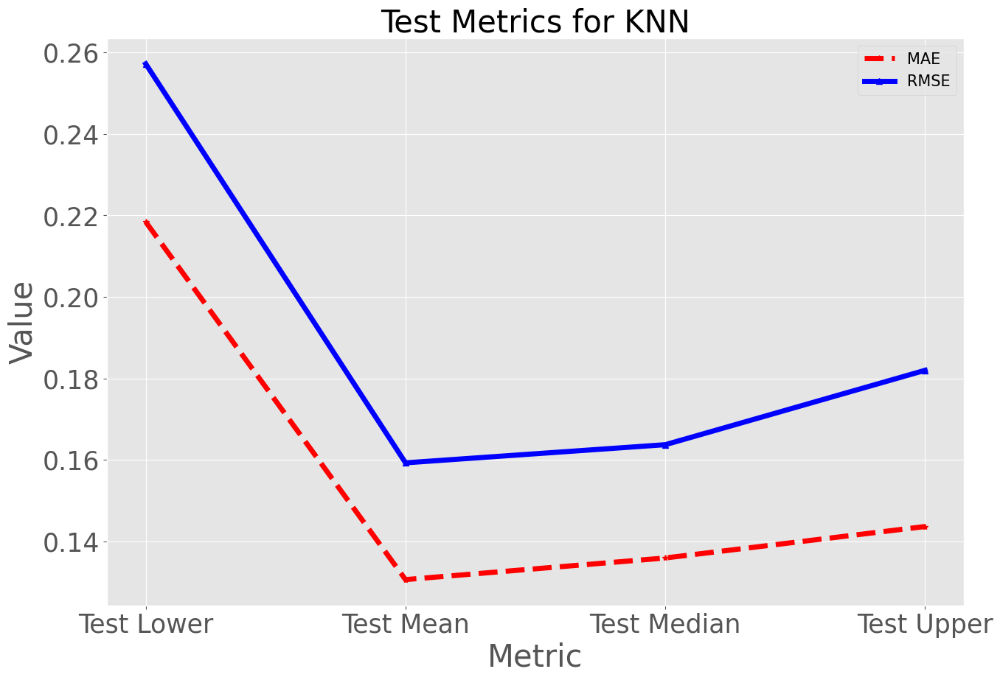

In [112]:
test_metrics_model(mae_qknn_lower_te, mae_knn_mean_te, mae_qknn_median_te, mae_qknn_upper_te,
                   rmse_qknn_lower_te, rmse_knn_mean_te, rmse_qknn_median_te, rmse_qknn_upper_te,'KNN')

In [113]:
# Transformations
qknn_lower_ = scaling.inverse_transform(np.expm1(qknn_lower_te).reshape(-1,1))
qknn_median_ = scaling.inverse_transform(np.expm1(qknn_median_te).reshape(-1,1))
qknn_upper_ = scaling.inverse_transform(np.expm1(qknn_upper_te).reshape(-1,1))
knn_mean_ = scaling.inverse_transform(np.expm1(knn_mean_te).reshape(-1,1))

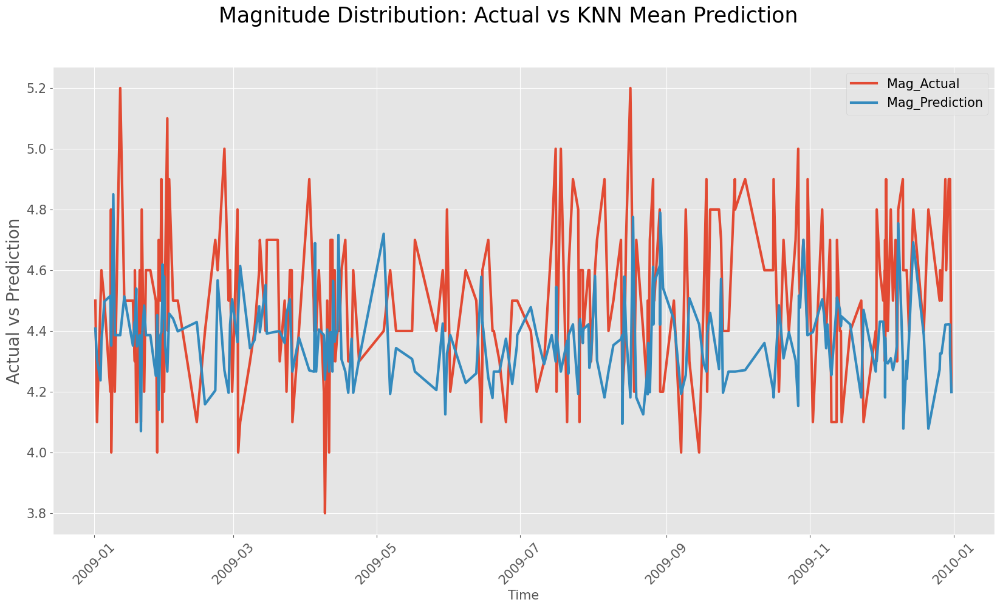

In [114]:
tsmultiplot(y_test, knn_mean_, 'KNN')

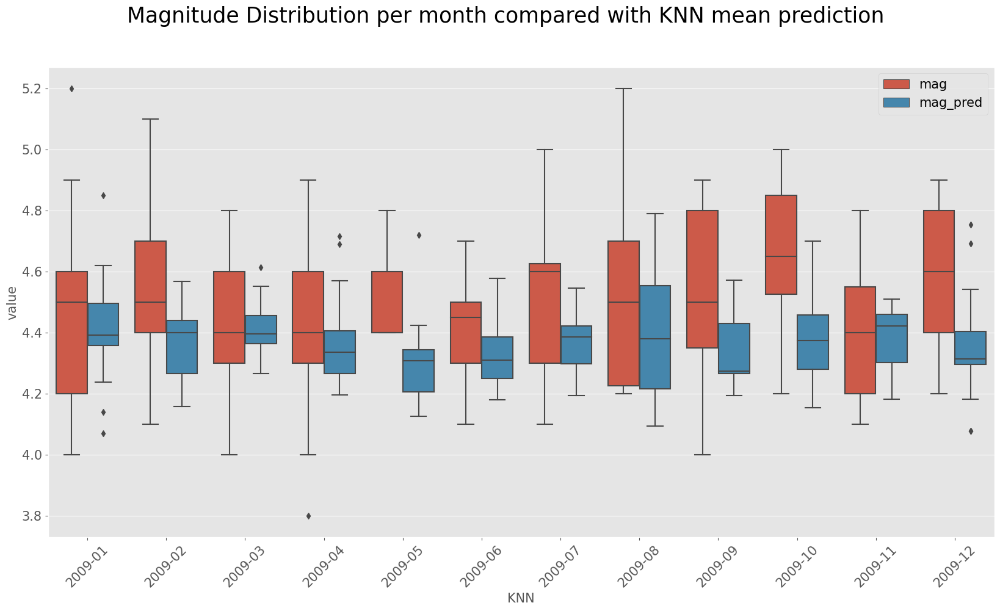

In [115]:
boxplot2(y_test, knn_mean_, 'KNN')

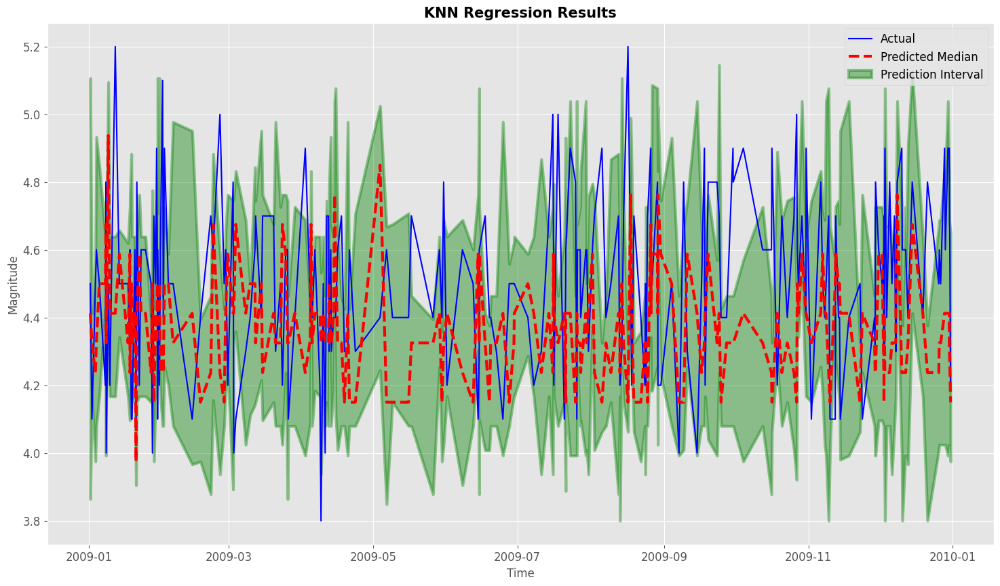

In [116]:
results_tsplot(qknn_lower_, knn_mean_, qknn_median_, qknn_upper_,'KNN')

In [117]:
# lower Percentile
percentile_KNN_lower = (qknn_lower_ > y_test.values).mean()
percentile_KNN_lower

0.09037013299150777

In [118]:
# Median percentile
percentile_KNN_median=(qknn_median_ > y_test.values).mean()
percentile_KNN_median

0.34276914312165074

In [119]:
# Upper percentile
percentile_KNN_upper=(qknn_upper_ > y_test.values).mean()
percentile_KNN_upper

0.7222845341736545

In [120]:
# Coverage
coverage_KNN= np.logical_and(
        qknn_lower_ < y_test.values,
        qknn_upper_ > y_test.values).mean()
coverage_KNN

0.6318253841086721

In [121]:
# Mean Features Importance
print('KNN mean prediction Features Permutation Importance')
KNN_perm_mean = PermutationImportance(KNN_model, random_state=0).fit(X_test_sc, np.log1p(y_test_sc))
FI_KNN_mean = eli5.show_weights(KNN_perm_mean, feature_names = X_test.columns.tolist())
FI_KNN_mean

KNN mean prediction Features Permutation Importance


Weight,Feature
-0.0091 ± 0.1147,place
-0.0134 ± 0.0854,depth
-0.1382 ± 0.1231,longitude
-0.1896 ± 0.1457,latitude


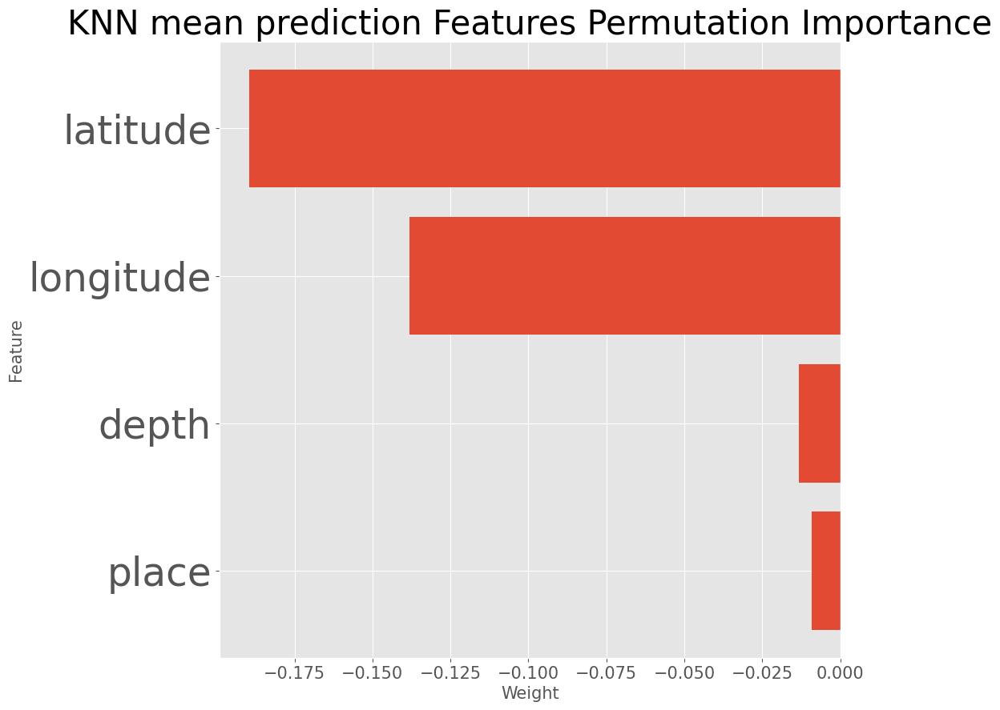

In [122]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [-0.0091, -0.0134, -0.1382, -0.1896]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('KNN mean prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

# Show the plot
plt.show()

In [123]:
# Lower Features Importance
print('KNN lower prediction Features Permutation Importance')
qKNN = KNeighborsQuantileRegressor(q=[0.05])
qKNN_model_05 = GridSearchCV(qKNN,param_grid,cv=ts_cv)
qKNN_model_05.fit(X_train_sc,np.log1p(y_train_sc))
KNN_perm_lower = PermutationImportance(qKNN_model_05, random_state=0).fit(X_test_sc, np.log1p(y_test_sc))
FI_KNN_lower = eli5.show_weights(KNN_perm_lower, feature_names = X_test.columns.tolist())
FI_KNN_lower

KNN lower prediction Features Permutation Importance


Weight,Feature
0.0476 ± 0.1396,place
-0.0547 ± 0.2826,depth
-0.0691 ± 0.2370,latitude
-0.2527 ± 0.2768,longitude


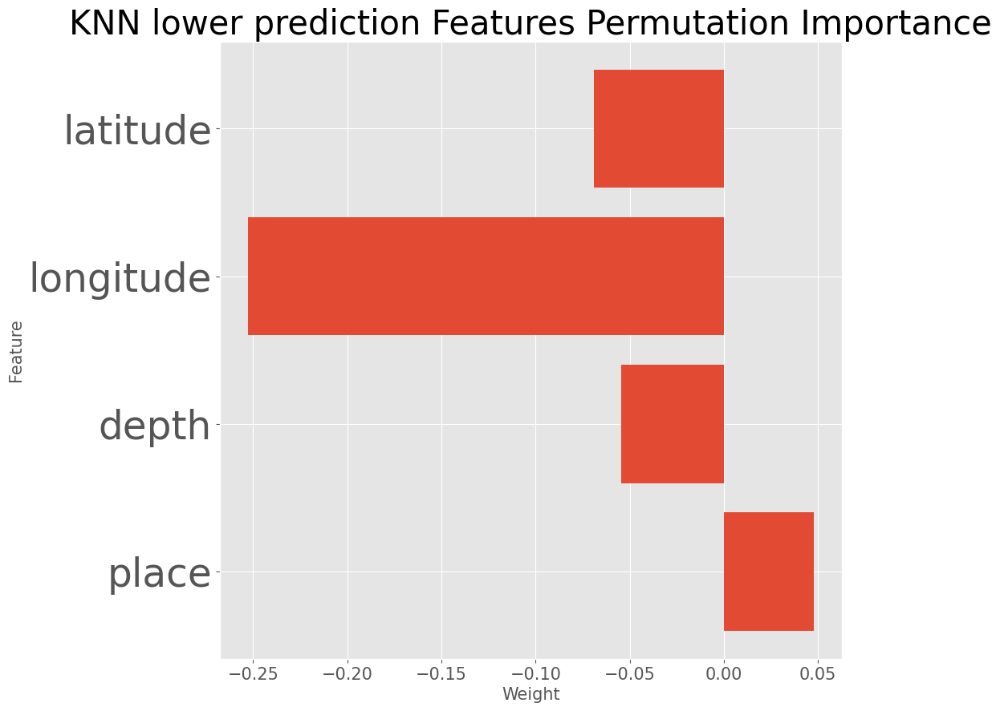

In [124]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0476, -0.0547, -0.2527, -0.0691]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('KNN lower prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

# Show the plot
plt.show()

In [125]:
# Median Features Importance
print('KNN median prediction Features Permutation Importance')
qKNN = KNeighborsQuantileRegressor(q=[0.50])
qKNN_model_50 = GridSearchCV(qKNN,param_grid,cv=ts_cv)
qKNN_model_50.fit(X_train_sc,np.log1p(y_train_sc))
KNN_perm_median = PermutationImportance(qKNN_model_50, random_state=0).fit(X_test_sc, np.log1p(y_test_sc))
FI_KNN_median = eli5.show_weights(KNN_perm_median, feature_names = X_test.columns.tolist())
FI_KNN_median

KNN median prediction Features Permutation Importance


Weight,Feature
0.0079 ± 0.0982,place
-0.0386 ± 0.0926,depth
-0.0561 ± 0.1467,longitude
-0.1977 ± 0.1302,latitude


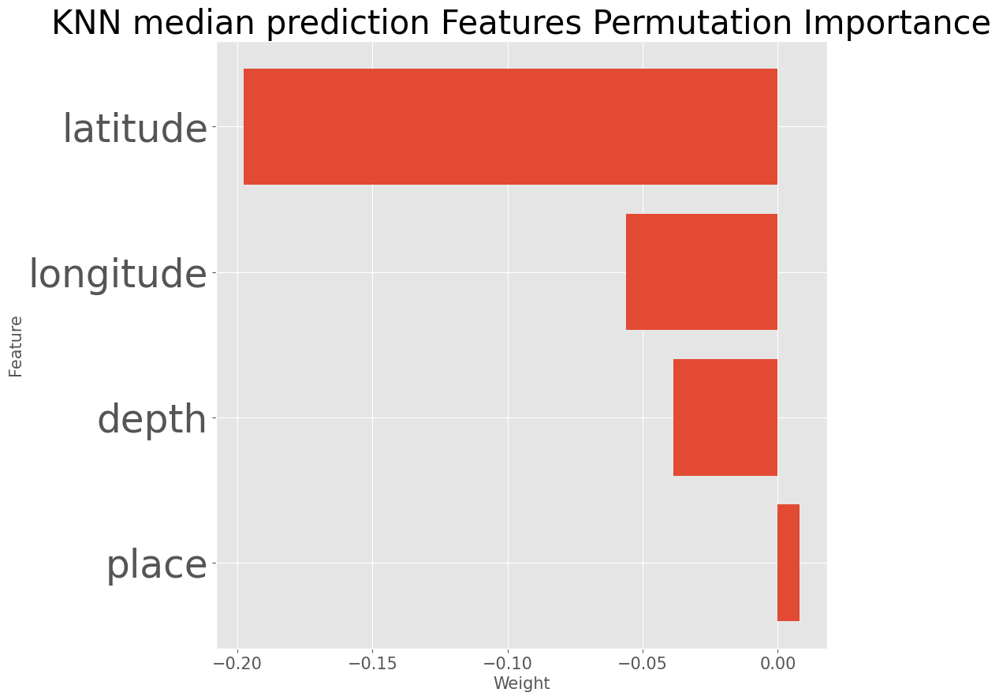

In [126]:
## Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0079, -0.0386, -0.0561, -0.1977]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('KNN median prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

# Show the plot
plt.show()

In [127]:
# Upper Features Importance
print('KNN upper prediction Features Permutation Importance')
qKNN = KNeighborsQuantileRegressor(q=[0.95])
qKNN_model_95 = GridSearchCV(qKNN,param_grid,cv=ts_cv)
qKNN_model_95.fit(X_train_sc,np.log1p(y_train_sc))
KNN_perm_upper = PermutationImportance(qKNN_model_95, random_state=0).fit(X_test_sc, np.log1p(y_test_sc))
FI_KNN_upper = eli5.show_weights(KNN_perm_upper, feature_names = X_test.columns.tolist())
FI_KNN_upper

KNN upper prediction Features Permutation Importance


Weight,Feature
0.0051 ± 0.2237,place
-0.1295 ± 0.1277,depth
-0.1812 ± 0.1019,longitude
-0.2073 ± 0.2183,latitude


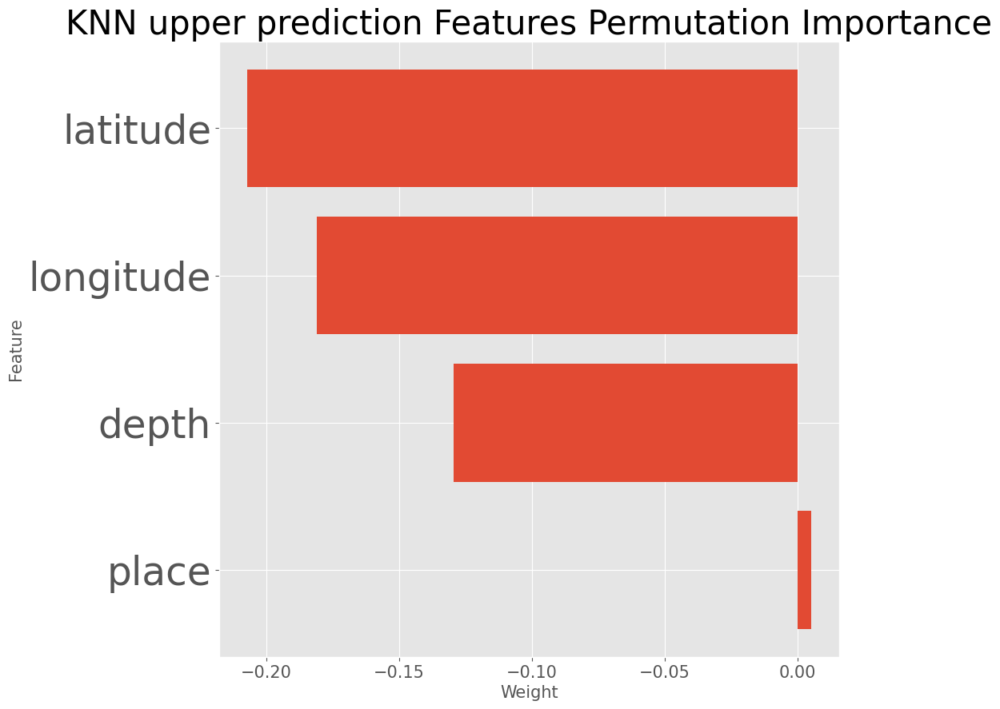

In [128]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0051, -0.1295, -0.1812, -0.2073]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('KNN upper prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

# Show the plot
plt.show()

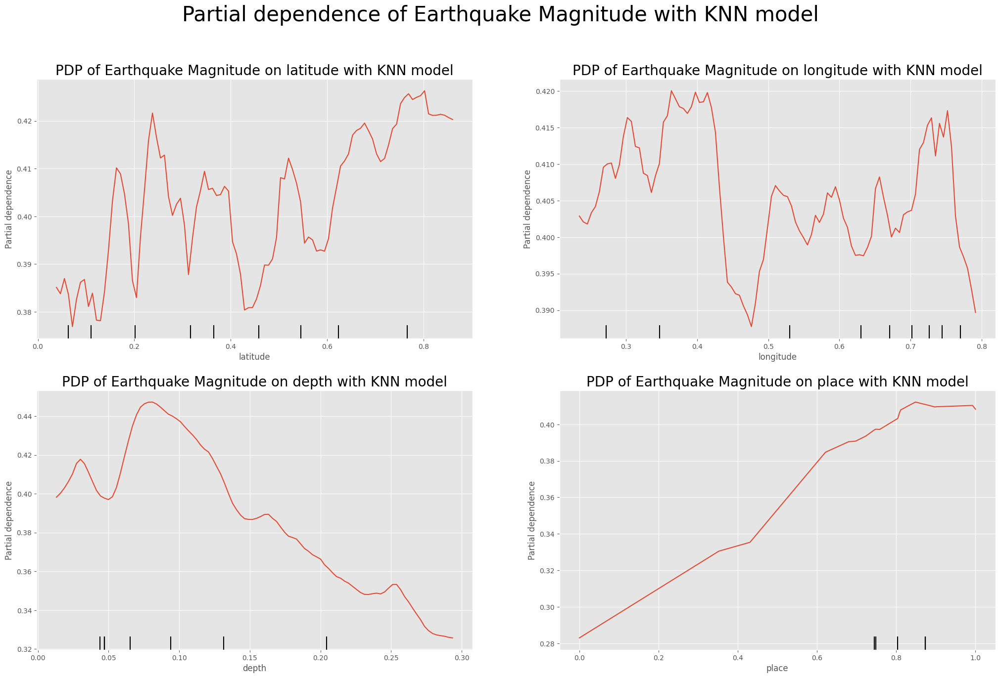

In [129]:
# Mean Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with KNN model',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(KNN_model, X_sc, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with KNN model', fontsize=20)

plt.show()

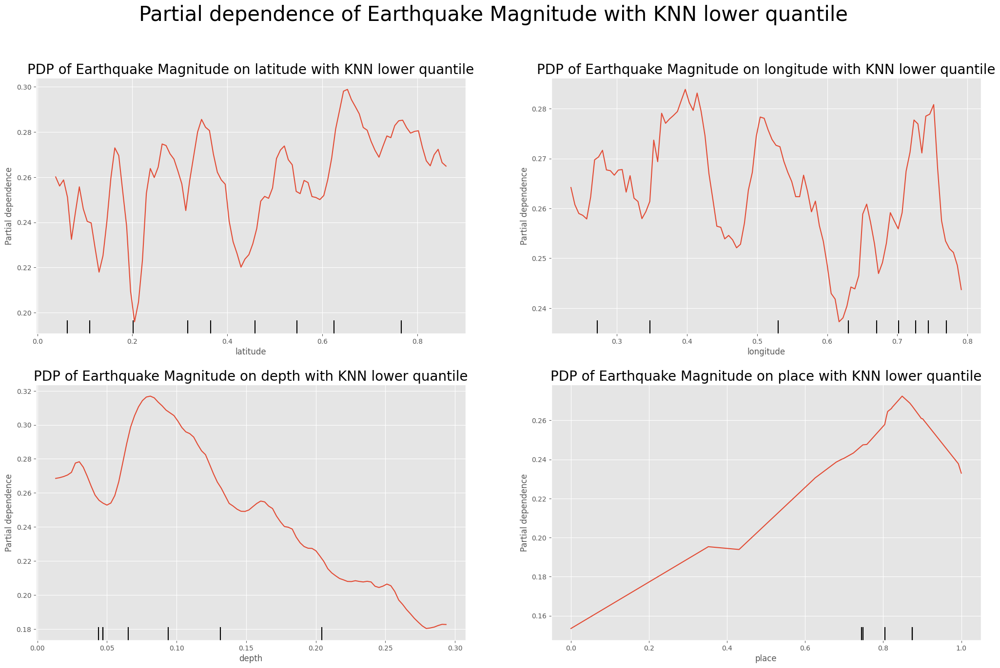

In [130]:
# Lower Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with KNN lower quantile',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(qKNN_model_05, X_sc, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with KNN lower quantile', fontsize=20)

plt.show()

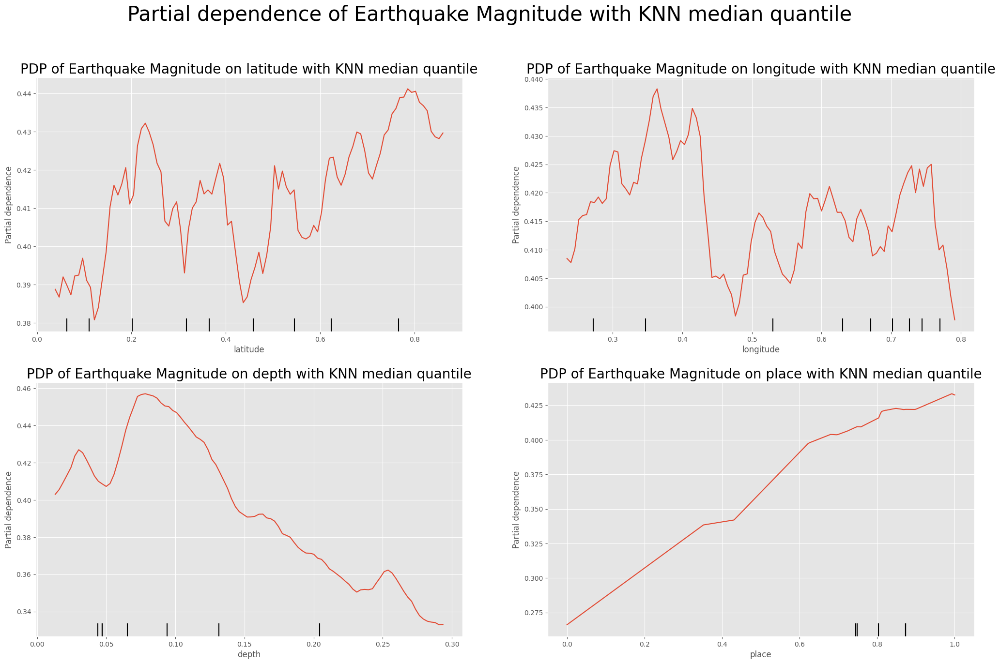

In [131]:
# Median Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with KNN median quantile',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(qKNN_model_50, X_sc, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with KNN median quantile', fontsize=20)

plt.show()

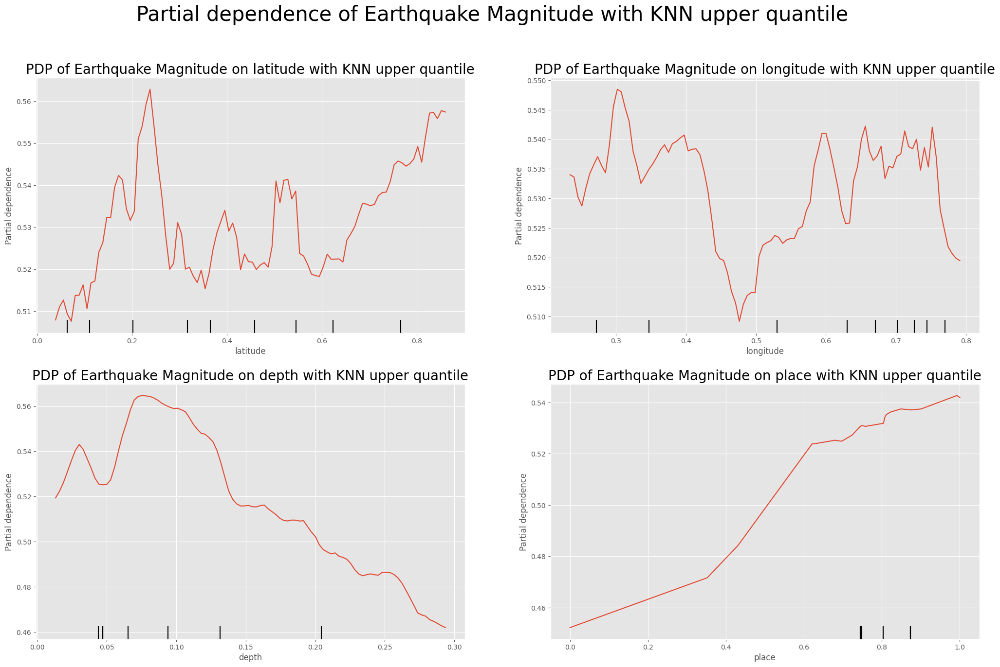

In [132]:
# Upper Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with KNN upper quantile',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(qKNN_model_95, X_sc, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with KNN upper quantile', fontsize=20)

plt.show()

### Random forest

In [133]:
# Evaluation following quantile approach
RF = RandomForestRegressor(random_state=0)
param_grid = {}
RF_model = GridSearchCV(RF,param_grid,cv=ts_cv)
RF_model.fit(X_train, np.log1p(y_train))
rf_mean_tr = RF_model.predict(X_train)
rf_mean_te = RF_model.predict(X_test)
qRF = RandomForestQuantileRegressor(q=[0.05, 0.5, 0.95])
qRF_model = GridSearchCV(qRF,param_grid,cv=ts_cv)
qRF_model.fit(X_train, np.log1p(y_train))
qRF_pred_tr = qRF_model.predict(X_train)
qRF_pred_te = qRF_model.predict(X_test)
qrf_lower_tr = qRF_pred_tr[0,:]
qrf_lower_te = qRF_pred_te[0,:]
qrf_median_tr = qRF_pred_tr[1,:]
qrf_median_te = qRF_pred_te[1,:]
qrf_upper_tr = qRF_pred_tr[2,:]
qrf_upper_te = qRF_pred_te[2,:]

In [134]:
#Train evaluation
mae_rf_mean_tr = mean_absolute_error(np.log1p(y_train), rf_mean_tr)
rmse_rf_mean_tr = np.sqrt(mean_squared_error(np.log1p(y_train), rf_mean_tr))
mae_qrf_lower_tr = mean_absolute_error(np.log1p(y_train), qrf_lower_tr)
rmse_qrf_lower_tr = np.sqrt(mean_squared_error(np.log1p(y_train), qrf_lower_tr))
mae_qrf_median_tr = mean_absolute_error(np.log1p(y_train), qrf_median_tr)
rmse_qrf_median_tr = np.sqrt(mean_squared_error(np.log1p(y_train), qrf_median_tr))
mae_qrf_upper_tr = mean_absolute_error(np.log1p(y_train), qrf_upper_tr)
rmse_qrf_upper_tr = np.sqrt(mean_squared_error(np.log1p(y_train), qrf_upper_tr))


In [135]:
#Test evaluation
mae_rf_mean_te = mean_absolute_error(np.log1p(y_test), rf_mean_te)
rmse_rf_mean_te = np.sqrt(mean_squared_error(np.log1p(y_test), rf_mean_te))
mae_qrf_lower_te = mean_absolute_error(np.log1p(y_test), qrf_lower_te)
rmse_qrf_lower_te = np.sqrt(mean_squared_error(np.log1p(y_test), qrf_lower_te))
mae_qrf_median_te = mean_absolute_error(np.log1p(y_test), qrf_median_te)
rmse_qrf_median_te = np.sqrt(mean_squared_error(np.log1p(y_test), qrf_median_te))
mae_qrf_upper_te = mean_absolute_error(np.log1p(y_test), qrf_upper_te)
rmse_qrf_upper_te = np.sqrt(mean_squared_error(np.log1p(y_test), qrf_upper_te))


In [136]:
# RF metrics table
df_rf = {'model': ['RF','RF'],
        'evaluation':['MAE','RMSE'],
        'train_mean':[mae_rf_mean_tr,rmse_rf_mean_tr],
        'test_mean': [mae_rf_mean_te,rmse_rf_mean_te],
        'train_lower': [mae_qrf_lower_tr,rmse_qrf_lower_tr],
        'test_lower': [mae_qrf_lower_te,rmse_qrf_lower_te],
        'train_median': [mae_qrf_median_tr,rmse_qrf_median_tr],
        'test_median': [mae_qrf_median_te,rmse_qrf_median_te],
        'train_upper': [mae_qrf_median_tr,rmse_qrf_upper_tr],
        'test_upper': [mae_qrf_median_te,rmse_qrf_upper_te]
         }
df_rf = pd.DataFrame(data=df_rf, columns=['model','evaluation',
                                            'train_lower','test_lower',
                                            'train_mean','test_mean',
                                           'train_median','test_median',
                                           'train_upper','test_upper'])
df_rf

,model,evaluation,train_lower,test_lower,train_mean,test_mean,train_median,test_median,train_upper,test_upper
0,RF,MAE,0.064804,0.087511,0.017634,0.041037,0.002299,0.045684,0.002299,0.045684
1,RF,RMSE,0.083981,0.102148,0.022288,0.051676,0.007342,0.057628,0.080780,0.096102


In [137]:
# create data as a list of dictionaries
df_rf_MAE_tr = [
  {'MAE': 'train_lower', 'value': mae_qrf_lower_tr},
  {'MAE': 'train_mean', 'value': mae_rf_mean_tr},
  {'MAE': 'train_median', 'value': mae_qrf_median_tr},
  {'MAE': 'train_upper', 'value': mae_qrf_upper_tr},
]

# create the DataFrame
df_rf_MAE_tr = pd.DataFrame(df_rf_MAE_tr)

# print the DataFrame
df_rf_MAE_tr

,MAE,value
0,train_lower,0.064804
1,train_mean,0.017634
2,train_median,0.002299
3,train_upper,0.060637


In [138]:
# create data as a list of dictionaries
df_rf_RMSE_tr = [
  {'RMSE': 'train_lower', 'value': rmse_qrf_lower_tr},
  {'RMSE': 'train_mean', 'value': rmse_rf_mean_tr},
  {'RMSE': 'train_median', 'value': rmse_qrf_median_tr},
  {'RMSE': 'train_upper', 'value': rmse_qrf_upper_tr},
]

# create the DataFrame
df_rf_RMSE_tr = pd.DataFrame(df_rf_RMSE_tr)

# print the DataFrame
df_rf_RMSE_tr

,RMSE,value
0,train_lower,0.083981
1,train_mean,0.022288
2,train_median,0.007342
3,train_upper,0.080780


In [139]:
# create data as a list of dictionaries
df_rf_MAE_te = [
  {'MAE': 'test_lower', 'value': mae_qrf_lower_te},
  {'MAE': 'test_mean', 'value': mae_rf_mean_te},
  {'MAE': 'test_median', 'value': mae_qrf_median_te},
  {'MAE': 'test_upper', 'value': mae_qrf_upper_te},
]

# create the DataFrame
df_rf_MAE_te = pd.DataFrame(df_rf_MAE_te)

# print the DataFrame
df_rf_MAE_te

,MAE,value
0,test_lower,0.087511
1,test_mean,0.041037
2,test_median,0.045684
3,test_upper,0.083959


In [140]:
# create data as a list of dictionaries
df_rf_RMSE_te = [
  {'RMSE': 'test_lower', 'value': rmse_qrf_lower_te},
  {'RMSE': 'test_mean', 'value': rmse_rf_mean_te},
  {'RMSE': 'test_median', 'value': rmse_qrf_median_te},
  {'RMSE': 'test_upper', 'value': rmse_qrf_upper_te},
]

# create the DataFrame
df_rf_RMSE_te = pd.DataFrame(df_rf_RMSE_te)

# print the DataFrame
df_rf_RMSE_te

,RMSE,value
0,test_lower,0.102148
1,test_mean,0.051676
2,test_median,0.057628
3,test_upper,0.096102


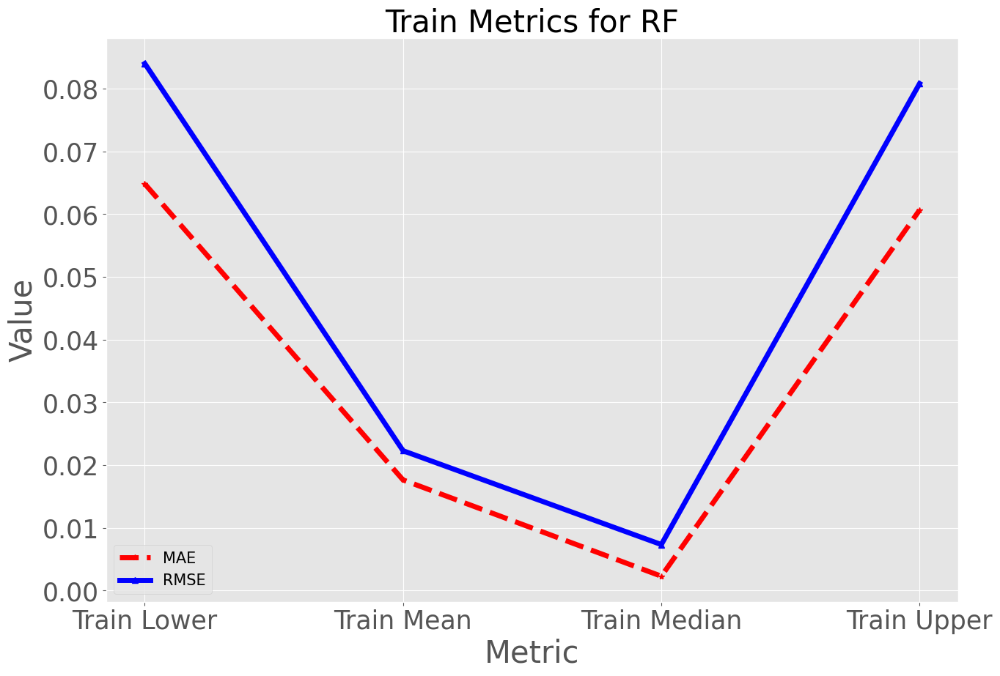

In [141]:
train_metrics_model(mae_qrf_lower_tr, mae_rf_mean_tr, mae_qrf_median_tr, mae_qrf_upper_tr,
                   rmse_qrf_lower_tr, rmse_rf_mean_tr, rmse_qrf_median_tr, rmse_qrf_upper_tr,'RF')

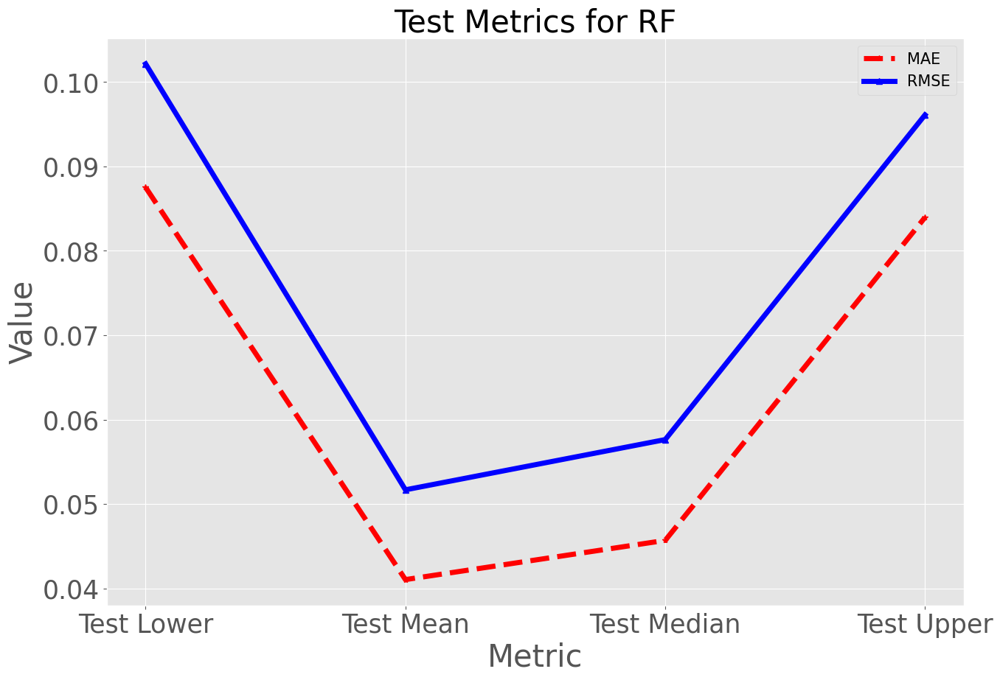

In [142]:
test_metrics_model(mae_qrf_lower_te, mae_rf_mean_te, mae_qrf_median_te, mae_qrf_upper_te,
                   rmse_qrf_lower_te, rmse_rf_mean_te, rmse_qrf_median_te, rmse_qrf_upper_te,'RF')

In [143]:
# Transformations
qrf_lower_ = np.expm1(qrf_lower_te).reshape(-1,1)
qrf_median_ = np.expm1(qrf_median_te).reshape(-1,1)
qrf_upper_ = np.expm1(qrf_upper_te).reshape(-1,1)
rf_mean_ = np.expm1(rf_mean_te).reshape(-1,1)

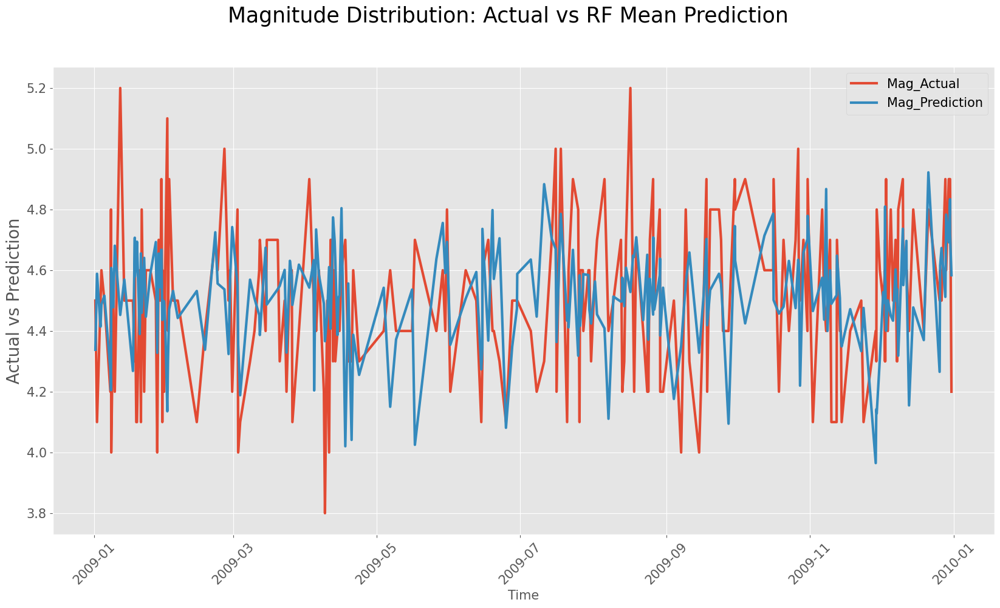

In [144]:
tsmultiplot(y_test, rf_mean_, 'RF')

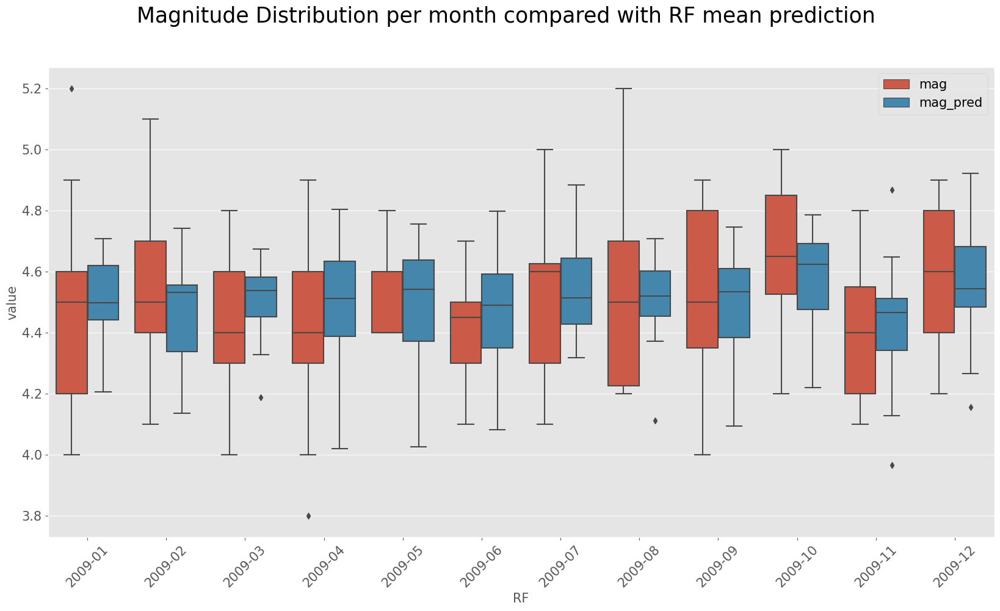

In [145]:
boxplot2(y_test, rf_mean_, 'RF')

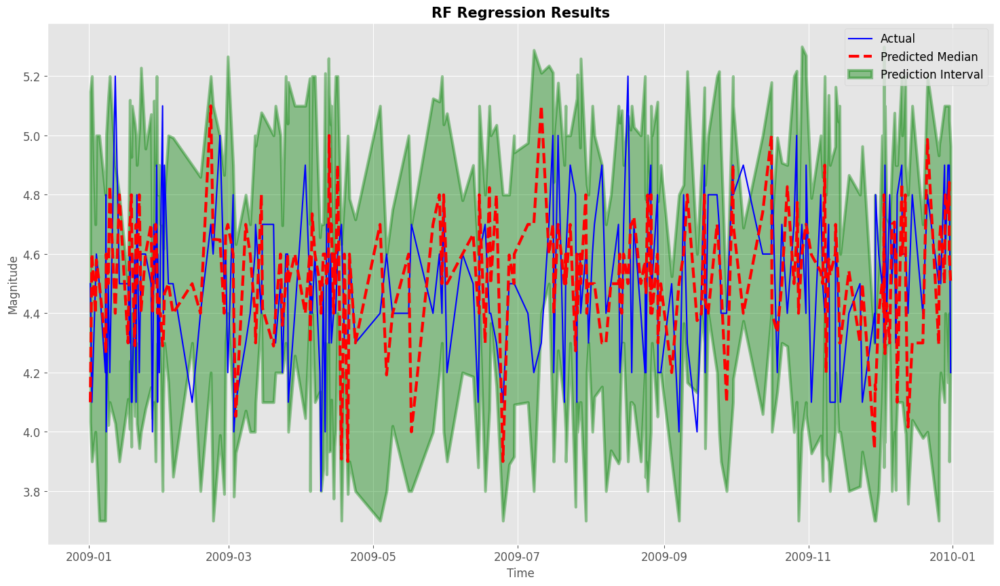

In [146]:
results_tsplot(qrf_lower_, rf_mean_, qrf_median_, qrf_upper_,'RF')

In [147]:
# Lower Percentile
percentile_RF_lower=(qrf_lower_ > y_test.values).mean()
percentile_RF_lower

0.08759280029909737

In [148]:
# Median percentile
percentile_RF_median=(qrf_median_ > y_test.values).mean()
percentile_RF_median

0.5440189428332354

In [149]:
# Upper percentile
percentile_RF_upper=(qrf_upper_ > y_test.values).mean()
percentile_RF_upper

0.9153269597108725

In [150]:
# Coverage
coverage_RF = np.logical_and(
                qrf_lower_ < y_test.values,
                qrf_upper_ > y_test.values).mean()
coverage_RF

0.8252772881838737

In [151]:
# Mean Features Importance
print('RF mean prediction Features Permutation Importance')
RF_perm_mean = PermutationImportance(RF_model, random_state=0).fit(X_test, np.log1p(y_test))
FI_RF_mean = eli5.show_weights(RF_perm_mean, feature_names = X_test.columns.tolist())
FI_RF_mean

RF mean prediction Features Permutation Importance


Weight,Feature
0.2359 ± 0.1267,depth
-0.0047 ± 0.0610,latitude
-0.0087 ± 0.1066,longitude
-0.0741 ± 0.1183,place


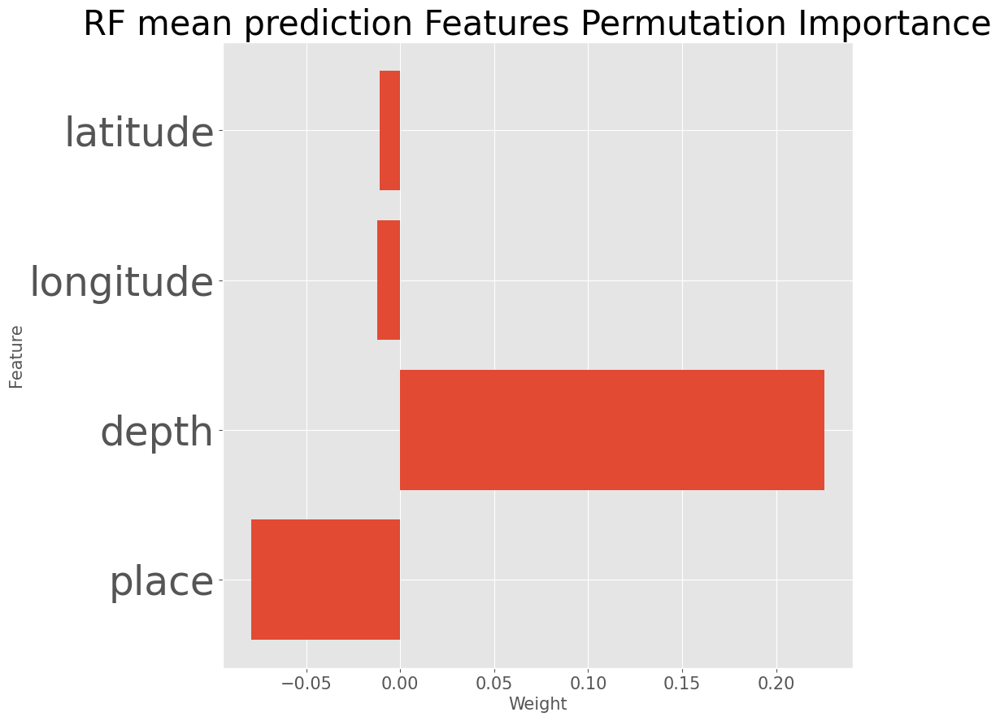

In [152]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [-0.0793, 0.2255, -0.0123,-0.0111]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('RF mean prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

In [153]:
# Lower Features Importance
print('RF lower prediction Features Permutation Importance')
qRF = RandomForestQuantileRegressor(q=[0.05])
qRF_model_05 = GridSearchCV(qRF,param_grid,cv=ts_cv)
qRF_model_05.fit(X_train,np.log1p(y_train))
feature_importances = permutation_feature_importance(qRF_model_05, X_test.values, np.log1p(y_test))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_RF_perm_lower = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_RF_perm_lower.sort_values(by='Weight',ascending=False)

RF lower prediction Features Permutation Importance


,Weight,Feature
3,-0.001100,latitude
2,-0.001260,longitude
0,-0.002269,place
1,-0.002674,depth


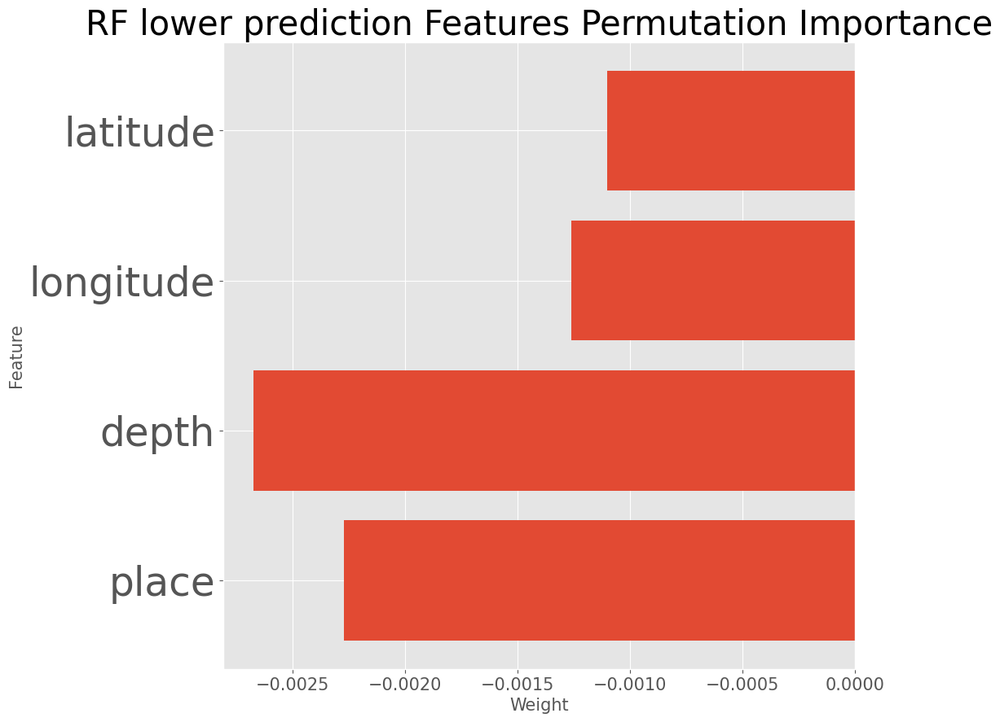

In [154]:
plt.rcParams['figure.figsize']=(10,10)
FI_RF_perm_lower_values = FI_RF_perm_lower.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_RF_perm_lower_values], [row[0] for row in FI_RF_perm_lower_values])
plt.title('RF lower prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [155]:
# Median Features Importance
print('RF lower prediction Features Permutation Importance')
qRF = RandomForestQuantileRegressor(q=[0.50])
qRF_model_50 = GridSearchCV(qRF,param_grid,cv=ts_cv)
qRF_model_50.fit(X_train,np.log1p(y_train))
feature_importances = permutation_feature_importance(qRF_model_50, X_test.values, np.log1p(y_test))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_RF_perm_median = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_RF_perm_median.sort_values(by='Weight',ascending=False)

RF lower prediction Features Permutation Importance


,Weight,Feature
3,0.000469,latitude
0,0.000313,place
1,0.000254,depth
2,-0.000600,longitude


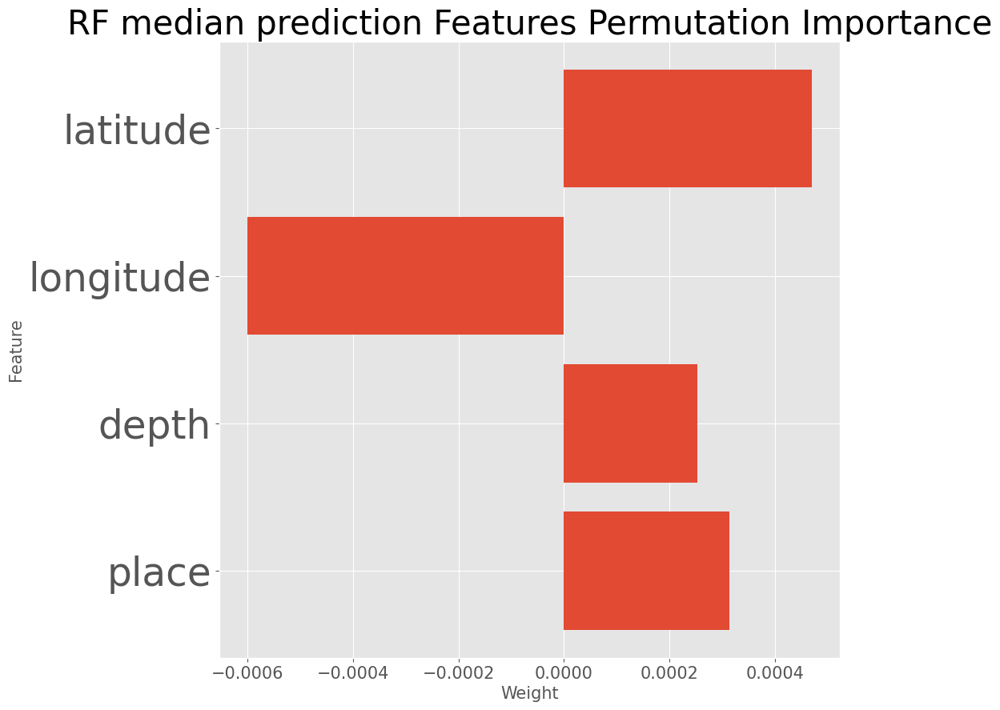

In [156]:
plt.rcParams['figure.figsize']=(10,10)
FI_RF_perm_median_values = FI_RF_perm_median.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_RF_perm_median_values], [row[0] for row in FI_RF_perm_median_values])
plt.title('RF median prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [157]:
# Upper Features Importance
print('RF upper prediction Features Permutation Importance')
qRF = RandomForestQuantileRegressor(q=[0.95])
qRF_model_95 = GridSearchCV(qRF,param_grid,cv=ts_cv)
qRF_model_95.fit(X_train,np.log1p(y_train))
feature_importances = permutation_feature_importance(qRF_model_95, X_test.values, np.log1p(y_test))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_RF_perm_upper = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_RF_perm_upper.sort_values(by='Weight',ascending=False)

RF upper prediction Features Permutation Importance


,Weight,Feature
3,-0.000291,latitude
2,-0.000421,longitude
1,-0.001046,depth
0,-0.001130,place


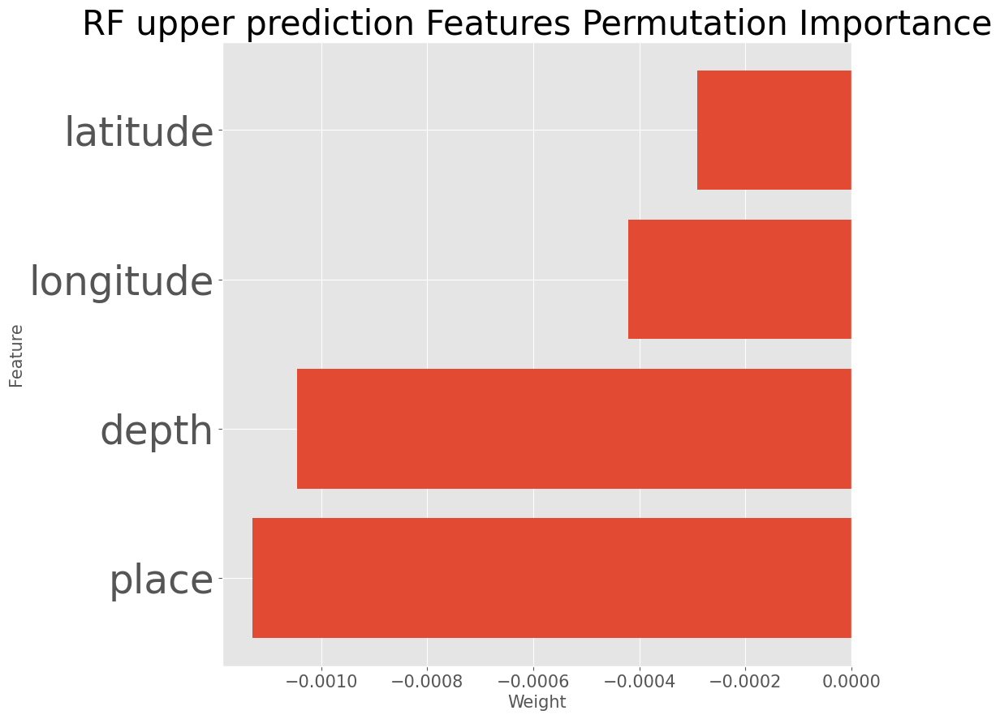

In [158]:
plt.rcParams['figure.figsize']=(10,10)
FI_RF_perm_upper_values = FI_RF_perm_upper.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_RF_perm_upper_values], [row[0] for row in FI_RF_perm_upper_values])
plt.title('RF upper prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

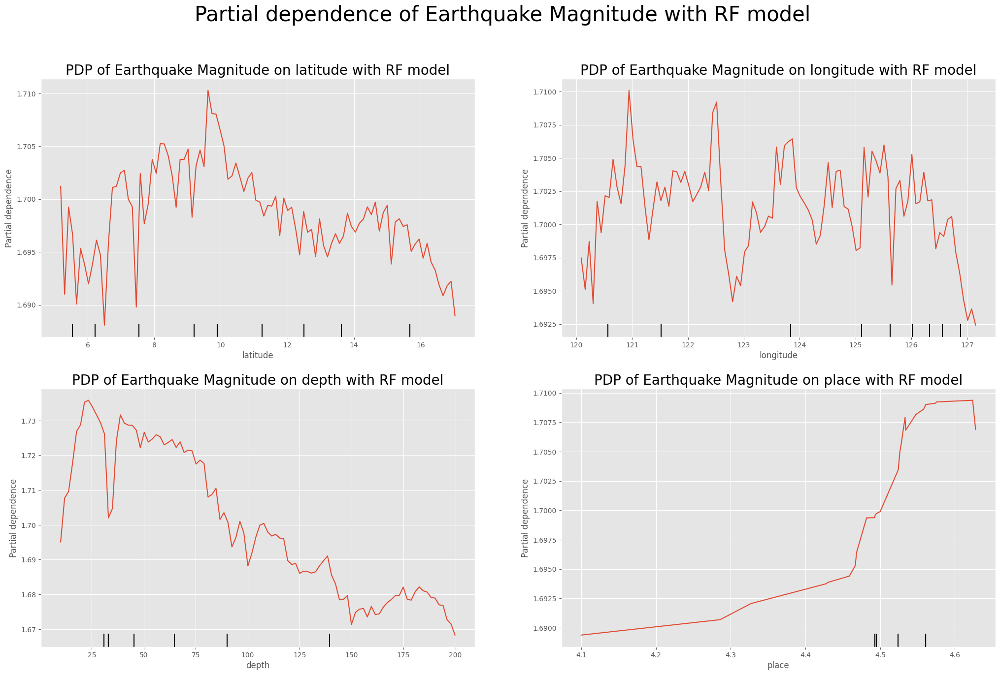

In [159]:
# Mean Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with RF model',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(RF_model, X_t, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with RF model', fontsize=20)

plt.show()

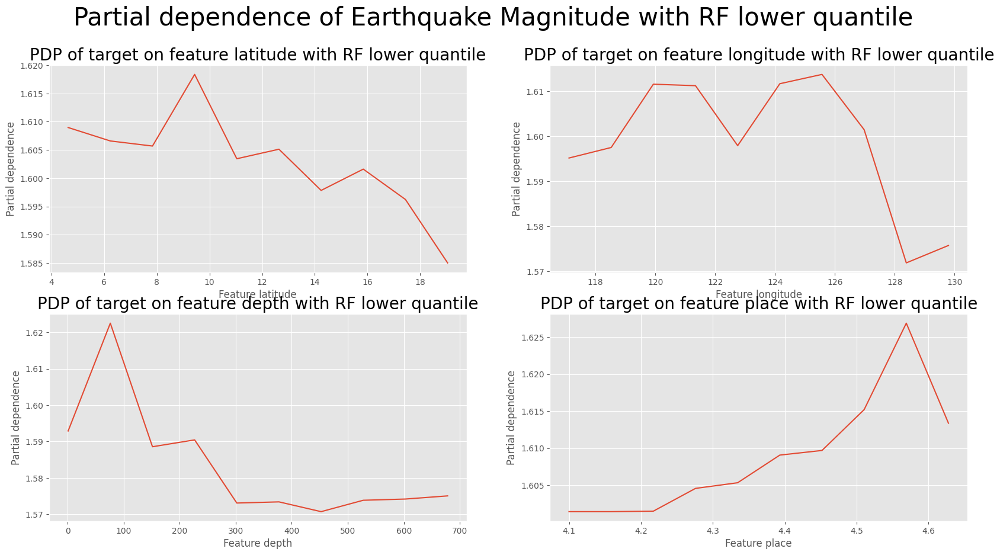

In [160]:
# Lower Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with RF lower quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qRF_model_05, X_t.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with RF lower quantile", fontsize=20)
plt.show()

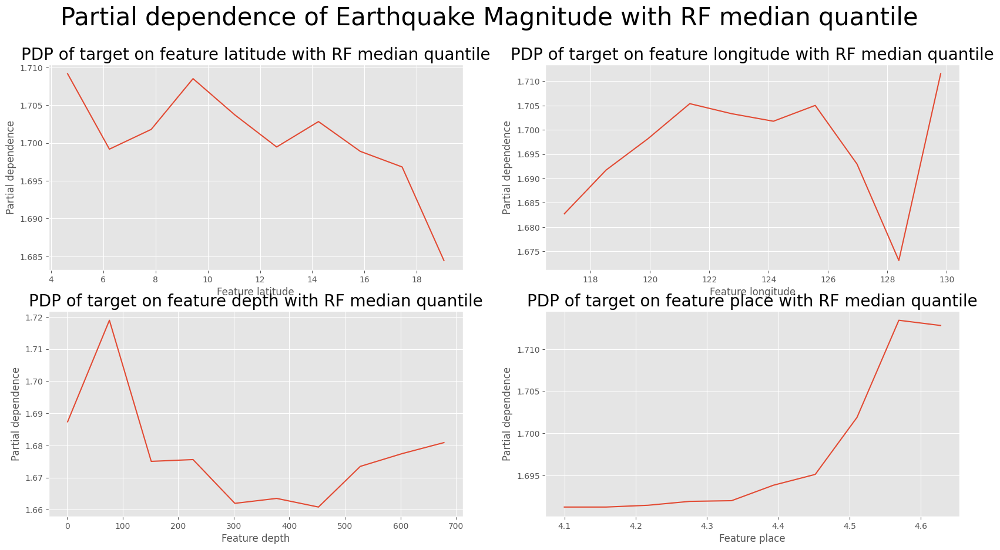

In [161]:
# Median Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with RF median quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qRF_model_50, X_t.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with RF median quantile", fontsize=20)
plt.show()

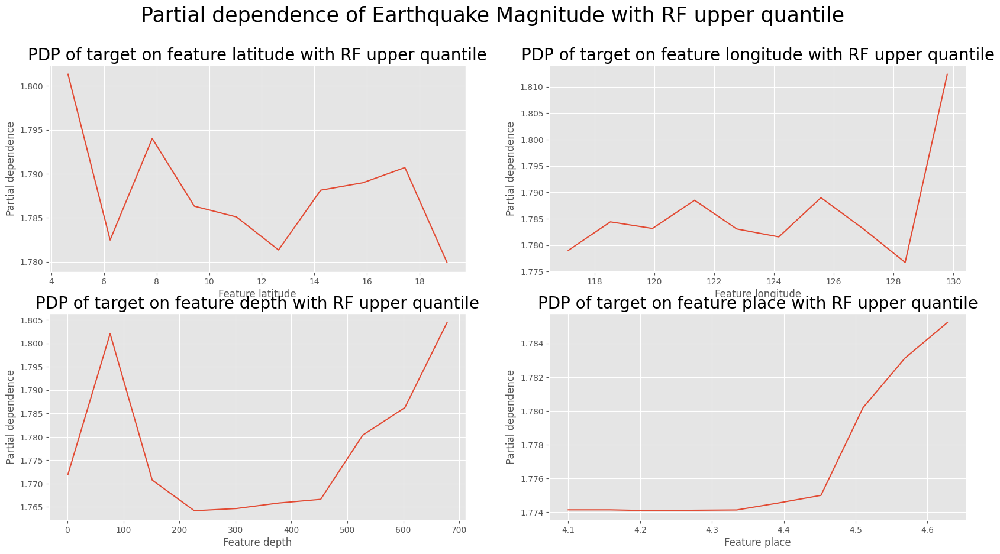

In [162]:
# Upper Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with RF upper quantile',fontsize=25)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qRF_model_95, X_t.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with RF upper quantile", fontsize=20)
plt.show()

### Gradient Boosting Machine

In [163]:
# Evaluation following quantile approach
GBM = GradientBoostingRegressor(random_state=0)
param_grid = {}
GBM_model = GridSearchCV(GBM,param_grid,cv=ts_cv)
GBM_model.fit(X_train, np.log1p(y_train))
gbm_mean_tr = GBM_model.predict(X_train)
gbm_mean_te = GBM_model.predict(X_test)

qGBM = GradientBoostingRegressor(loss="quantile", alpha=0.05, random_state=0)
param_grid = {}
qGBM_model_lower = GridSearchCV(qGBM,param_grid,cv=ts_cv)
qGBM_model_lower.fit(X_train, np.log1p(y_train))
qgbm_lower_tr = qGBM_model_lower.predict(X_train)
qgbm_lower_te = qGBM_model_lower.predict(X_test)

qGBM = GradientBoostingRegressor(loss="quantile",alpha=0.5, random_state=0)
param_grid = {}
qGBM_model_median = GridSearchCV(qGBM,param_grid,cv=ts_cv)
qGBM_model_median.fit(X_train, np.log1p(y_train))
qgbm_median_tr = qGBM_model_median.predict(X_train)
qgbm_median_te = qGBM_model_median.predict(X_test)

qGBM = GradientBoostingRegressor(loss='quantile', alpha=0.95,random_state=0)
param_grid = {}
qGBM_model_upper = GridSearchCV(qGBM,param_grid,cv=ts_cv)
qGBM_model_upper.fit(X_train, np.log1p(y_train))
qgbm_upper_tr = qGBM_model_upper.predict(X_train)
qgbm_upper_te = qGBM_model_upper.predict(X_test)



In [164]:
#Train evaluation
mae_gbm_mean_tr = mean_absolute_error(np.log1p(y_train), gbm_mean_tr)
rmse_gbm_mean_tr = np.sqrt(mean_squared_error(np.log1p(y_train), gbm_mean_tr))
mae_qgbm_lower_tr = mean_absolute_error(np.log1p(y_train), qgbm_lower_tr)
rmse_qgbm_lower_tr = np.sqrt(mean_squared_error(np.log1p(y_train), qgbm_lower_tr))
mae_qgbm_median_tr = mean_absolute_error(np.log1p(y_train), qgbm_median_tr)
rmse_qgbm_median_tr = np.sqrt(mean_squared_error(np.log1p(y_train), qgbm_median_tr))
mae_qgbm_upper_tr = mean_absolute_error(np.log1p(y_train), qgbm_upper_tr)
rmse_qgbm_upper_tr = np.sqrt(mean_squared_error(np.log1p(y_train), qgbm_upper_tr))


In [165]:
#Test evaluation
mae_gbm_mean_te = mean_absolute_error(np.log1p(y_test), gbm_mean_te)
rmse_gbm_mean_te = np.sqrt(mean_squared_error(np.log1p(y_test), gbm_mean_te))
mae_qgbm_lower_te = mean_absolute_error(np.log1p(y_test), qgbm_lower_te)
rmse_qgbm_lower_te = np.sqrt(mean_squared_error(np.log1p(y_test), qgbm_lower_te))
mae_qgbm_median_te = mean_absolute_error(np.log1p(y_test), qgbm_median_te)
rmse_qgbm_median_te = np.sqrt(mean_squared_error(np.log1p(y_test), qgbm_median_te))
mae_qgbm_upper_te = mean_absolute_error(np.log1p(y_test), qgbm_upper_te)
rmse_qgbm_upper_te = np.sqrt(mean_squared_error(np.log1p(y_test), qgbm_upper_te))


In [166]:
# GBM metrics table
df_gbm = {'model': ['GBM','GBM'],
        'evaluation':['MAE','RMSE'],
        'train_mean':[mae_gbm_mean_tr,rmse_gbm_mean_tr],
        'test_mean': [mae_gbm_mean_te,rmse_gbm_mean_te],
        'train_lower': [mae_qgbm_lower_tr,rmse_qgbm_lower_tr],
        'test_lower': [mae_qgbm_lower_te,rmse_qgbm_lower_te],
        'train_median': [mae_qgbm_median_tr,rmse_qgbm_median_tr],
        'test_median': [mae_qgbm_median_te,rmse_qgbm_median_te],
        'train_upper': [mae_qgbm_median_tr,rmse_qgbm_upper_tr],
        'test_upper': [mae_qgbm_median_te,rmse_qgbm_upper_te]
         }
df_gbm = pd.DataFrame(data=df_gbm, columns=['model','evaluation',
                                            'train_lower','test_lower',
                                            'train_mean','test_mean',
                                           'train_median','test_median',
                                           'train_upper','test_upper'])
df_gbm

,model,evaluation,train_lower,test_lower,train_mean,test_mean,train_median,test_median,train_upper,test_upper
0,GBM,MAE,0.103776,0.099867,0.044302,0.037670,0.044769,0.037933,0.044769,0.037933
1,GBM,RMSE,0.116863,0.110007,0.055324,0.046899,0.056511,0.047169,0.109397,0.108134


In [167]:
# create data as a list of dictionaries
df_gbm_MAE_tr = [
  {'MAE': 'train_lower', 'value': mae_qgbm_lower_tr},
  {'MAE': 'train_mean', 'value': mae_gbm_mean_tr},
  {'MAE': 'train_median', 'value': mae_qgbm_median_tr},
  {'MAE': 'train_upper', 'value': mae_qgbm_upper_tr},
]

# create the DataFrame
df_gbm_MAE_tr = pd.DataFrame(df_gbm_MAE_tr)

# print the DataFrame
df_gbm_MAE_tr

,MAE,value
0,train_lower,0.103776
1,train_mean,0.044302
2,train_median,0.044769
3,train_upper,0.093582


In [168]:
# create data as a list of dictionaries
df_gbm_RMSE_tr = [
  {'RMSE': 'train_lower', 'value': rmse_qgbm_lower_tr},
  {'RMSE': 'train_mean', 'value': rmse_gbm_mean_tr},
  {'RMSE': 'train_median', 'value': rmse_qgbm_median_tr},
  {'RMSE': 'train_upper', 'value': rmse_qgbm_upper_tr},
]

# create the DataFrame
df_gbm_RMSE_tr = pd.DataFrame(df_gbm_RMSE_tr)

# print the DataFrame
df_gbm_RMSE_tr

,RMSE,value
0,train_lower,0.116863
1,train_mean,0.055324
2,train_median,0.056511
3,train_upper,0.109397


In [169]:
# create data as a list of dictionaries
df_gbm_MAE_te = [
  {'MAE': 'test_lower', 'value': mae_qgbm_lower_te},
  {'MAE': 'test_mean', 'value': mae_gbm_mean_te},
  {'MAE': 'test_median', 'value': mae_qgbm_median_te},
  {'MAE': 'test_upper', 'value': mae_qgbm_upper_te},
]

# create the DataFrame
df_gbm_MAE_te = pd.DataFrame(df_gbm_MAE_te)

# print the DataFrame
df_gbm_MAE_te

,MAE,value
0,test_lower,0.099867
1,test_mean,0.037670
2,test_median,0.037933
3,test_upper,0.098408


In [170]:
# create data as a list of dictionaries
df_gbm_RMSE_te = [
  {'RMSE': 'test_lower', 'value': rmse_qgbm_lower_te},
  {'RMSE': 'test_mean', 'value': rmse_gbm_mean_te},
  {'RMSE': 'test_median', 'value': rmse_qgbm_median_te},
  {'RMSE': 'test_upper', 'value': rmse_qgbm_upper_te},
]

# create the DataFrame
df_gbm_RMSE_te = pd.DataFrame(df_gbm_RMSE_te)

# print the DataFrame
df_gbm_RMSE_te

,RMSE,value
0,test_lower,0.110007
1,test_mean,0.046899
2,test_median,0.047169
3,test_upper,0.108134


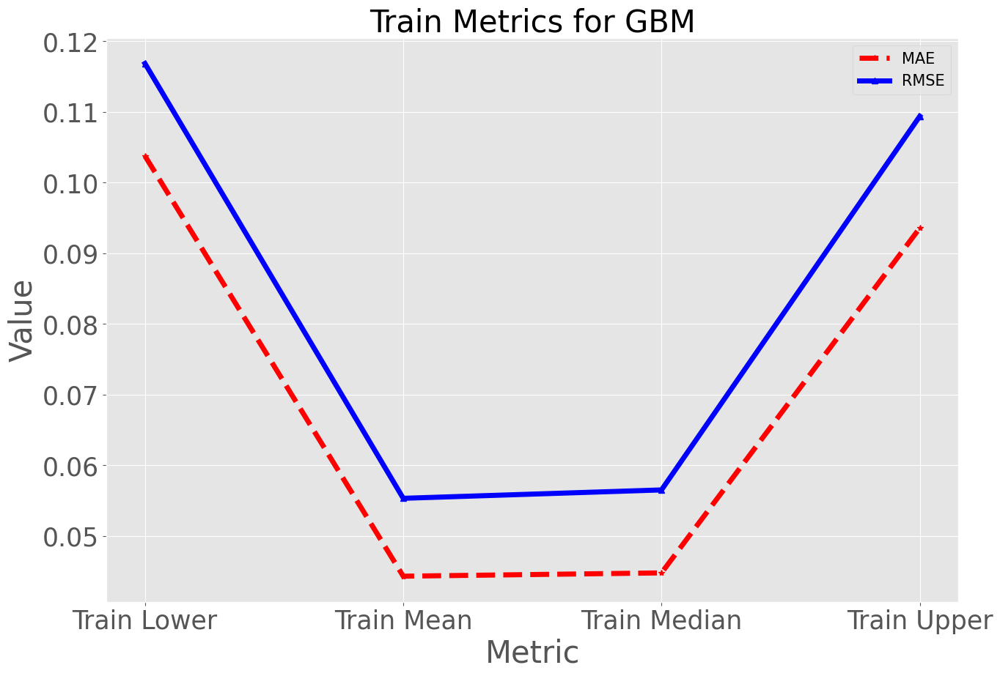

In [171]:
train_metrics_model(mae_qgbm_lower_tr, mae_gbm_mean_tr, mae_qgbm_median_tr, mae_qgbm_upper_tr,
                   rmse_qgbm_lower_tr, rmse_gbm_mean_tr, rmse_qgbm_median_tr, rmse_qgbm_upper_tr,'GBM')

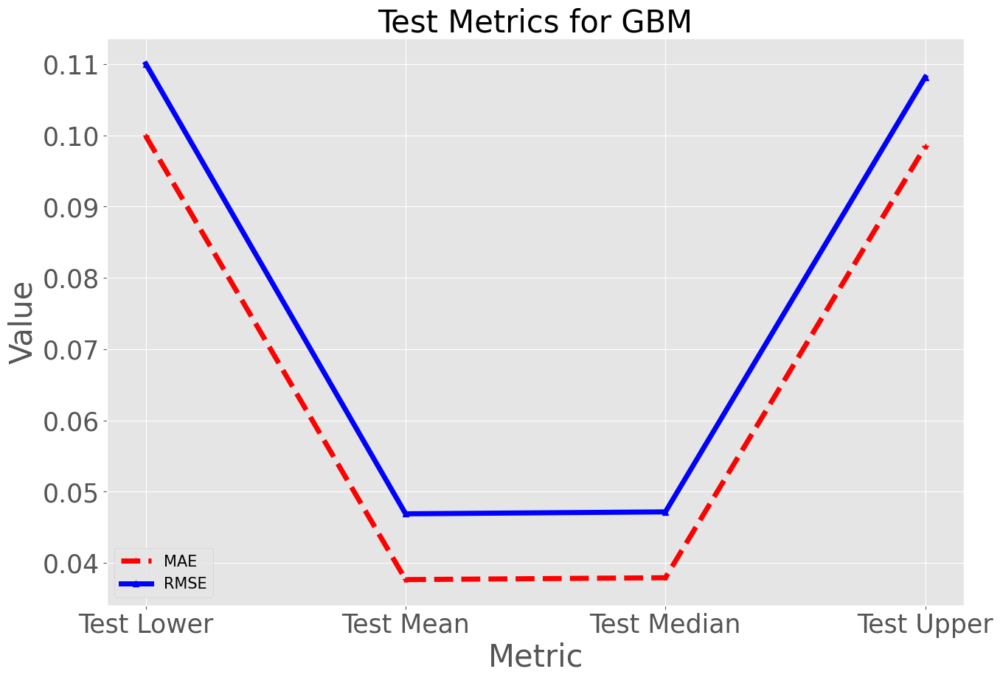

In [172]:
test_metrics_model(mae_qgbm_lower_te, mae_gbm_mean_te, mae_qgbm_median_te, mae_qgbm_upper_te,
                   rmse_qgbm_lower_te, rmse_gbm_mean_te, rmse_qgbm_median_te, rmse_qgbm_upper_te,'GBM')

In [173]:
# Transformations
qgbm_lower_ = np.expm1(qgbm_lower_te).reshape(-1,1)
qgbm_median_ = np.expm1(qgbm_median_te).reshape(-1,1)
qgbm_upper_ = np.expm1(qgbm_upper_te).reshape(-1,1)
gbm_mean_ = np.expm1(gbm_mean_te).reshape(-1,1)

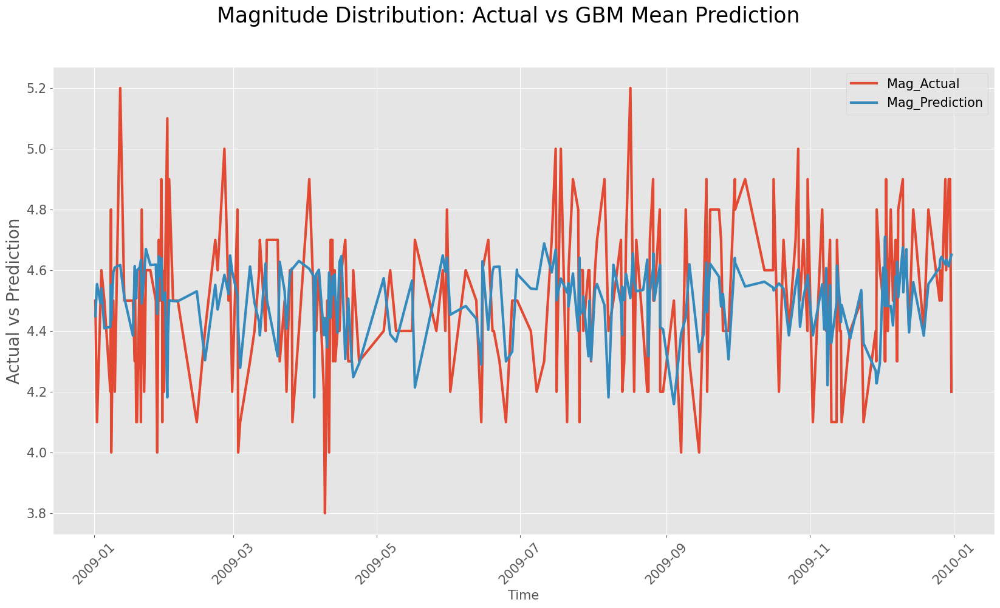

In [174]:
tsmultiplot(y_test, gbm_mean_, 'GBM')

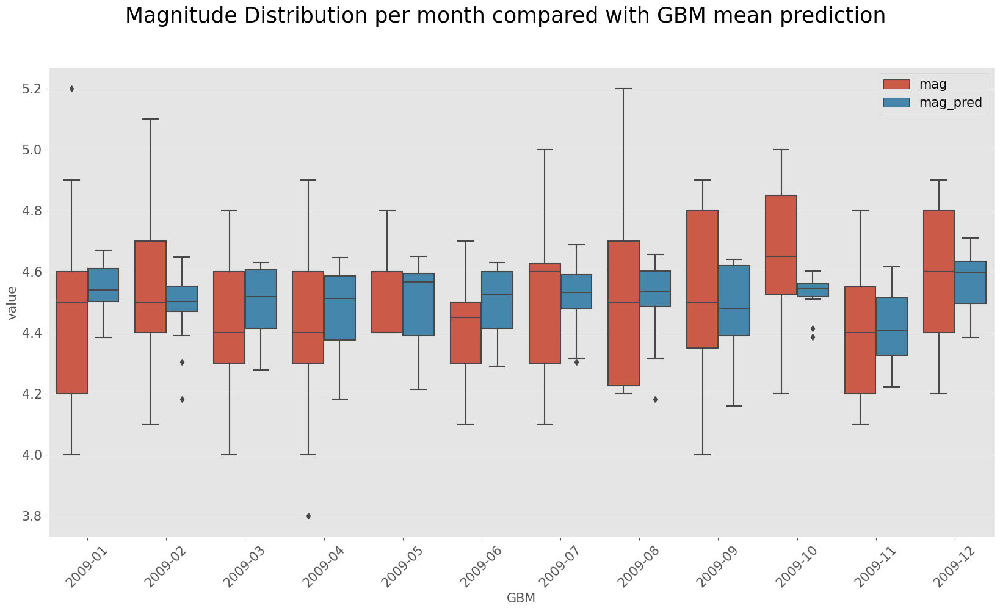

In [175]:
boxplot2(y_test, gbm_mean_, 'GBM')

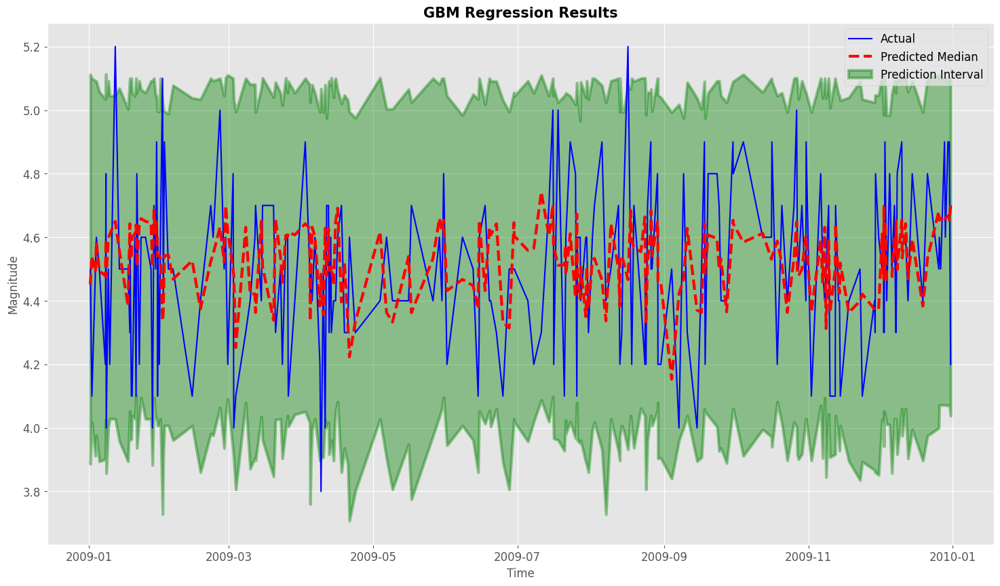

In [176]:
results_tsplot(qgbm_lower_, gbm_mean_, qgbm_median_, qgbm_upper_,'GBM')

In [177]:
# Lower Percentile
percentile_GBM_lower=(qgbm_lower_ > y_test.values).mean()
percentile_GBM_lower

0.016931047374886505

In [178]:
# Median Percentile
percentile_GBM_median=(qgbm_median_ > y_test.values).mean()
percentile_GBM_median

0.5417223023375883

In [179]:
# Upper Percentile
percentile_GBM_upper=(qgbm_upper_ > y_test.values).mean()
percentile_GBM_upper

0.9860243194644733

In [180]:
# Coverage
coverage_GBM = np.logical_and(
               qgbm_lower_ < y_test.values,
               qgbm_upper_ > y_test.values).mean()
coverage_GBM

0.9690932720895867

In [181]:
# Mean Features Importance
print('GBM mean prediction Features Permutation Importance')
GBM_perm_mean = PermutationImportance(GBM_model, random_state=0).fit(X_test, np.log1p(y_test))
FI_GBM_mean = eli5.show_weights(GBM_perm_mean, feature_names = X_test.columns.tolist())
FI_GBM_mean

GBM mean prediction Features Permutation Importance


Weight,Feature
0.2062 ± 0.1339,depth
0.0097 ± 0.0238,longitude
0.0094 ± 0.0130,place
-0.0059 ± 0.0323,latitude


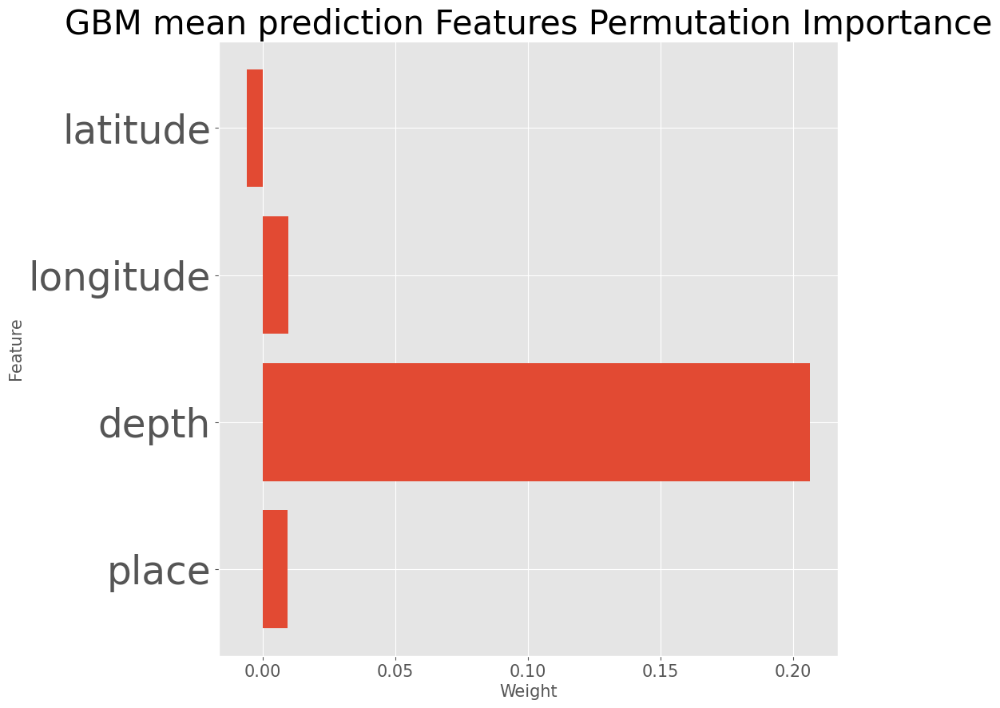

In [182]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0094, 0.2062, 0.0097, -0.0059]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('GBM mean prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

In [183]:
# Lower Features Importance
print('GBM lower prediction Features Permutation Importance')
GBM_perm_lower = PermutationImportance(qGBM_model_lower, random_state=0).fit(X_test, np.log1p(y_test))
FI_GBM_lower = eli5.show_weights(GBM_perm_lower, feature_names = X_test.columns.tolist())
FI_GBM_lower

GBM lower prediction Features Permutation Importance


Weight,Feature
0.1901 ± 0.0912,depth
0.0130 ± 0.0106,place
0.0043 ± 0.0323,longitude
-0.0286 ± 0.0212,latitude


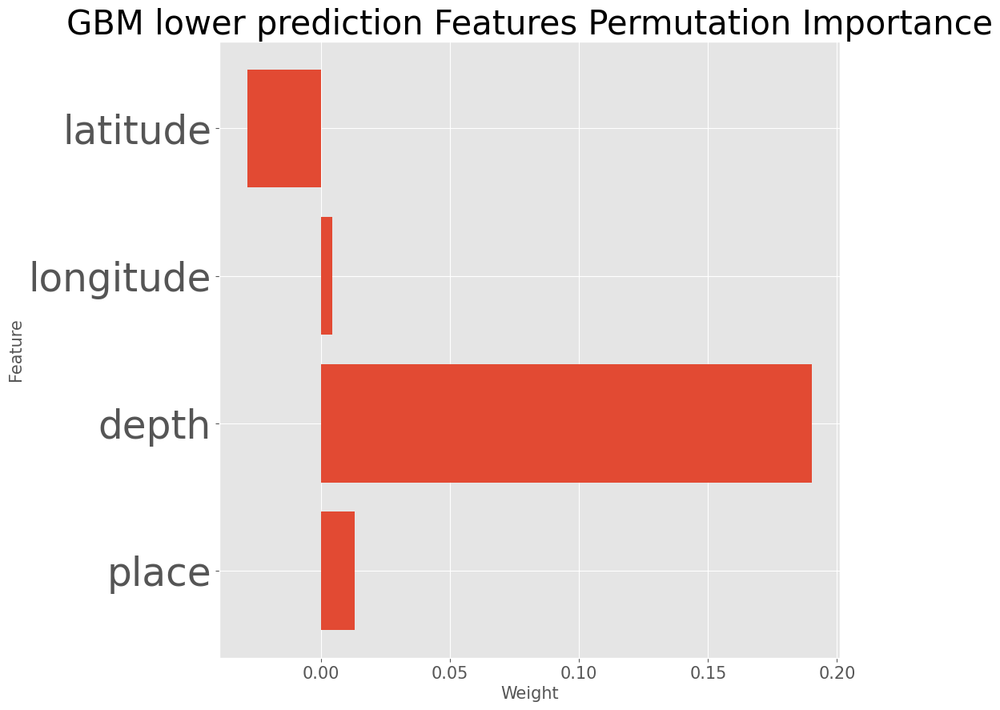

In [184]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0130, 0.1901 , 0.0043, -0.0286]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('GBM lower prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

In [185]:
# Median Features Importance
print('GBM median prediction Features Permutation Importance')
GBM_perm_median = PermutationImportance(qGBM_model_median, random_state=0).fit(X_test, np.log1p(y_test))
FI_GBM_median = eli5.show_weights(GBM_perm_median, feature_names = X_test.columns.tolist())
FI_GBM_median

GBM median prediction Features Permutation Importance


Weight,Feature
0.1722 ± 0.1143,depth
0.0159 ± 0.0128,place
-0.0049 ± 0.0276,latitude
-0.0054 ± 0.0243,longitude


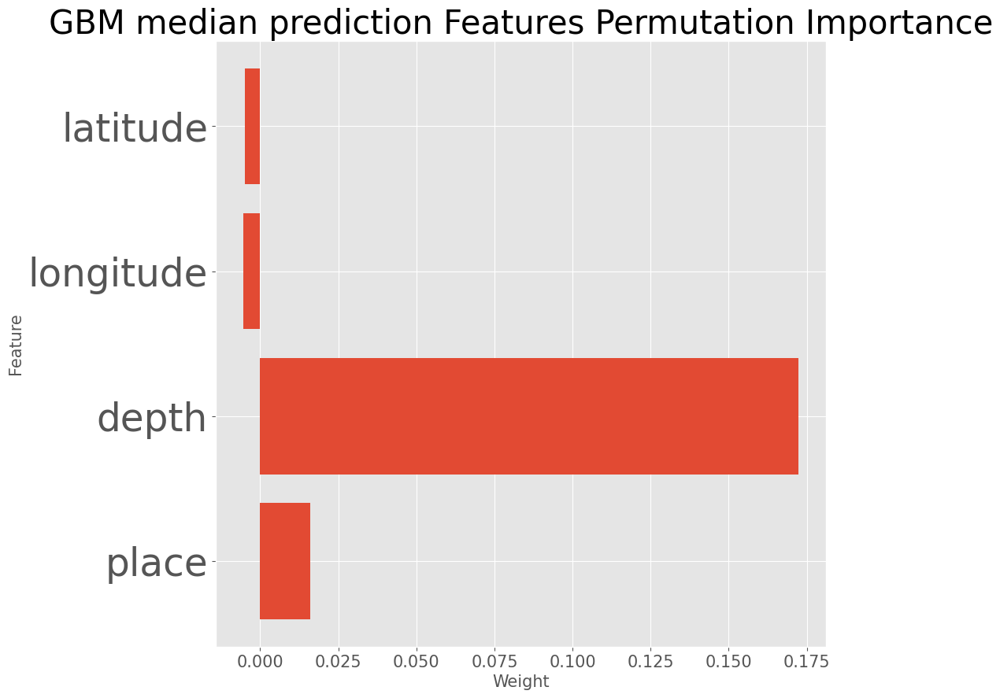

In [186]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0159, 0.1722, -0.0054, -0.0049]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('GBM median prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

In [187]:
# Upper Features Importance
print('GBM upper prediction Features Permutation Importance')
GBM_perm_upper = PermutationImportance(qGBM_model_upper, random_state=0).fit(X_test, np.log1p(y_test))
FI_GBM_upper = eli5.show_weights(GBM_perm_upper, feature_names = X_test.columns.tolist())
FI_GBM_upper

GBM upper prediction Features Permutation Importance


Weight,Feature
0.0254 ± 0.0207,depth
0.0226 ± 0.0105,place
0.0121 ± 0.0043,longitude
-0.0151 ± 0.0056,latitude


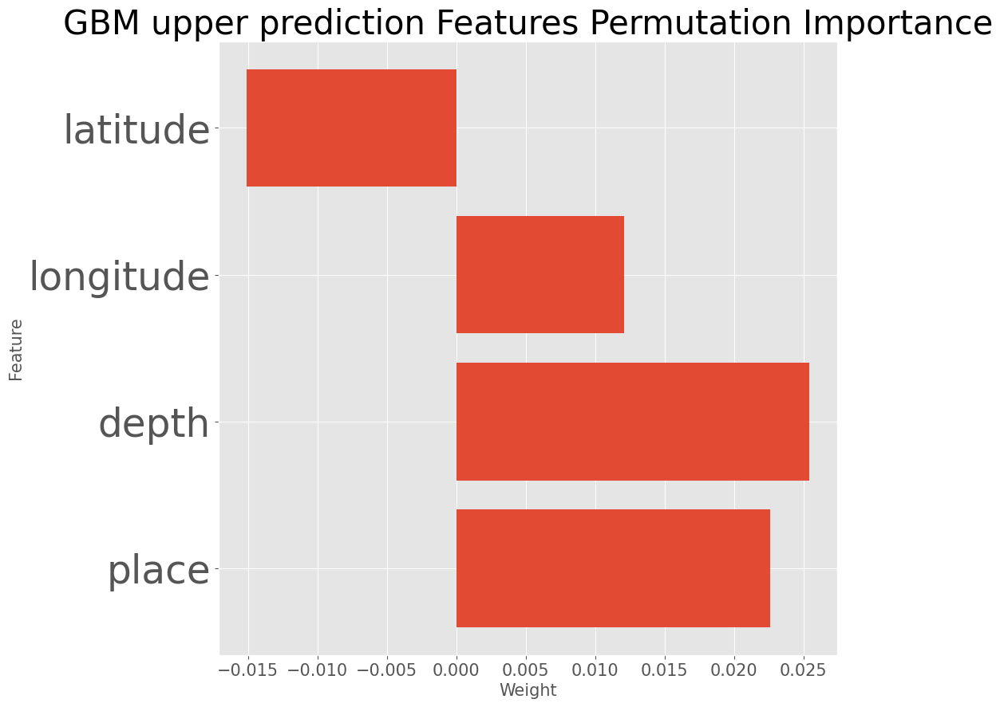

In [188]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0226, 0.0254, 0.0121, -0.0151]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('GBM upper prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

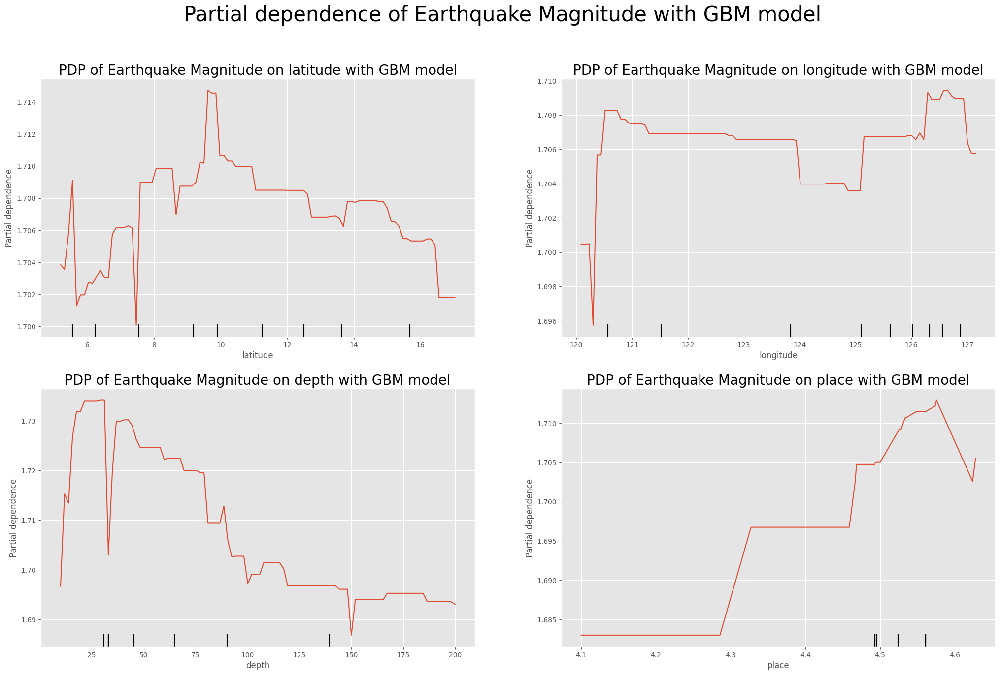

In [189]:
# Mean Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with GBM model',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(GBM_model, X_t, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with GBM model', fontsize=20)

plt.show()

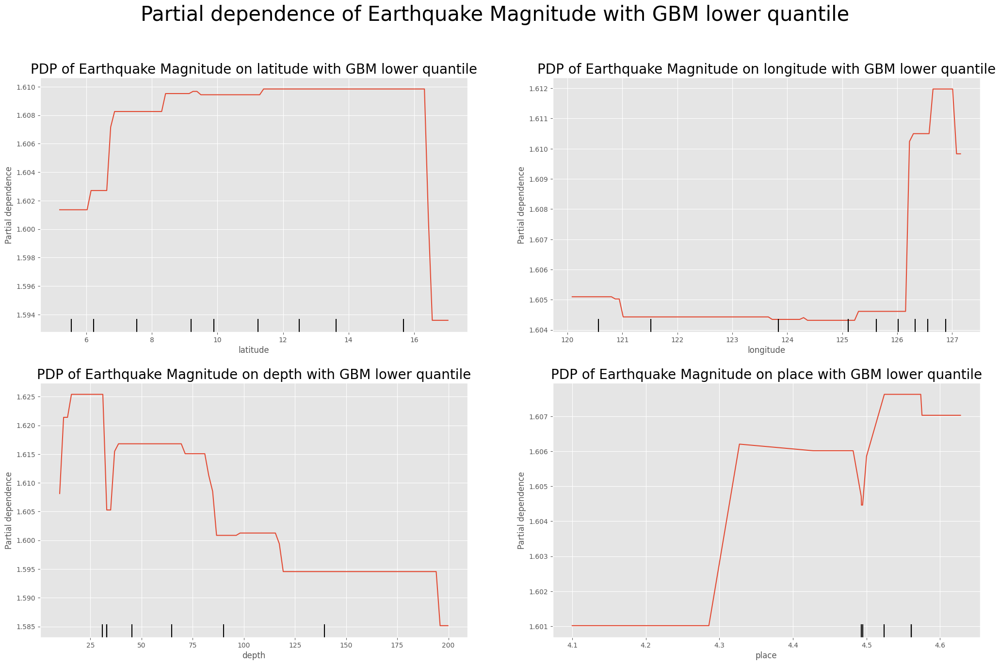

In [190]:
# Lower Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with GBM lower quantile',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(qGBM_model_lower, X_t, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with GBM lower quantile', fontsize=20)

plt.show()

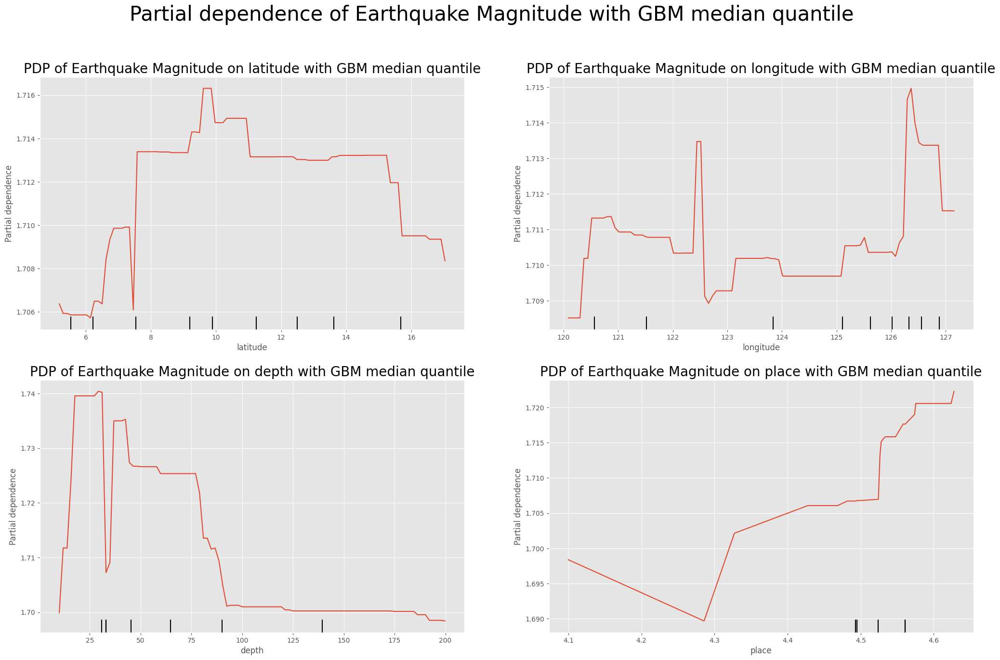

In [191]:
# Median Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with GBM median quantile',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(qGBM_model_median, X_t, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with GBM median quantile', fontsize=20)

plt.show()

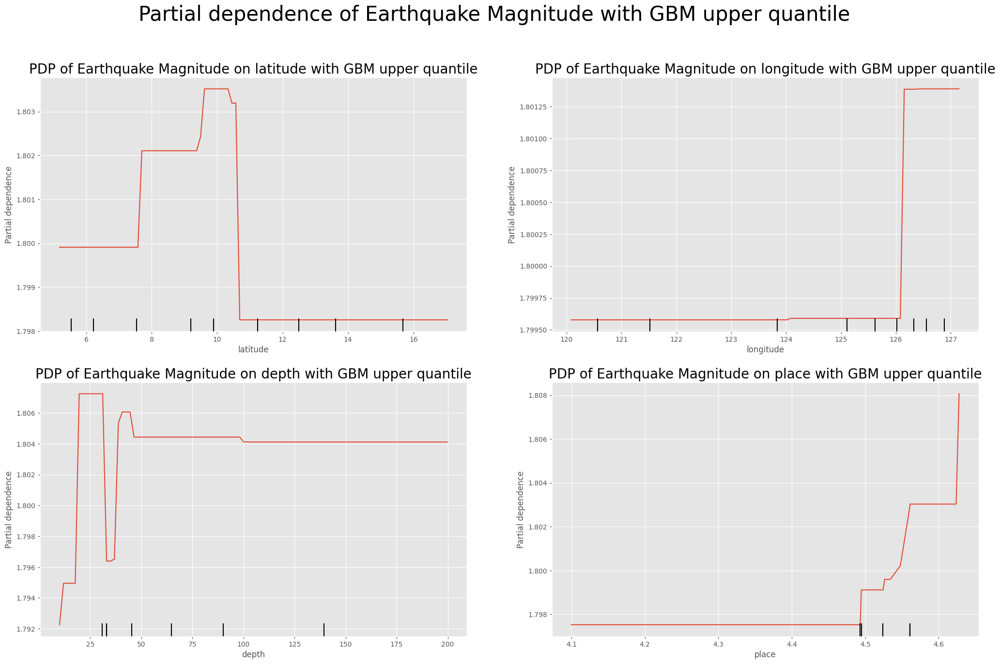

In [192]:
# Upper Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with GBM upper quantile',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(qGBM_model_upper, X_t, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with GBM upper quantile', fontsize=20)

plt.show()

### Neural Networks

In [193]:
X_tr_sc = pd.DataFrame(X_train_sc)
y_tr_sc = pd.DataFrame(y_train_sc)

In [194]:
# Evaluation following quantile approach
NN = MLPRegressor(hidden_layer_sizes=(100), activation='relu', solver='adam',
                  max_iter=50,random_state=0)
param_grid = {}
NN_model = GridSearchCV(NN,param_grid,cv=ts_cv)
NN_model.fit(X_train_sc, np.log1p(y_train_sc))
nn_mean_tr = NN_model.predict(X_train_sc)
nn_mean_te = NN_model.predict(X_test_sc)


In [195]:
qNN_model_lower = tf.keras.models.Sequential()
qNN_model_lower.add(tf.keras.layers.Dense(100, activation='relu', input_dim=4))
qNN_model_lower.add(tf.keras.layers.Dense(1, activation='linear'))
quantile = 0.05
qNN_model_lower.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Fit the model on the training data
    qNN_model_lower.fit(X_tr, np.log1p(y_tr), epochs=50, verbose=0)

qnn_lower_tr = qNN_model_lower.predict(X_train_sc)
qnn_lower_te = qNN_model_lower.predict(X_test_sc)

8/8 [==============================] - 0s 2ms/step


In [196]:
qNN_model_median = tf.keras.models.Sequential()
qNN_model_median.add(tf.keras.layers.Dense(100, activation='relu', input_dim=4))
qNN_model_median.add(tf.keras.layers.Dense(1, activation='linear'))
quantile = 0.5
qNN_model_median.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Fit the model on the training data
    qNN_model_median.fit(X_tr, np.log1p(y_tr), epochs=50, verbose=0)

qnn_median_tr = qNN_model_median.predict(X_train_sc)
qnn_median_te = qNN_model_median.predict(X_test_sc)

8/8 [==============================] - 0s 3ms/step


In [197]:
qNN_model_upper = tf.keras.models.Sequential()
qNN_model_upper.add(tf.keras.layers.Dense(100, activation='relu', input_dim=4))
qNN_model_upper.add(tf.keras.layers.Dense(1, activation='linear'))
quantile = 0.95
qNN_model_upper.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Fit the model on the training data
    qNN_model_upper.fit(X_tr, np.log1p(y_tr), epochs=50, verbose=0)

qnn_upper_tr = qNN_model_upper.predict(X_train_sc)
qnn_upper_te = qNN_model_upper.predict(X_test_sc)

8/8 [==============================] - 0s 2ms/step


In [198]:
#Train evaluation
mae_nn_mean_tr = mean_absolute_error(np.log1p(y_train_sc), nn_mean_tr)
rmse_nn_mean_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), nn_mean_tr))
mae_qnn_lower_tr = mean_absolute_error(np.log1p(y_train_sc), qnn_lower_tr)
rmse_qnn_lower_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qnn_lower_tr))
mae_qnn_median_tr = mean_absolute_error(np.log1p(y_train_sc), qnn_median_tr)
rmse_qnn_median_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qnn_median_tr))
mae_qnn_upper_tr = mean_absolute_error(np.log1p(y_train_sc), qnn_upper_tr)
rmse_qnn_upper_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qnn_upper_tr))

In [199]:
#Test evaluation
mae_nn_mean_te = mean_absolute_error(np.log1p(y_test_sc), nn_mean_te)
rmse_nn_mean_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), nn_mean_te))
mae_qnn_lower_te = mean_absolute_error(np.log1p(y_test_sc), qnn_lower_te)
rmse_qnn_lower_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qnn_lower_te))
mae_qnn_median_te = mean_absolute_error(np.log1p(y_test_sc), qnn_median_te)
rmse_qnn_median_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qnn_median_te))
mae_qnn_upper_te = mean_absolute_error(np.log1p(y_test_sc), qnn_upper_te)
rmse_qnn_upper_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qnn_upper_te))

In [200]:
# nn metrics table
df_nn = {'model': ['NN','NN'],
        'evaluation':['MAE','RMSE'],
        'train_mean':[mae_nn_mean_tr,rmse_nn_mean_tr],
        'test_mean': [mae_nn_mean_te,rmse_nn_mean_te],
        'train_lower': [mae_qnn_lower_tr,rmse_qnn_lower_tr],
        'test_lower': [mae_qnn_lower_te,rmse_qnn_lower_te],
        'train_median': [mae_qnn_median_tr,rmse_qnn_median_tr],
        'test_median': [mae_qnn_median_te,rmse_qnn_median_te],
        'train_upper': [mae_qnn_median_tr,rmse_qnn_upper_tr],
        'test_upper': [mae_qnn_median_te,rmse_qnn_upper_te]
         }
df_nn = pd.DataFrame(data=df_nn, columns=['model','evaluation',
                                            'train_lower','test_lower',
                                           'train_mean','test_mean',
                                           'train_median','test_median',
                                           'train_upper','test_upper'])
df_nn

,model,evaluation,train_lower,test_lower,train_mean,test_mean,train_median,test_median,train_upper,test_upper
0,NN,MAE,0.256952,0.286079,0.109516,0.113468,0.110420,0.129229,0.110420,0.129229
1,NN,RMSE,0.286017,0.316998,0.138037,0.137873,0.142797,0.164479,0.244118,0.206905


In [201]:
# create data as a list of dictionaries
df_nn_MAE_tr = [
  {'MAE': 'train_lower', 'value': mae_qnn_lower_tr},
  {'MAE': 'train_mean', 'value': mae_nn_mean_tr},
  {'MAE': 'train_median', 'value': mae_qnn_median_tr},
  {'MAE': 'train_upper', 'value': mae_qnn_upper_tr},
]

# create the DataFrame
df_nn_MAE_tr = pd.DataFrame(df_nn_MAE_tr)

# print the DataFrame
df_nn_MAE_tr

,MAE,value
0,train_lower,0.256952
1,train_mean,0.109516
2,train_median,0.110420
3,train_upper,0.204737


In [202]:
# create data as a list of dictionaries
df_nn_RMSE_tr = [
  {'RMSE': 'train_lower', 'value': rmse_qnn_lower_tr},
  {'RMSE': 'train_mean', 'value': rmse_nn_mean_tr},
  {'RMSE': 'train_median', 'value': rmse_qnn_median_tr},
  {'RMSE': 'train_upper', 'value': rmse_qnn_upper_tr},
]

# create the DataFrame
df_nn_RMSE_tr = pd.DataFrame(df_nn_RMSE_tr)

# print the DataFrame
df_nn_RMSE_tr

,RMSE,value
0,train_lower,0.286017
1,train_mean,0.138037
2,train_median,0.142797
3,train_upper,0.244118


In [203]:
df_nn_MAE_te = [
  {'MAE': 'test_lower', 'value': mae_qnn_lower_te},
  {'MAE': 'test_mean', 'value': mae_nn_mean_te},
  {'MAE': 'test_median', 'value': mae_qnn_median_te},
  {'MAE': 'test_upper', 'value': mae_qnn_upper_te},
]

# create the DataFrame
df_nn_MAE_te = pd.DataFrame(df_nn_MAE_te)

# print the DataFrame
df_nn_MAE_te

,MAE,value
0,test_lower,0.286079
1,test_mean,0.113468
2,test_median,0.129229
3,test_upper,0.169866


In [204]:
# create data as a list of dictionaries
df_nn_RMSE_te = [
  {'RMSE': 'test_lower', 'value': rmse_qnn_lower_te},
  {'RMSE': 'test_mean', 'value': rmse_nn_mean_te},
  {'RMSE': 'test_median', 'value': rmse_qnn_median_te},
  {'RMSE': 'test_upper', 'value': rmse_qnn_upper_te},
]

# create the DataFrame
df_nn_RMSE_te = pd.DataFrame(df_nn_RMSE_te)

# print the DataFrame
df_nn_RMSE_te

,RMSE,value
0,test_lower,0.316998
1,test_mean,0.137873
2,test_median,0.164479
3,test_upper,0.206905


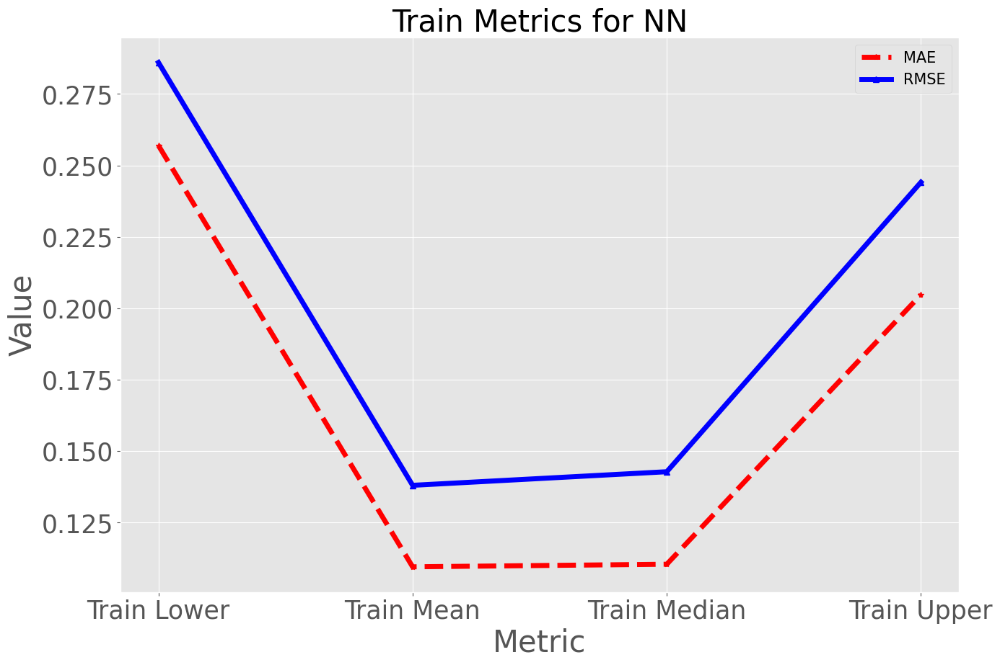

In [205]:
train_metrics_model(mae_qnn_lower_tr, mae_nn_mean_tr, mae_qnn_median_tr, mae_qnn_upper_tr,
                   rmse_qnn_lower_tr, rmse_nn_mean_tr, rmse_qnn_median_tr, rmse_qnn_upper_tr,'NN')

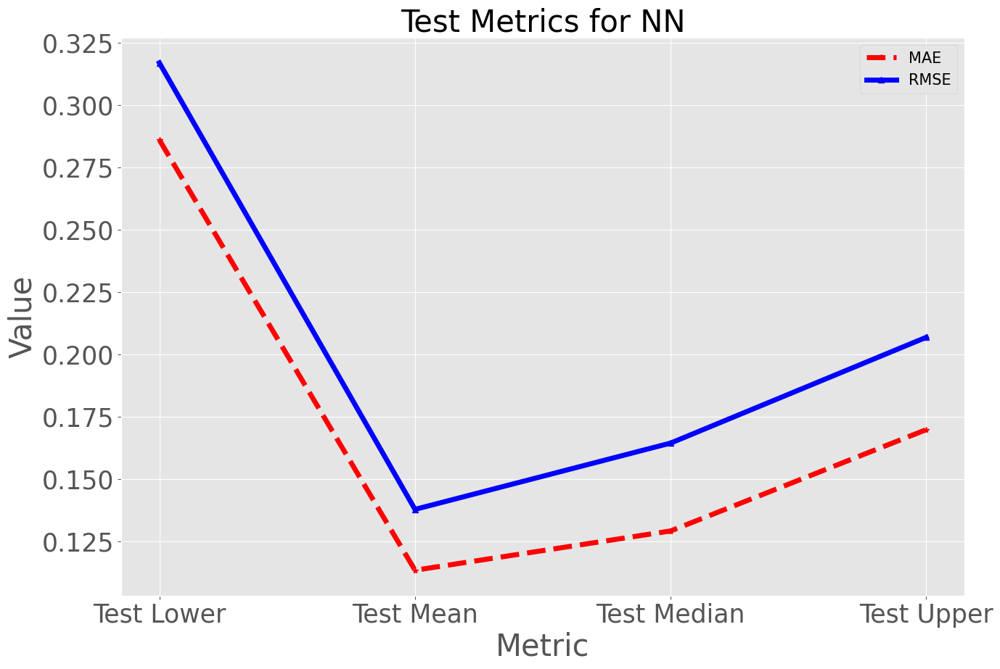

In [206]:
test_metrics_model(mae_qnn_lower_te, mae_nn_mean_te, mae_qnn_median_te, mae_qnn_upper_te,
                   rmse_qnn_lower_te, rmse_nn_mean_te, rmse_qnn_median_te, rmse_qnn_upper_te,'NN')

In [207]:
# Transformations
qnn_lower_ = scaling.inverse_transform(np.expm1(qnn_lower_te).reshape(-1,1))
qnn_median_ = scaling.inverse_transform(np.expm1(qnn_median_te).reshape(-1,1))
qnn_upper_ = scaling.inverse_transform(np.expm1(qnn_upper_te).reshape(-1,1))
nn_mean_ = scaling.inverse_transform(np.expm1(nn_mean_te).reshape(-1,1))


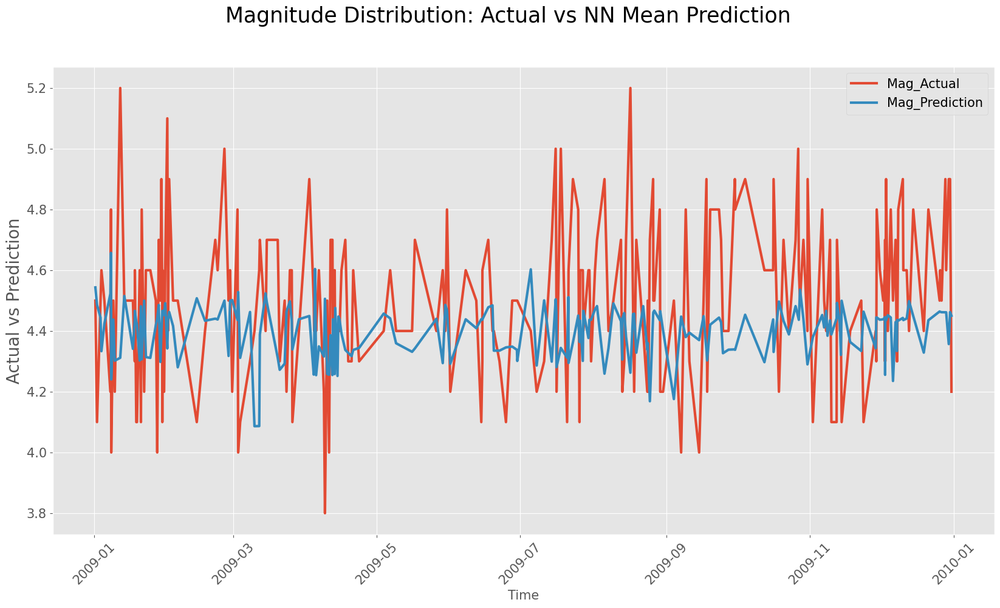

In [208]:
tsmultiplot(y_test, nn_mean_, 'NN')

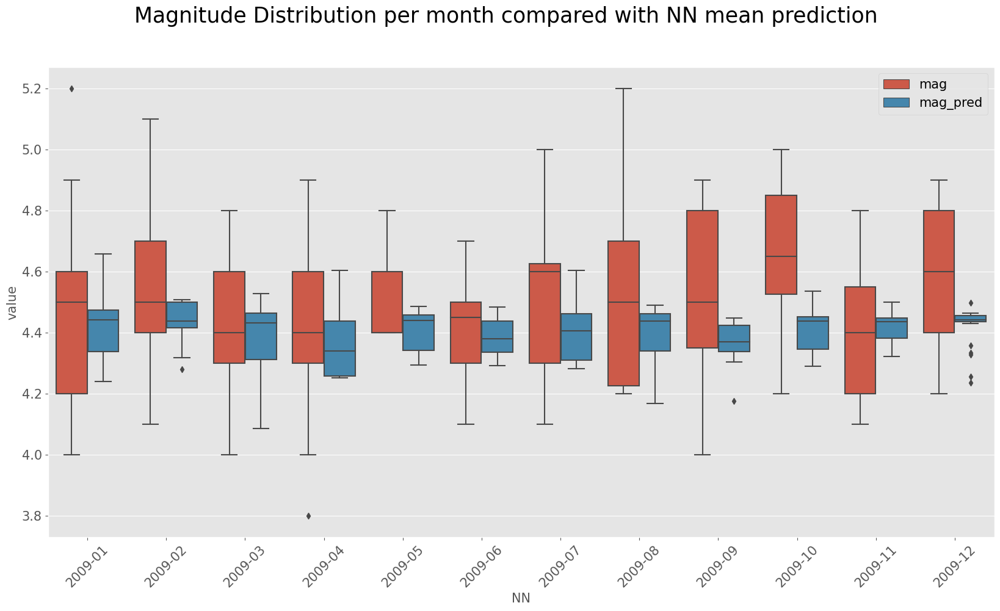

In [209]:
boxplot2(y_test, nn_mean_, 'NN')

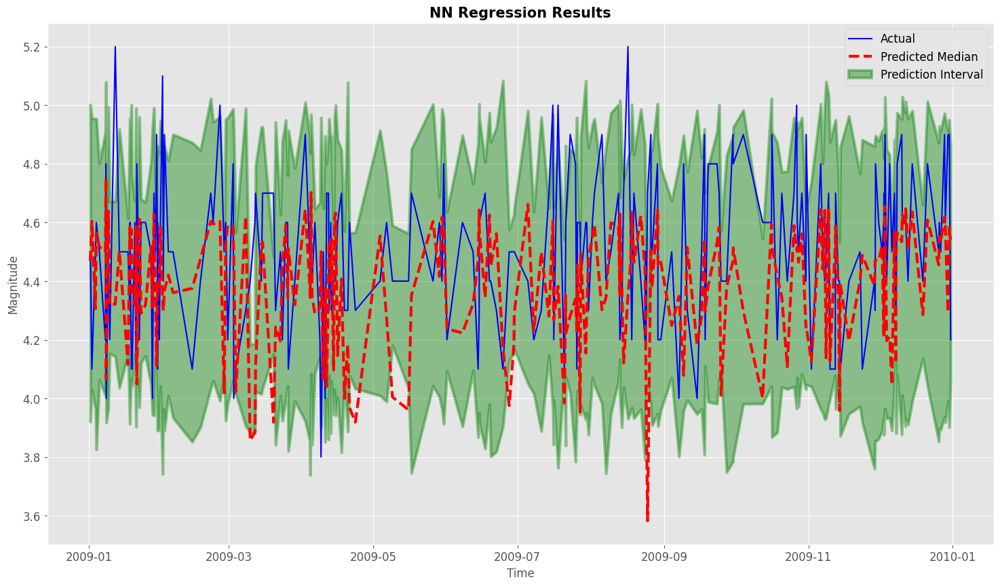

In [210]:
results_tsplot(qnn_lower_, nn_mean_, qnn_median_, qnn_upper_,'NN')

In [211]:
# Lower Percentile
percentile_NN_lower = (qnn_lower_ > y_test.values).mean()
percentile_NN_lower

0.02011785860528049

In [212]:
# Median Percentile
percentile_NN_median=(qnn_median_ > y_test.values).mean()
percentile_NN_median

0.3762929729922199

In [213]:
# Upper Percentile
percentile_NN_upper=(qnn_upper_ > y_test.values).mean()
percentile_NN_upper

0.8691449019922021

In [214]:
# Coverage
coverage_NN = np.logical_and(
                qnn_lower_ < y_test.values,
                qnn_upper_ > y_test.values).mean()
coverage_NN

0.8490270433869216

In [215]:
# Mean Features Importance
print('NN mean prediction Features Permutation Importance')
NN_perm_mean = PermutationImportance(NN_model, random_state=0).fit(X_test_sc, np.log1p(y_test_sc))
FI_NN_mean = eli5.show_weights(NN_perm_mean, feature_names = X_test.columns.tolist())
FI_NN_mean

NN mean prediction Features Permutation Importance


Weight,Feature
0.0650 ± 0.0417,place
0.0054 ± 0.0219,depth
0.0027 ± 0.0565,latitude
0.0009 ± 0.0155,longitude


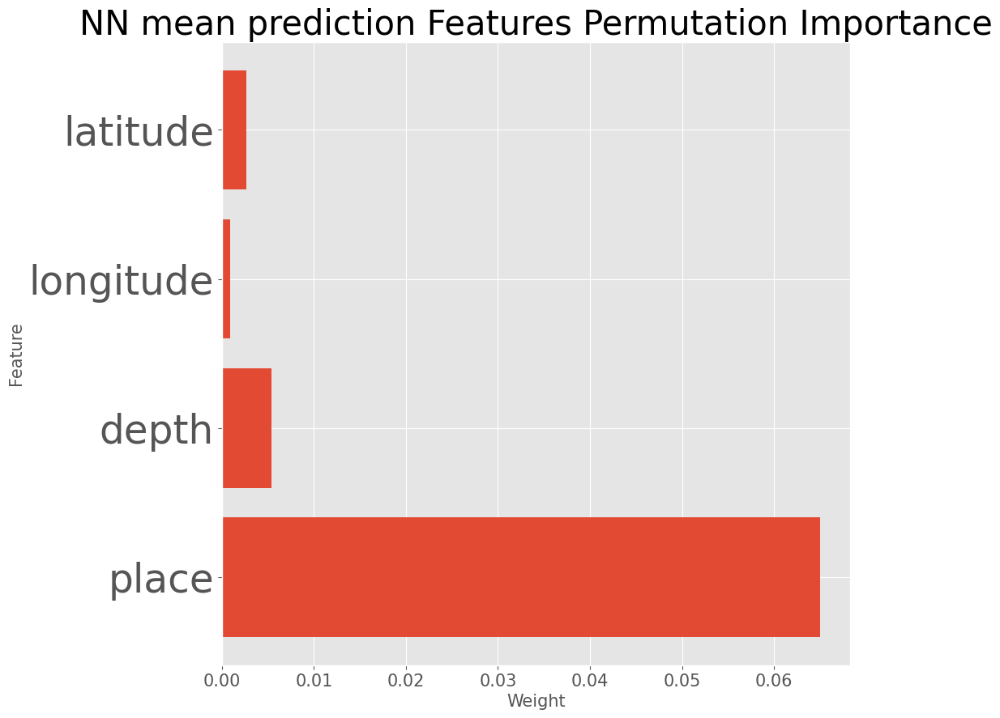

In [216]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.0650, 0.0054, 0.0009 , 0.0027]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('NN mean prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

In [217]:
# Lower Features Importance
print('NN lower prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qNN_model_lower, X_test_sc.values.reshape(-1,4), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_NN_perm_lower = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_NN_perm_lower.sort_values(by='Weight',ascending=False)

NN lower prediction Features Permutation Importance
8/8 [==============================] - 0s 2ms/step


,Weight,Feature
1,0.007592,depth
0,0.003340,place
3,-0.004159,latitude
2,-0.005080,longitude


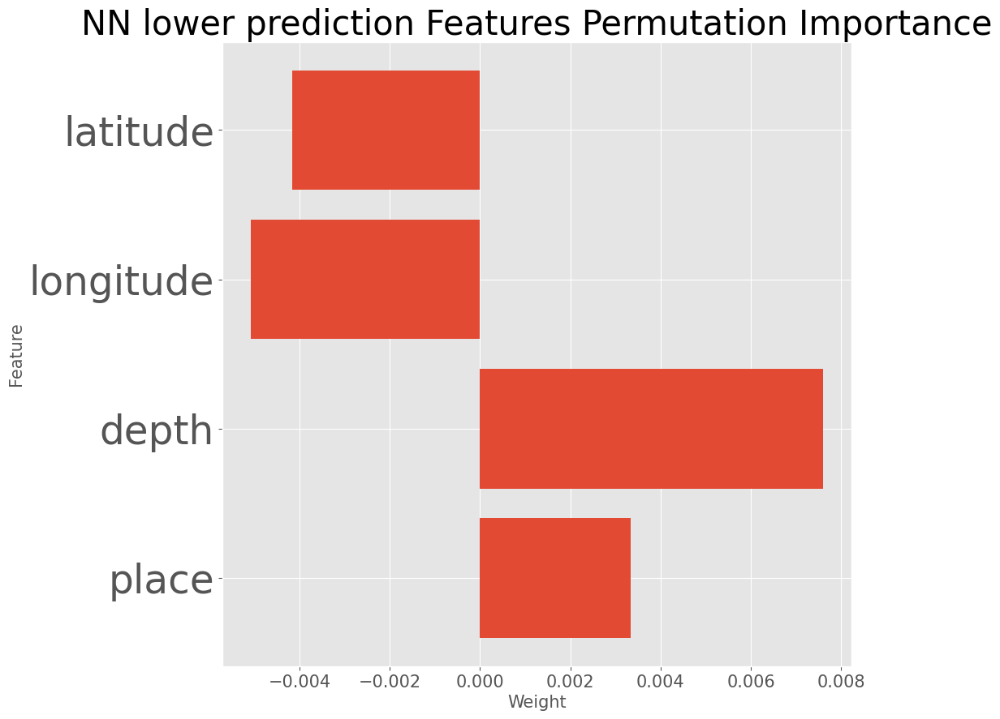

In [218]:
plt.rcParams['figure.figsize']=(10,10)
FI_NN_perm_lower_values = FI_NN_perm_lower.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_NN_perm_lower_values], [row[0] for row in FI_NN_perm_lower_values])
plt.title('NN lower prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [219]:
# Median Features Importance
print('NN median prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qNN_model_median, X_test_sc.values.reshape(-1,4), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_NN_perm_median = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_NN_perm_median.sort_values(by='Weight',ascending=False)

NN median prediction Features Permutation Importance
8/8 [==============================] - 0s 2ms/step


,Weight,Feature
3,0.002682,latitude
0,-0.002136,place
2,-0.004193,longitude
1,-0.005641,depth


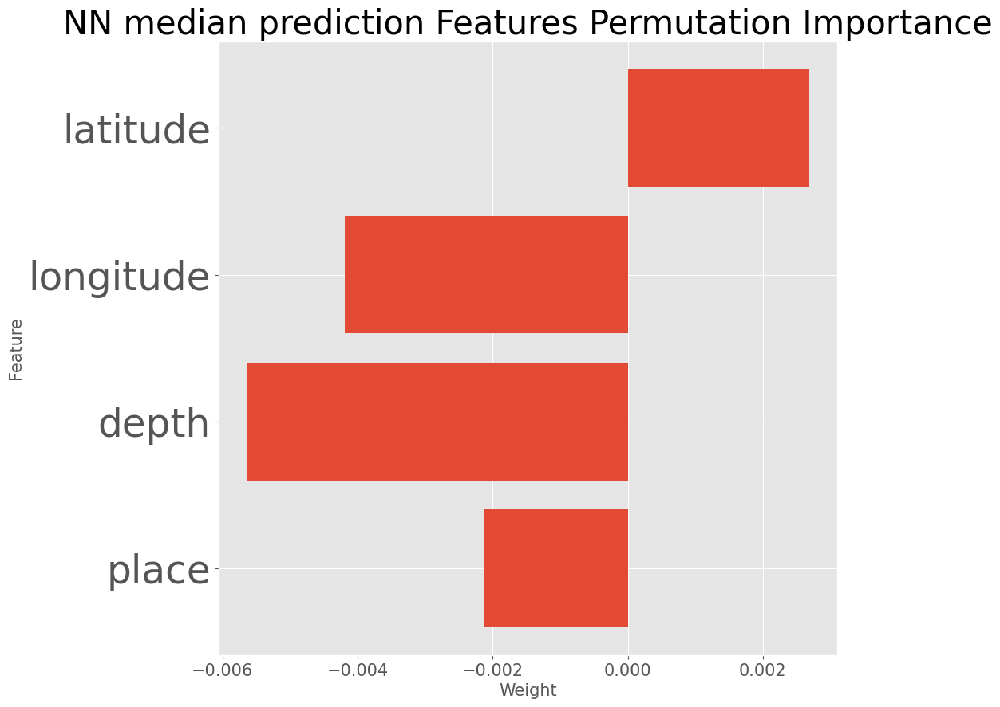

In [220]:
plt.rcParams['figure.figsize']=(10,10)
FI_NN_perm_median_values = FI_NN_perm_median.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_NN_perm_median_values], [row[0] for row in FI_NN_perm_median_values])
plt.title('NN median prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [221]:
# Upper Features Importance
print('NN upper prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qNN_model_upper, X_test_sc.values.reshape(-1,4), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_NN_perm_upper = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_NN_perm_upper.sort_values(by='Weight',ascending=False)

NN upper prediction Features Permutation Importance
8/8 [==============================] - 0s 2ms/step


,Weight,Feature
2,0.002385,longitude
1,0.000598,depth
0,-0.000259,place
3,-0.002137,latitude


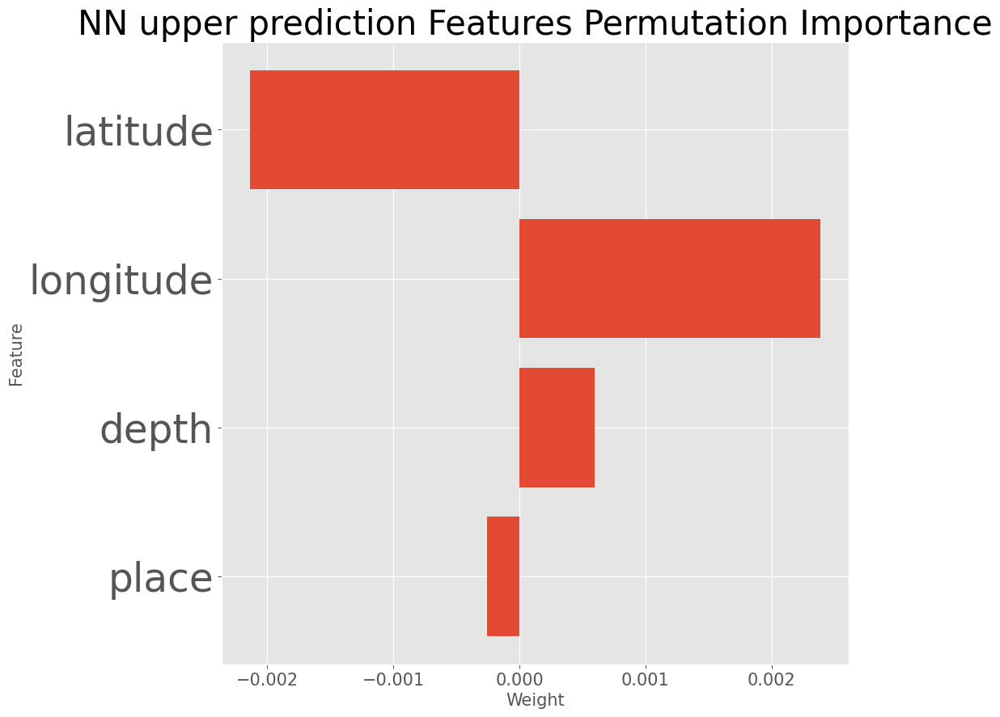

In [222]:
plt.rcParams['figure.figsize']=(10,10)
FI_NN_perm_upper_values = FI_NN_perm_upper.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_NN_perm_upper_values], [row[0] for row in FI_NN_perm_upper_values])
plt.title('NN upper prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

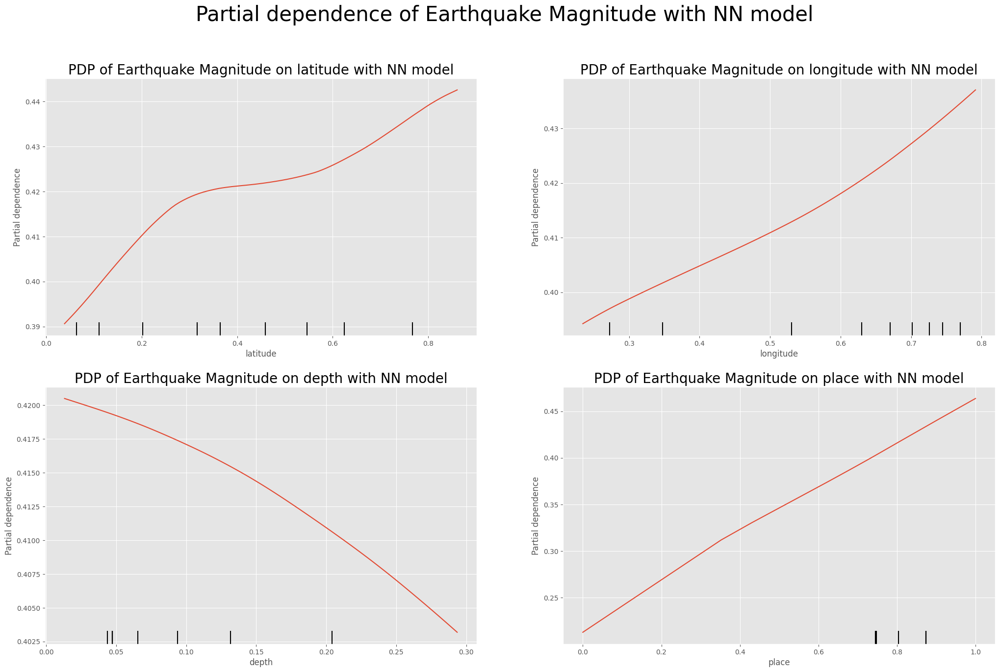

In [223]:
# Mean Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with NN model',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(NN_model, X_sc, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with NN model', fontsize=20)

plt.show()

277/277 [==============================] - 1s 2ms/step


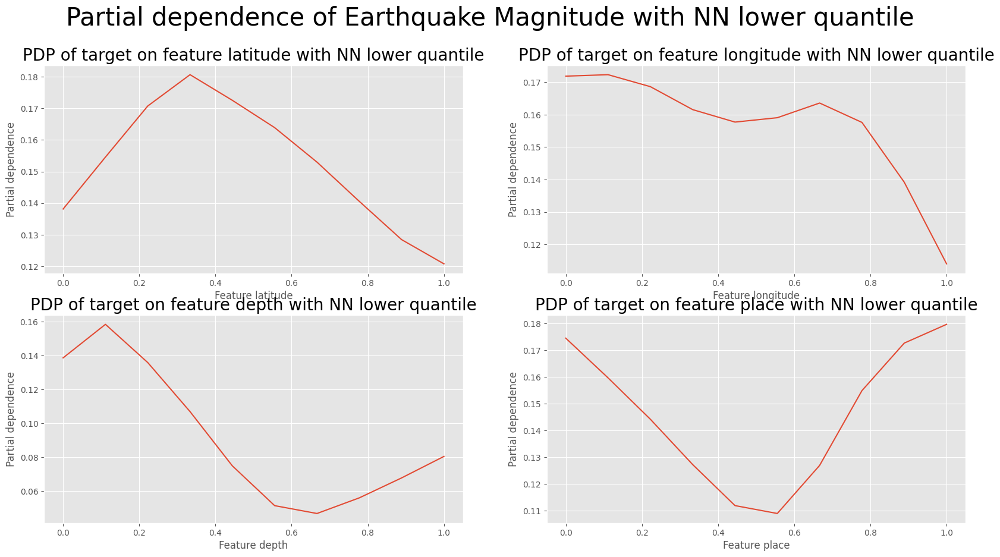

In [224]:
# Lower Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with NN lower quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qNN_model_lower, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with NN lower quantile", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


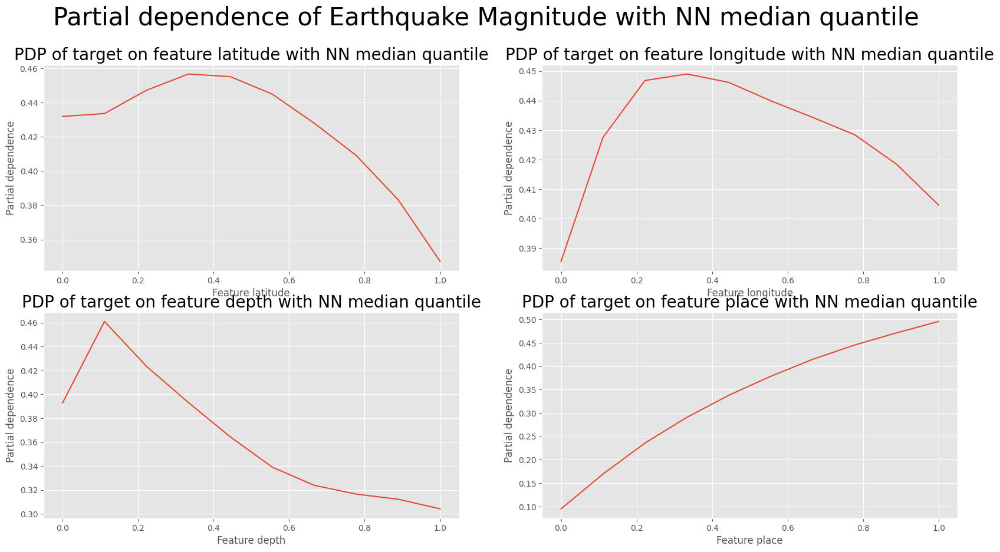

In [225]:
# Median Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with NN median quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qNN_model_median, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with NN median quantile", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


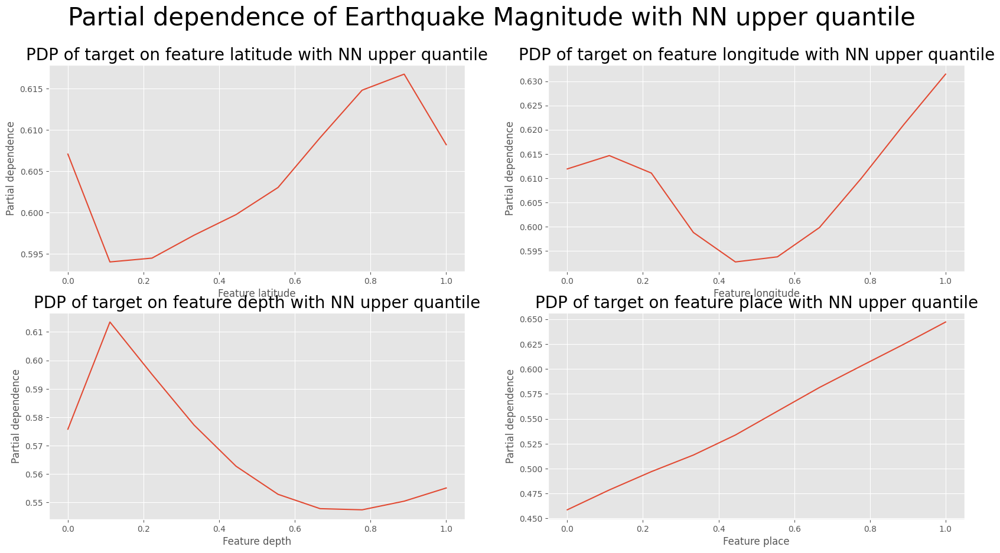

In [226]:
# Upper Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with NN upper quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qNN_model_upper, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with NN upper quantile", fontsize=20)
plt.show()

### Deep Learning

In [227]:
DL = MLPRegressor(hidden_layer_sizes=(100, 100, 100), activation='relu', solver='adam',
                  max_iter=50,random_state=0)

param_grid = {}
DL_model = GridSearchCV(DL,param_grid,cv=ts_cv)
DL_model.fit(X_train_sc, np.log1p(y_train_sc))
dl_mean_tr = DL_model.predict(X_train_sc)
dl_mean_te = DL_model.predict(X_test_sc)

In [228]:
qDL_model_lower = tf.keras.models.Sequential()
qDL_model_lower.add(tf.keras.layers.Dense(100, activation='relu', input_dim=4))
qDL_model_lower.add(tf.keras.layers.Dense(100, activation='relu'))
qDL_model_lower.add(tf.keras.layers.Dense(100, activation='relu'))
qDL_model_lower.add(tf.keras.layers.Dense(1, activation='linear'))
quantile = 0.05
qDL_model_lower.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Fit the model on the training data
    qDL_model_lower.fit(X_tr, np.log1p(y_tr), epochs=50, verbose=0)

qdl_lower_tr = qDL_model_lower.predict(X_train_sc)
qdl_lower_te = qDL_model_lower.predict(X_test_sc)

8/8 [==============================] - 0s 3ms/step


In [229]:
qDL_model_median = tf.keras.models.Sequential()
qDL_model_median.add(tf.keras.layers.Dense(100, activation='relu', input_dim=4))
qDL_model_median.add(tf.keras.layers.Dense(100, activation='relu'))
qDL_model_median.add(tf.keras.layers.Dense(100, activation='relu'))
qDL_model_median.add(tf.keras.layers.Dense(1, activation='linear'))
quantile = 0.50
qDL_model_median.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Fit the model on the training data
    qDL_model_median.fit(X_tr, np.log1p(y_tr), epochs=50, verbose=0)

qdl_median_tr = qDL_model_median.predict(X_train_sc)
qdl_median_te = qDL_model_median.predict(X_test_sc)

8/8 [==============================] - 0s 2ms/step


In [230]:
qDL_model_upper = tf.keras.models.Sequential()
qDL_model_upper.add(tf.keras.layers.Dense(100, activation='relu', input_dim=4))
qDL_model_upper.add(tf.keras.layers.Dense(100, activation='relu'))
qDL_model_upper.add(tf.keras.layers.Dense(100, activation='relu'))
qDL_model_upper.add(tf.keras.layers.Dense(1, activation='linear'))
quantile = 0.95
qDL_model_upper.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Fit the model on the training data
    qDL_model_upper.fit(X_tr, np.log1p(y_tr), epochs=50, verbose=0)

qdl_upper_tr = qDL_model_upper.predict(X_train_sc)
qdl_upper_te = qDL_model_upper.predict(X_test_sc)

8/8 [==============================] - 0s 2ms/step


In [231]:
#Train evaluation
mae_dl_mean_tr = mean_absolute_error(np.log1p(y_train_sc), dl_mean_tr)
rmse_dl_mean_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), dl_mean_tr))
mae_qdl_lower_tr = mean_absolute_error(np.log1p(y_train_sc), qdl_lower_tr)
rmse_qdl_lower_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qdl_lower_tr))
mae_qdl_median_tr = mean_absolute_error(np.log1p(y_train_sc), qdl_median_tr)
rmse_qdl_median_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qdl_median_tr))
mae_qdl_upper_tr = mean_absolute_error(np.log1p(y_train_sc), qdl_upper_tr)
rmse_qdl_upper_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qdl_upper_tr))

In [232]:
#Test evaluation
mae_dl_mean_te = mean_absolute_error(np.log1p(y_test_sc), dl_mean_te)
rmse_dl_mean_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), dl_mean_te))
mae_qdl_lower_te = mean_absolute_error(np.log1p(y_test_sc), qdl_lower_te)
rmse_qdl_lower_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qdl_lower_te))
mae_qdl_median_te = mean_absolute_error(np.log1p(y_test_sc), qdl_median_te)
rmse_qdl_median_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qdl_median_te))
mae_qdl_upper_te = mean_absolute_error(np.log1p(y_test_sc), qdl_upper_te)
rmse_qdl_upper_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qdl_upper_te))

In [233]:
# dl metrics table
df_dl = {'model': ['DL','DL'],
        'evaluation':['MAE','RMSE'],
        'train_mean':[mae_dl_mean_tr,rmse_dl_mean_tr],
        'test_mean': [mae_dl_mean_te,rmse_dl_mean_te],
        'train_lower': [mae_qdl_lower_tr,rmse_qdl_lower_tr],
        'test_lower': [mae_qdl_lower_te,rmse_qdl_lower_te],
        'train_median': [mae_qdl_median_tr,rmse_qdl_median_tr],
        'test_median': [mae_qdl_median_te,rmse_qdl_median_te],
        'train_upper': [mae_qdl_median_tr,rmse_qdl_upper_tr],
        'test_upper': [mae_qdl_median_te,rmse_qdl_upper_te]
         }
df_dl = pd.DataFrame(data=df_dl, columns=['model','evaluation',
                                            'train_lower','test_lower',
                                           'train_mean','test_mean',
                                           'train_median','test_median',
                                           'train_upper','test_upper'])
df_dl

,model,evaluation,train_lower,test_lower,train_mean,test_mean,train_median,test_median,train_upper,test_upper
0,DL,MAE,0.244182,0.290341,0.109142,0.112810,0.110924,0.128074,0.110924,0.128074
1,DL,RMSE,0.274345,0.317479,0.137707,0.136206,0.144207,0.158843,0.238290,0.221993


In [234]:
# create data as a list of dictionaries
df_dl_MAE_tr = [
  {'MAE': 'train_lower', 'value': mae_qdl_lower_tr},
  {'MAE': 'train_mean', 'value': mae_dl_mean_tr},
  {'MAE': 'train_median', 'value': mae_qdl_median_tr},
  {'MAE': 'train_upper', 'value': mae_qdl_upper_tr},
]

# create the DataFrame
df_dl_MAE_tr = pd.DataFrame(df_dl_MAE_tr)

# print the DataFrame
df_dl_MAE_tr

,MAE,value
0,train_lower,0.244182
1,train_mean,0.109142
2,train_median,0.110924
3,train_upper,0.198798


In [235]:
# create data as a list of dictionaries
df_dl_RMSE_tr = [
  {'RMSE': 'train_lower', 'value': rmse_qdl_lower_tr},
  {'RMSE': 'train_mean', 'value': rmse_dl_mean_tr},
  {'RMSE': 'train_median', 'value': rmse_qdl_median_tr},
  {'RMSE': 'train_upper', 'value': rmse_qdl_upper_tr},
]

# create the DataFrame
df_dl_RMSE_tr = pd.DataFrame(df_dl_RMSE_tr)

# print the DataFrame
df_dl_RMSE_tr

,RMSE,value
0,train_lower,0.274345
1,train_mean,0.137707
2,train_median,0.144207
3,train_upper,0.238290


In [236]:
df_dl_MAE_te = [
  {'MAE': 'test_lower', 'value': mae_qdl_lower_te},
  {'MAE': 'test_mean', 'value': mae_dl_mean_te},
  {'MAE': 'test_median', 'value': mae_qdl_median_te},
  {'MAE': 'test_upper', 'value': mae_qdl_upper_te},
]

# create the DataFrame
df_dl_MAE_te = pd.DataFrame(df_dl_MAE_te)

# print the DataFrame
df_dl_MAE_te

,MAE,value
0,test_lower,0.290341
1,test_mean,0.112810
2,test_median,0.128074
3,test_upper,0.187297


In [237]:
# create data as a list of dictionaries
df_dl_RMSE_te = [
  {'RMSE': 'test_lower', 'value': rmse_qdl_lower_te},
  {'RMSE': 'test_mean', 'value': rmse_dl_mean_te},
  {'RMSE': 'test_median', 'value': rmse_qdl_median_te},
  {'RMSE': 'test_upper', 'value': rmse_qdl_upper_te},
]

# create the DataFrame
df_dl_RMSE_te = pd.DataFrame(df_dl_RMSE_te)

# print the DataFrame
df_dl_RMSE_te

,RMSE,value
0,test_lower,0.317479
1,test_mean,0.136206
2,test_median,0.158843
3,test_upper,0.221993


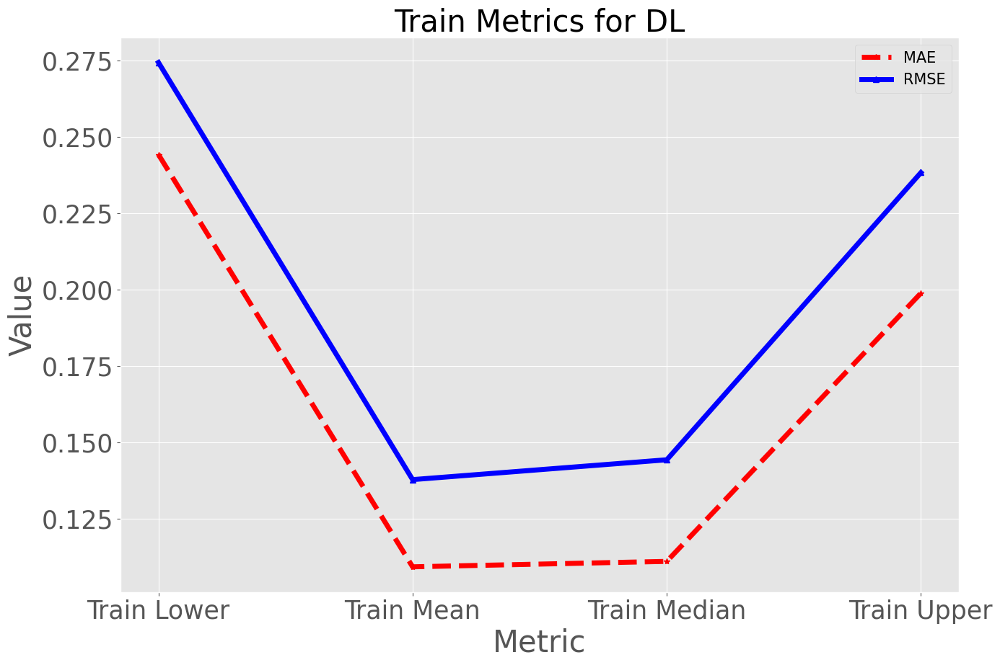

In [238]:
train_metrics_model(mae_qdl_lower_tr, mae_dl_mean_tr, mae_qdl_median_tr, mae_qdl_upper_tr,
                   rmse_qdl_lower_tr, rmse_dl_mean_tr, rmse_qdl_median_tr, rmse_qdl_upper_tr,'DL')

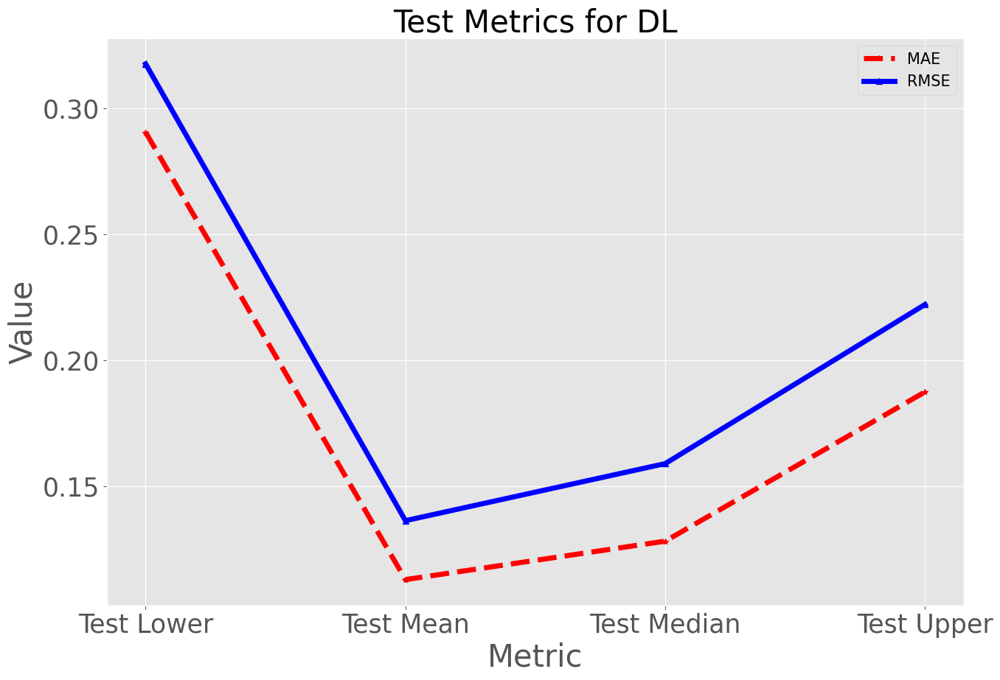

In [239]:
test_metrics_model(mae_qdl_lower_te, mae_dl_mean_te, mae_qdl_median_te, mae_qdl_upper_te,
                   rmse_qdl_lower_te, rmse_dl_mean_te, rmse_qdl_median_te, rmse_qdl_upper_te,'DL')

In [240]:
# Transformations
qdl_lower_ = scaling.inverse_transform(np.expm1(qdl_lower_te).reshape(-1,1))
qdl_median_ = scaling.inverse_transform(np.expm1(qdl_median_te).reshape(-1,1))
qdl_upper_ = scaling.inverse_transform(np.expm1(qdl_upper_te).reshape(-1,1))
dl_mean_ = scaling.inverse_transform(np.expm1(dl_mean_te).reshape(-1,1))


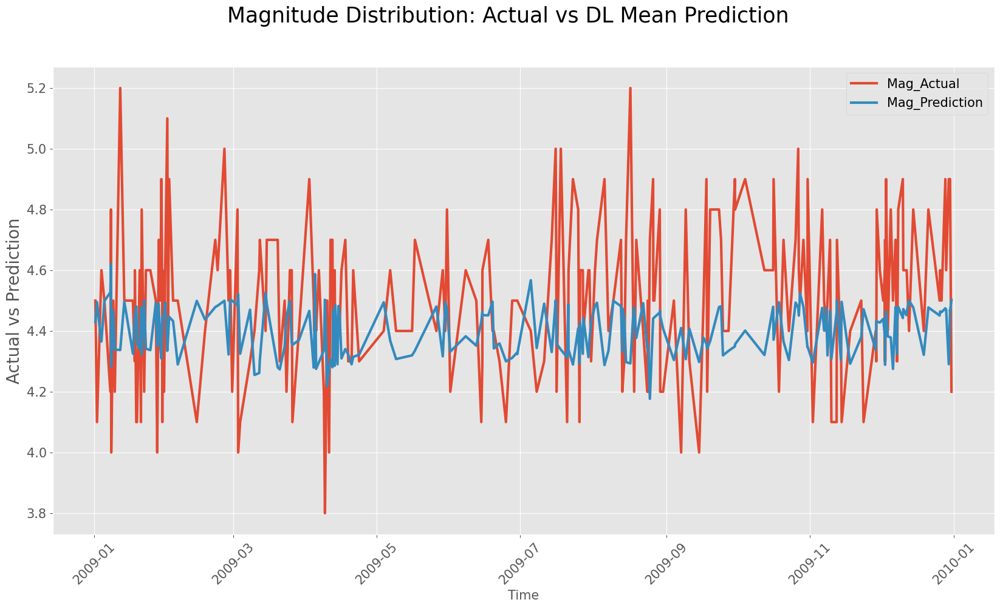

In [241]:
tsmultiplot(y_test, dl_mean_, 'DL')

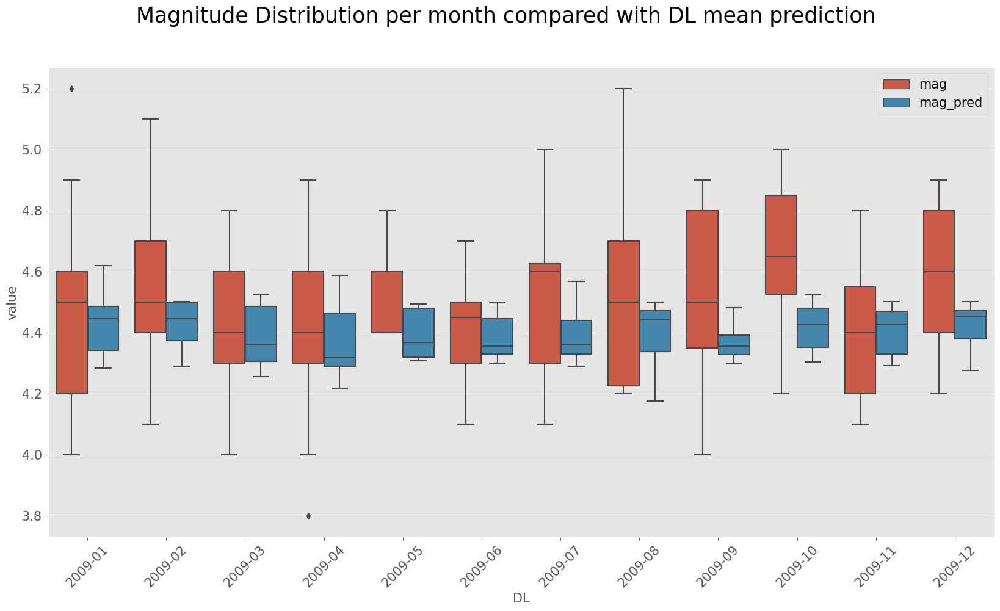

In [242]:
boxplot2(y_test, dl_mean_, 'DL')

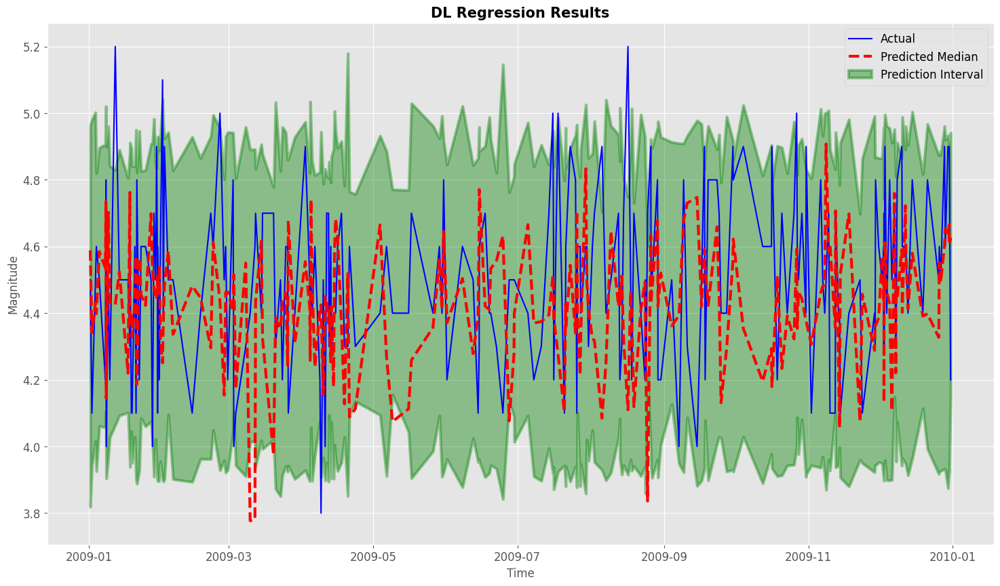

In [243]:
results_tsplot(qdl_lower_, dl_mean_, qdl_median_, qdl_upper_,'DL')

In [244]:
# Lower Percentile
percentile_DL_lower=(qdl_lower_ > y_test.values).mean()
percentile_DL_lower

0.0148480478555787

In [245]:
# Median Percentile
percentile_DL_median=(qdl_median_ > y_test.values).mean()
percentile_DL_median

0.41295020384909825

In [246]:
# Upper Percentile
percentile_DL_upper=(qdl_upper_ > y_test.values).mean()
percentile_DL_upper

0.9301037939076715

In [247]:
# Coverage
coverage_DL = np.logical_and(
            qdl_lower_ < y_test.values,
            qdl_upper_ > y_test.values).mean()
coverage_DL

0.9152557460520928

In [248]:
# Mean Features Importance
print('DL mean prediction Features Permutation Importance')
DL_perm_mean = PermutationImportance(DL_model, random_state=0).fit(X_test_sc, np.log1p(y_test_sc))
FI_DL_mean = eli5.show_weights(DL_perm_mean, feature_names = X_test.columns.tolist())
FI_DL_mean

DL mean prediction Features Permutation Importance


Weight,Feature
0.0855 ± 0.0483,place
0.0412 ± 0.0315,depth
-0.0018 ± 0.0159,longitude
-0.0097 ± 0.0316,latitude


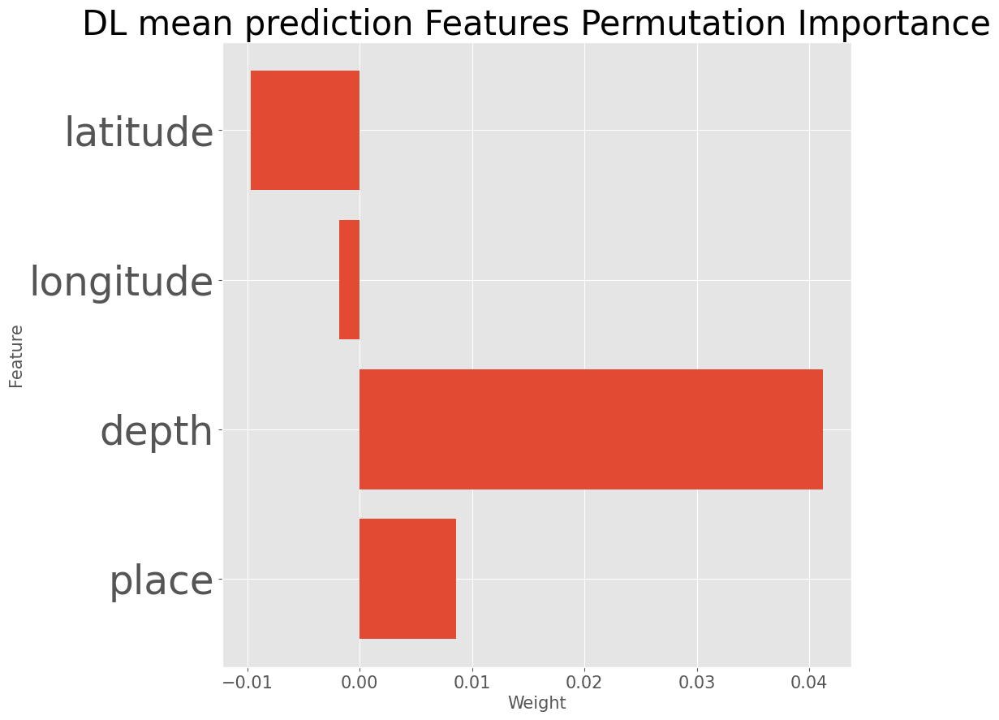

In [249]:
# Define the values for weight and feature
plt.rcParams['figure.figsize']=(10,10)
weight = [0.00855, 0.0412,  -0.0018, -0.0097]
feature = ["place", "depth", "longitude", "latitude"]

# Create a figure and an axis
fig, ax = plt.subplots()

# Plot a horizontal bar chart
ax.barh(feature, weight)

# Add labels and title
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
ax.set_title('DL mean prediction Features Permutation Importance', fontsize=30)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)

plt.show()

In [250]:
# Lower Features Importance
print('DL lower prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qDL_model_lower, X_test_sc.values.reshape(-1,4), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_DL_perm_lower = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_DL_perm_lower.sort_values(by='Weight',ascending=False)

DL lower prediction Features Permutation Importance
8/8 [==============================] - 0s 2ms/step


,Weight,Feature
1,0.008714,depth
0,0.000762,place
2,-0.001102,longitude
3,-0.004745,latitude


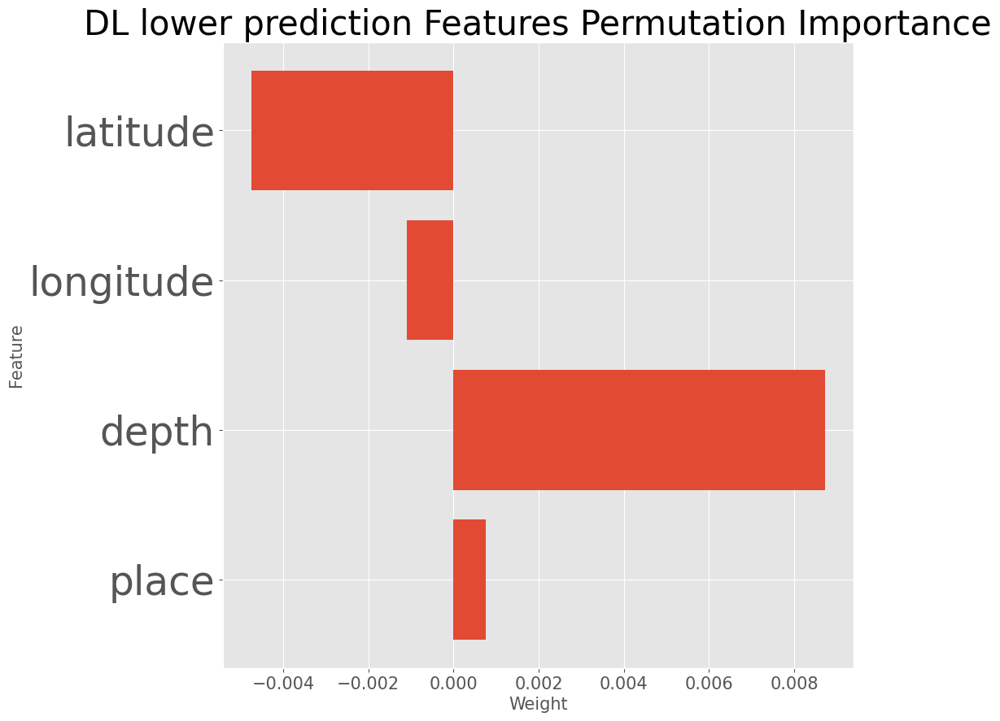

In [251]:
plt.rcParams['figure.figsize']=(10,10)
FI_DL_perm_lower_values = FI_DL_perm_lower.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_DL_perm_lower_values], [row[0] for row in FI_DL_perm_lower_values])
plt.title('DL lower prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [252]:
# Median Features Importance
print('DL median prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qDL_model_median, X_test_sc.values.reshape(-1,4), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_DL_perm_median = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_DL_perm_median.sort_values(by='Weight',ascending=False)

DL median prediction Features Permutation Importance
8/8 [==============================] - 0s 2ms/step


,Weight,Feature
3,0.003271,latitude
1,-0.002746,depth
0,-0.002754,place
2,-0.003463,longitude


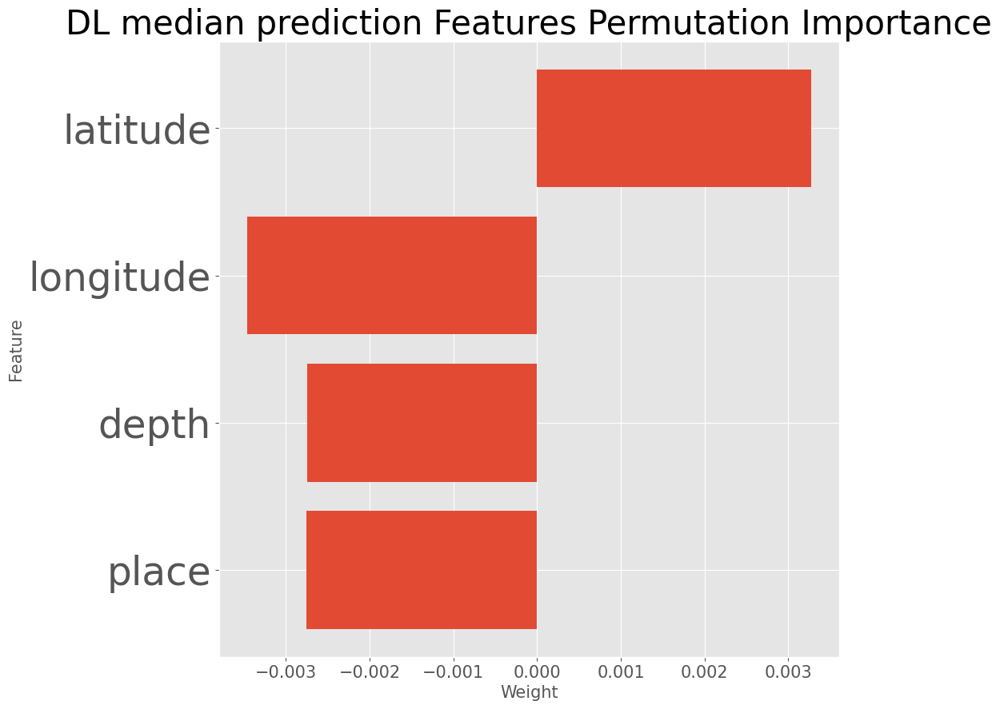

In [253]:
plt.rcParams['figure.figsize']=(10,10)
FI_DL_perm_median_values = FI_DL_perm_median.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_DL_perm_median_values], [row[0] for row in FI_DL_perm_median_values])
plt.title('DL median prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [254]:
# Upper Features Importance
print('DL upper prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qDL_model_upper, X_test_sc.values.reshape(-1,4), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_DL_perm_upper = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_DL_perm_upper.sort_values(by='Weight',ascending=False)

DL upper prediction Features Permutation Importance
8/8 [==============================] - 0s 2ms/step


,Weight,Feature
1,0.000517,depth
2,-0.000975,longitude
0,-0.001408,place
3,-0.001745,latitude


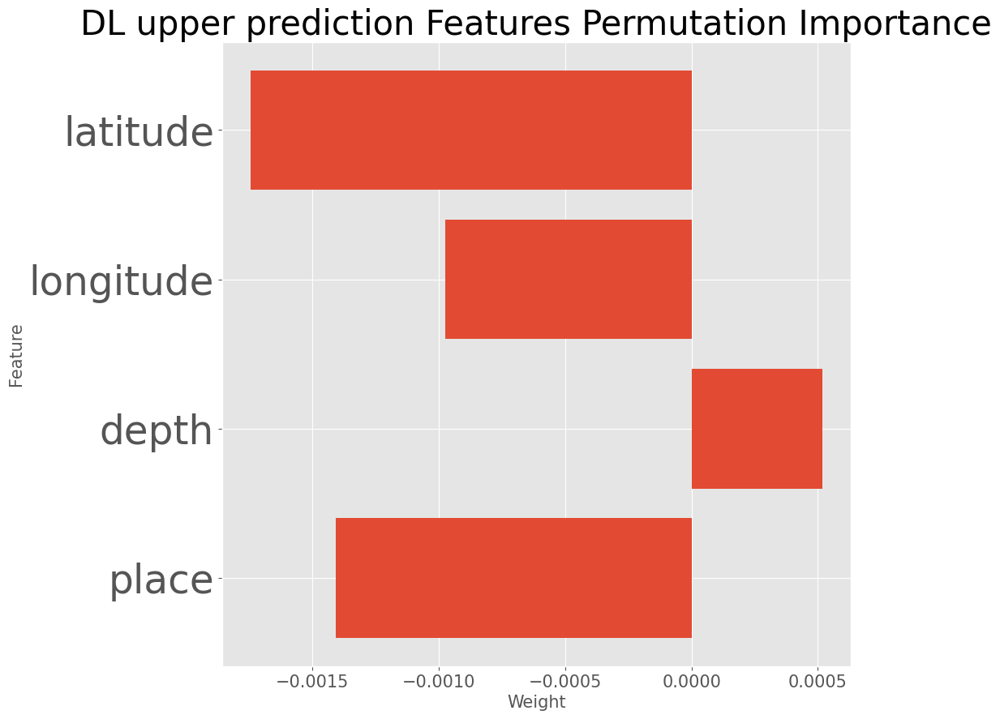

In [255]:
plt.rcParams['figure.figsize']=(10,10)
FI_DL_perm_upper_values = FI_DL_perm_upper.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_DL_perm_upper_values], [row[0] for row in FI_DL_perm_upper_values])
plt.title('DL upper prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

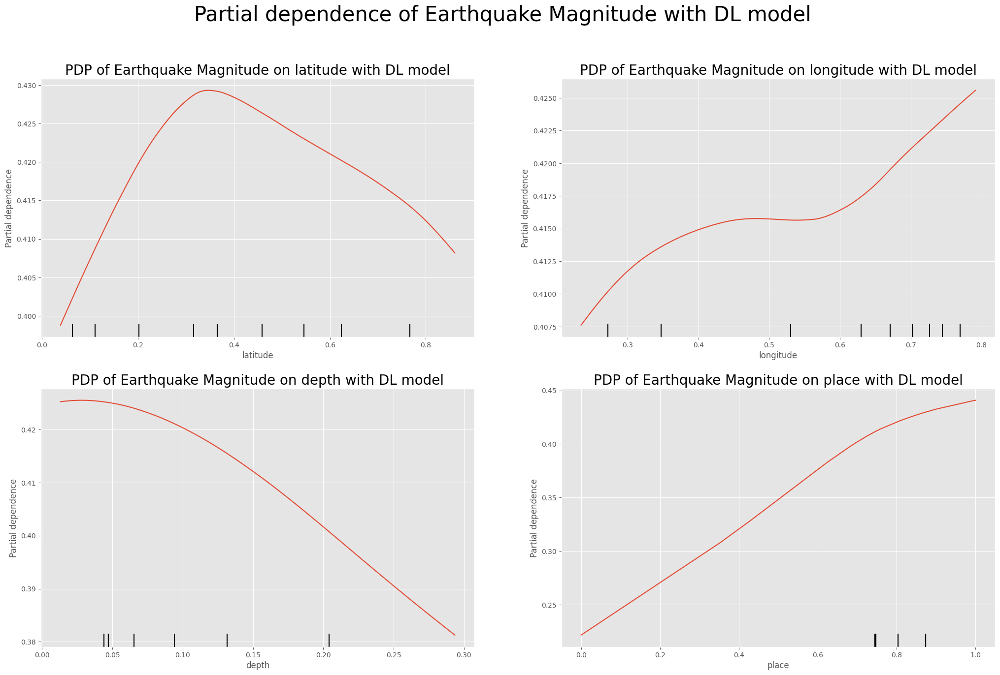

In [256]:
# Mean Partial Dependence Plot
plt.rcParams['figure.figsize']=(25,15)
fig, axs = plt.subplots(nrows=2, ncols=2)
plt.suptitle('Partial dependence of Earthquake Magnitude with DL model',fontsize=30)

features = ['latitude','longitude','depth','place']
for i, feature in enumerate(features):
    ax = axs.flatten()[i]
    PartialDependenceDisplay.from_estimator(DL_model, X_sc, [feature], ax=ax, kind='average', random_state=0)
    ax.set_title(f'PDP of Earthquake Magnitude on {feature} with DL model', fontsize=20)

plt.show()

277/277 [==============================] - 1s 2ms/step


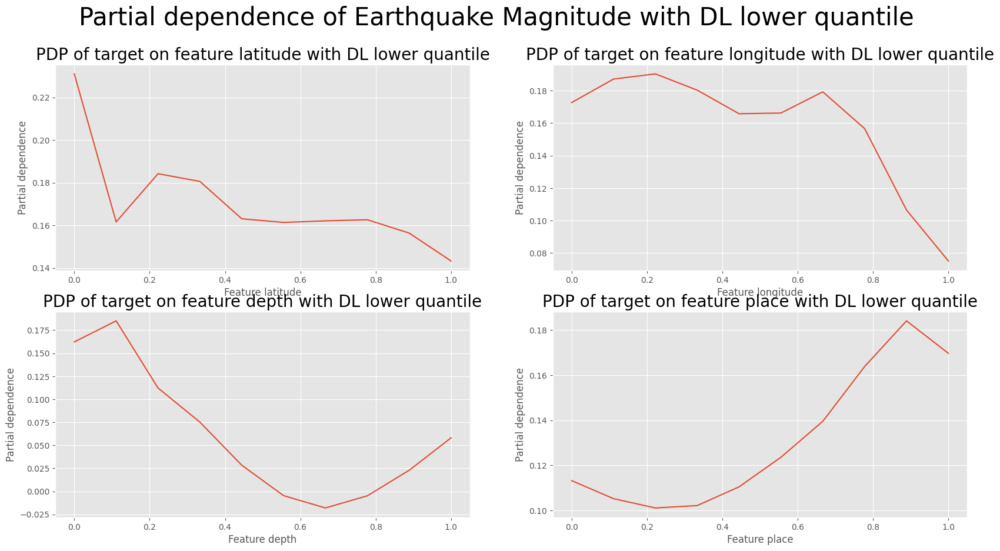

In [257]:
# Lower Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with DL lower quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qDL_model_lower, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with DL lower quantile", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


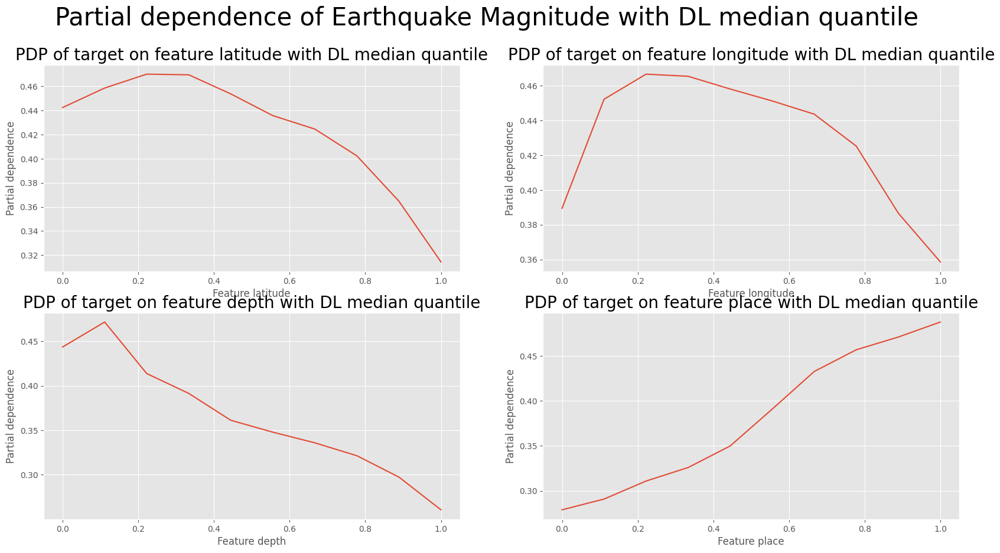

In [258]:
# Median Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with DL median quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qDL_model_median, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with DL median quantile", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


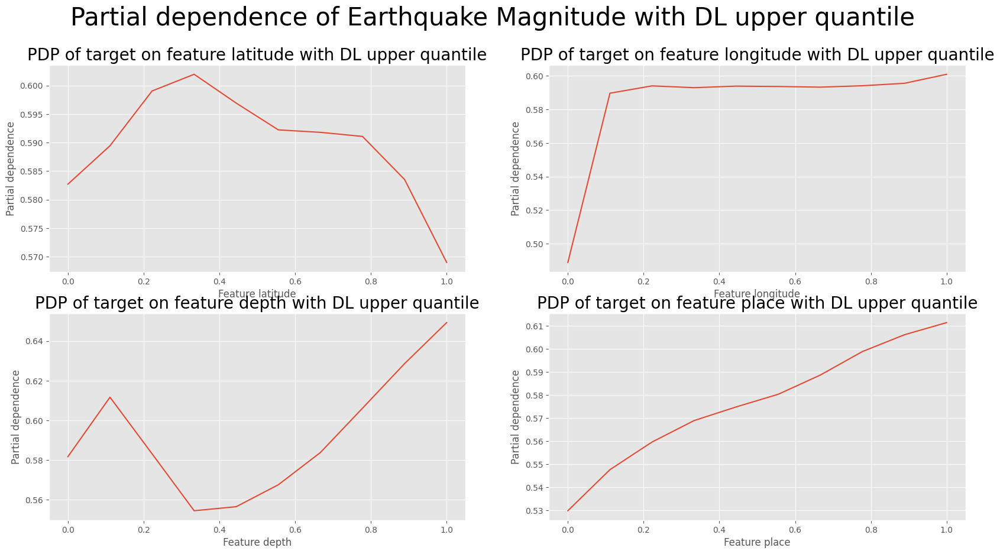

In [259]:
# Upper Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with DL upper quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence(qDL_model_upper, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with DL upper quantile", fontsize=20)
plt.show()

### Convolutional Neural Networks

In [260]:
CNN_model = tf.keras.models.Sequential()
CNN_model.add(tf.keras.layers.Conv1D(filters=32, kernel_size=1, activation='relu', input_shape=(4, 1)))
CNN_model.add(tf.keras.layers.MaxPooling1D())
CNN_model.add(tf.keras.layers.Flatten())
CNN_model.add(tf.keras.layers.Dense(100, activation='relu'))
CNN_model.add(tf.keras.layers.Dense(1, activation='linear'))  # Output layer with a single neuron for regression
CNN_model.compile(optimizer='adam', loss='mse')
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Reshape the data for the CNN model
    X_tr = X_tr.values.reshape(-1,4,1)

    # Fit the model on the training data
    CNN_model.fit(X_tr, np.log1p(y_tr), epochs=50,batch_size=16, verbose=0)

cnn_mean_tr = CNN_model.predict(X_train_sc.values.reshape(-1,4,1))
cnn_mean_te = CNN_model.predict(X_test_sc.values.reshape(-1,4,1))

8/8 [==============================] - 0s 3ms/step


In [261]:
qCNN_model_lower = tf.keras.models.Sequential()
qCNN_model_lower.add(tf.keras.layers.Conv1D(filters=32, kernel_size=1, activation='relu', input_shape=(4, 1)))
qCNN_model_lower.add(tf.keras.layers.MaxPooling1D())
qCNN_model_lower.add(tf.keras.layers.Flatten())
qCNN_model_lower.add(tf.keras.layers.Dense(100, activation='relu'))
qCNN_model_lower.add(tf.keras.layers.Dense(1, activation='linear'))  # Output layer with a single neuron for regression
quantile = 0.05
qCNN_model_lower.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Reshape the data for the CNN model
    X_tr = X_tr.values.reshape(-1,4,1)

    # Fit the model on the training data
    qCNN_model_lower.fit(X_tr, np.log1p(y_tr), epochs=50,batch_size=16, verbose=0)


qcnn_lower_tr = qCNN_model_lower.predict(X_train_sc.values.reshape(-1,4,1))
qcnn_lower_te = qCNN_model_lower.predict(X_test_sc.values.reshape(-1,4,1))

8/8 [==============================] - 0s 3ms/step


In [262]:
qCNN_model_median = tf.keras.models.Sequential()
qCNN_model_median.add(tf.keras.layers.Conv1D(filters=32, kernel_size=1, activation='relu', input_shape=(4, 1)))
qCNN_model_median.add(tf.keras.layers.MaxPooling1D())
qCNN_model_median.add(tf.keras.layers.Flatten())
qCNN_model_median.add(tf.keras.layers.Dense(100, activation='relu'))
qCNN_model_median.add(tf.keras.layers.Dense(1, activation='linear'))  # Output layer with a single neuron for regression
quantile = 0.50
qCNN_model_median.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Reshape the data for the CNN model
    X_tr = X_tr.values.reshape(-1,4,1)

    # Fit the model on the training data
    qCNN_model_median.fit(X_tr, np.log1p(y_tr), epochs=50,batch_size=16, verbose=0)


qcnn_median_tr = qCNN_model_median.predict(X_train_sc.values.reshape(-1,4,1))
qcnn_median_te = qCNN_model_median.predict(X_test_sc.values.reshape(-1,4,1))

8/8 [==============================] - 0s 2ms/step


In [263]:
qCNN_model_upper = tf.keras.models.Sequential()
qCNN_model_upper.add(tf.keras.layers.Conv1D(filters=32, kernel_size=1, activation='relu', input_shape=(4, 1)))
qCNN_model_upper.add(tf.keras.layers.MaxPooling1D())
qCNN_model_upper.add(tf.keras.layers.Flatten())
qCNN_model_upper.add(tf.keras.layers.Dense(100, activation='relu'))
qCNN_model_upper.add(tf.keras.layers.Dense(1, activation='linear'))  # Output layer with a single neuron for regression
quantile = 0.95
qCNN_model_upper.compile(optimizer='adam', loss=lambda y, y_p: quantile_loss(quantile, y, y_p))
# Loop over the splits
for train_index, test_index in ts_cv.split(X_train_sc):
    # Get the training and test data
    X_tr, X_te = X_tr_sc.iloc[train_index], X_tr_sc.iloc[test_index]
    y_tr, y_te = y_tr_sc.iloc[train_index], y_tr_sc.iloc[test_index]

    # Reshape the data for the CNN model
    X_tr = X_tr.values.reshape(-1,4,1)

    # Fit the model on the training data
    qCNN_model_upper.fit(X_tr, np.log1p(y_tr), epochs=50,batch_size=16, verbose=0)


qcnn_upper_tr = qCNN_model_upper.predict(X_train_sc.values.reshape(-1,4,1))
qcnn_upper_te = qCNN_model_upper.predict(X_test_sc.values.reshape(-1,4,1))

8/8 [==============================] - 0s 3ms/step


In [264]:
#Train evaluation
mae_cnn_mean_tr = mean_absolute_error(np.log1p(y_train_sc), cnn_mean_tr)
rmse_cnn_mean_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), cnn_mean_tr))
mae_qcnn_lower_tr = mean_absolute_error(np.log1p(y_train_sc), qcnn_lower_tr)
rmse_qcnn_lower_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qcnn_lower_tr))
mae_qcnn_median_tr = mean_absolute_error(np.log1p(y_train_sc), qcnn_median_tr)
rmse_qcnn_median_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qcnn_median_tr))
mae_qcnn_upper_tr = mean_absolute_error(np.log1p(y_train_sc), qcnn_upper_tr)
rmse_qcnn_upper_tr = np.sqrt(mean_squared_error(np.log1p(y_train_sc), qcnn_upper_tr))

In [265]:
#Test evaluation
mae_cnn_mean_te = mean_absolute_error(np.log1p(y_test_sc), cnn_mean_te)
rmse_cnn_mean_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), cnn_mean_te))
mae_qcnn_lower_te = mean_absolute_error(np.log1p(y_test_sc), qcnn_lower_te)
rmse_qcnn_lower_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qcnn_lower_te))
mae_qcnn_median_te = mean_absolute_error(np.log1p(y_test_sc), qcnn_median_te)
rmse_qcnn_median_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qcnn_median_te))
mae_qcnn_upper_te = mean_absolute_error(np.log1p(y_test_sc), qcnn_upper_te)
rmse_qcnn_upper_te = np.sqrt(mean_squared_error(np.log1p(y_test_sc), qcnn_upper_te))

In [266]:
# cnn metrics table
df_cnn = {'model': ['CNN','CNN'],
        'evaluation':['MAE','RMSE'],
        'train_mean':[mae_cnn_mean_tr,rmse_cnn_mean_tr],
        'test_mean': [mae_cnn_mean_te,rmse_cnn_mean_te],
        'train_lower': [mae_qcnn_lower_tr,rmse_qcnn_lower_tr],
        'test_lower': [mae_qcnn_lower_te,rmse_qcnn_lower_te],
        'train_median': [mae_qcnn_median_tr,rmse_qcnn_median_tr],
        'test_median': [mae_qcnn_median_te,rmse_qcnn_median_te],
        'train_upper': [mae_qcnn_median_tr,rmse_qcnn_upper_tr],
        'test_upper': [mae_qcnn_median_te,rmse_qcnn_upper_te]
         }
df_cnn = pd.DataFrame(data=df_cnn, columns=['model','evaluation',
                                            'train_lower','test_lower',
                                           'train_mean','test_mean',
                                           'train_median','test_median',
                                           'train_upper','test_upper'])
df_cnn

,model,evaluation,train_lower,test_lower,train_mean,test_mean,train_median,test_median,train_upper,test_upper
0,CNN,MAE,0.248935,0.290195,0.110134,0.113125,0.111325,0.120228,0.111325,0.120228
1,CNN,RMSE,0.278324,0.317381,0.139697,0.137085,0.143027,0.146973,0.254077,0.249081


In [267]:
# create data as a list of dictionaries
df_cnn_MAE_tr = [
  {'MAE': 'train_lower', 'value': mae_qcnn_lower_tr},
  {'MAE': 'train_mean', 'value': mae_cnn_mean_tr},
  {'MAE': 'train_median', 'value': mae_qcnn_median_tr},
  {'MAE': 'train_upper', 'value': mae_qcnn_upper_tr},
]

# create the DataFrame
df_cnn_MAE_tr = pd.DataFrame(df_cnn_MAE_tr)

# print the DataFrame
df_cnn_MAE_tr

,MAE,value
0,train_lower,0.248935
1,train_mean,0.110134
2,train_median,0.111325
3,train_upper,0.215531


In [268]:
# create data as a list of dictionaries
df_cnn_RMSE_tr = [
  {'RMSE': 'train_lower', 'value': rmse_qcnn_lower_tr},
  {'RMSE': 'train_mean', 'value': rmse_cnn_mean_tr},
  {'RMSE': 'train_median', 'value': rmse_qcnn_median_tr},
  {'RMSE': 'train_upper', 'value': rmse_qcnn_upper_tr},
]

# create the DataFrame
df_cnn_RMSE_tr = pd.DataFrame(df_cnn_RMSE_tr)

# print the DataFrame
df_cnn_RMSE_tr

,RMSE,value
0,train_lower,0.278324
1,train_mean,0.139697
2,train_median,0.143027
3,train_upper,0.254077


In [269]:
df_cnn_MAE_te = [
  {'MAE': 'test_lower', 'value': mae_qcnn_lower_te},
  {'MAE': 'test_mean', 'value': mae_cnn_mean_te},
  {'MAE': 'test_median', 'value': mae_qcnn_median_te},
  {'MAE': 'test_upper', 'value': mae_qcnn_upper_te},
]

# create the DataFrame
df_cnn_MAE_te = pd.DataFrame(df_cnn_MAE_te)

# print the DataFrame
df_cnn_MAE_te

,MAE,value
0,test_lower,0.290195
1,test_mean,0.113125
2,test_median,0.120228
3,test_upper,0.218233


In [270]:
# create data as a list of dictionaries
df_cnn_RMSE_te = [
  {'RMSE': 'test_lower', 'value': rmse_qcnn_lower_te},
  {'RMSE': 'test_mean', 'value': rmse_cnn_mean_te},
  {'RMSE': 'test_median', 'value': rmse_qcnn_median_te},
  {'RMSE': 'test_upper', 'value': rmse_qcnn_upper_te},
]

# create the DataFrame
df_cnn_RMSE_te = pd.DataFrame(df_cnn_RMSE_te)

# print the DataFrame
df_cnn_RMSE_te

,RMSE,value
0,test_lower,0.317381
1,test_mean,0.137085
2,test_median,0.146973
3,test_upper,0.249081


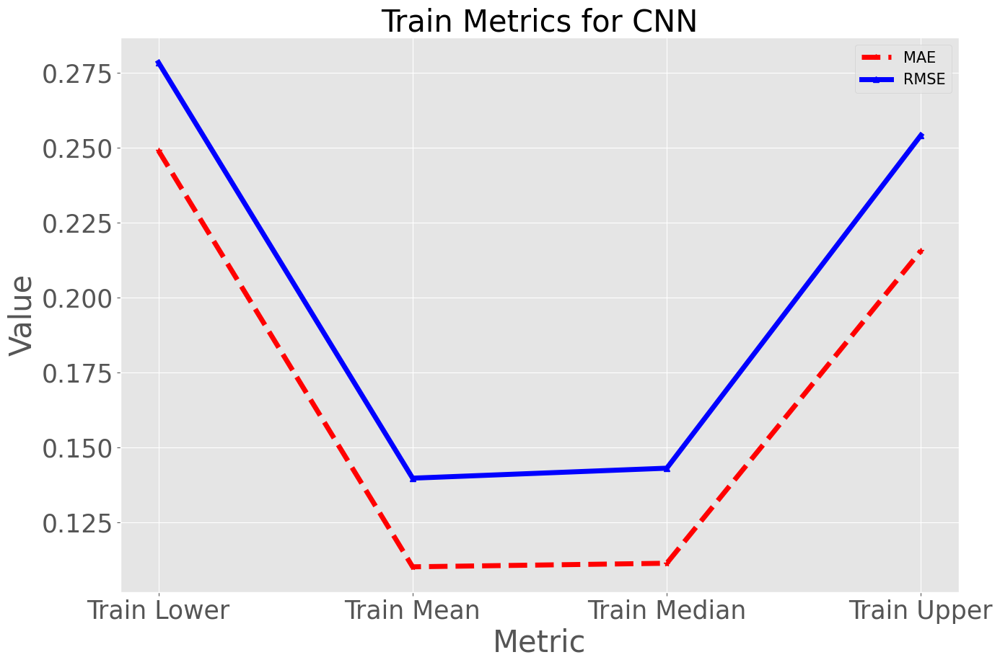

In [271]:
train_metrics_model(mae_qcnn_lower_tr, mae_cnn_mean_tr, mae_qcnn_median_tr, mae_qcnn_upper_tr,
                   rmse_qcnn_lower_tr, rmse_cnn_mean_tr, rmse_qcnn_median_tr, rmse_qcnn_upper_tr,'CNN')

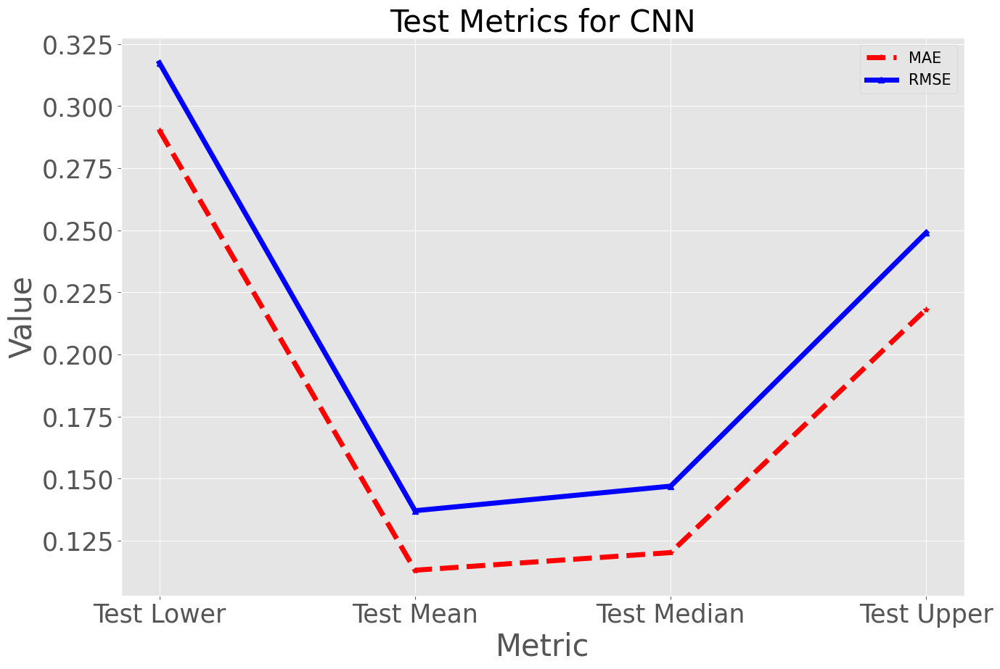

In [272]:
test_metrics_model(mae_qcnn_lower_te, mae_cnn_mean_te, mae_qcnn_median_te, mae_qcnn_upper_te,
                   rmse_qcnn_lower_te, rmse_cnn_mean_te, rmse_qcnn_median_te, rmse_qcnn_upper_te,'CNN')

In [273]:
# Transformations
qcnn_lower_ = scaling.inverse_transform(np.expm1(qcnn_lower_te).reshape(-1,1))
qcnn_median_ = scaling.inverse_transform(np.expm1(qcnn_median_te).reshape(-1,1))
qcnn_upper_ = scaling.inverse_transform(np.expm1(qcnn_upper_te).reshape(-1,1))
cnn_mean_ = scaling.inverse_transform(np.expm1(cnn_mean_te).reshape(-1,1))


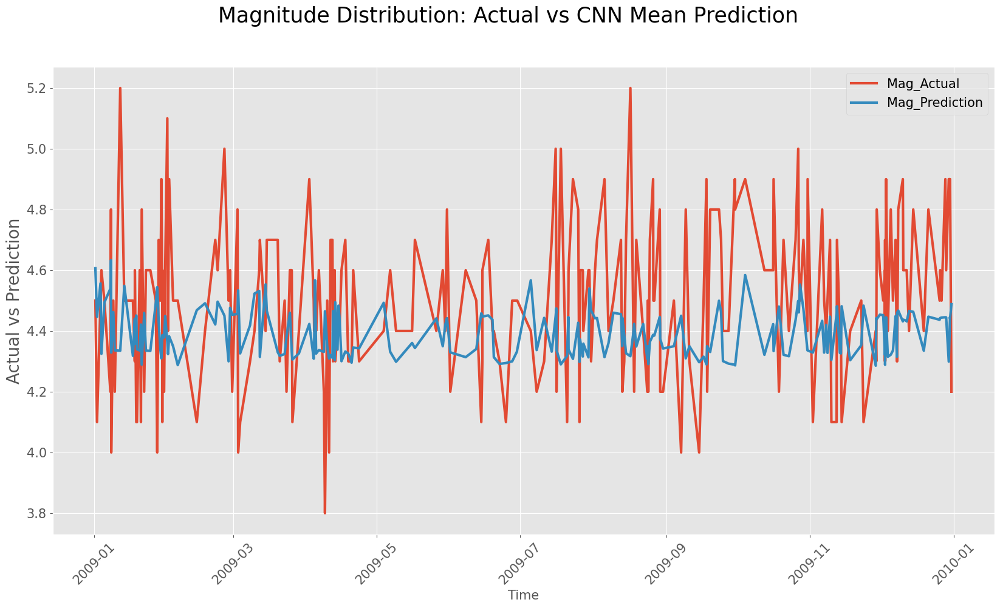

In [274]:
tsmultiplot(y_test, cnn_mean_, 'CNN')

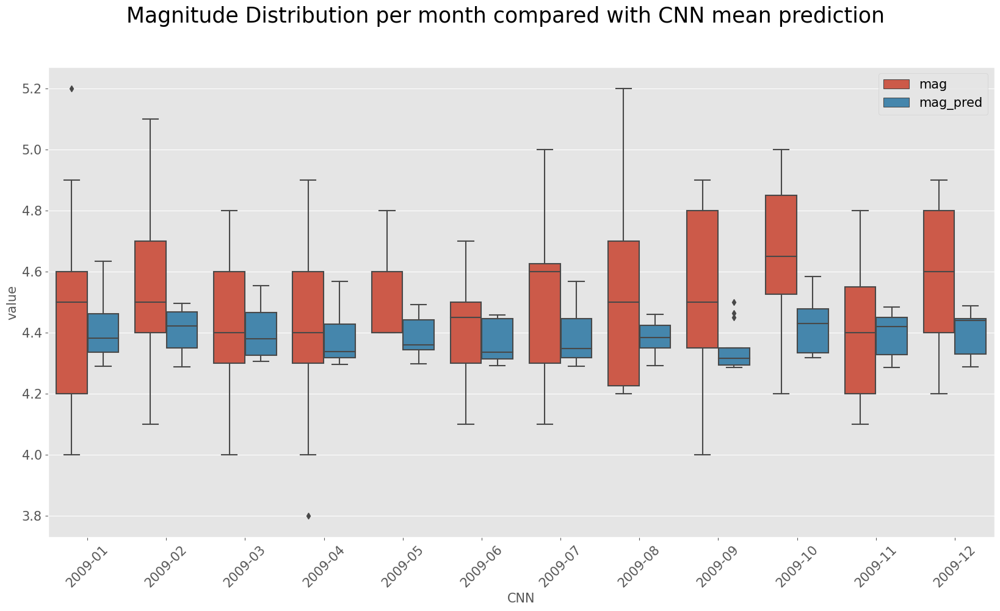

In [275]:
boxplot2(y_test, cnn_mean_, 'CNN')

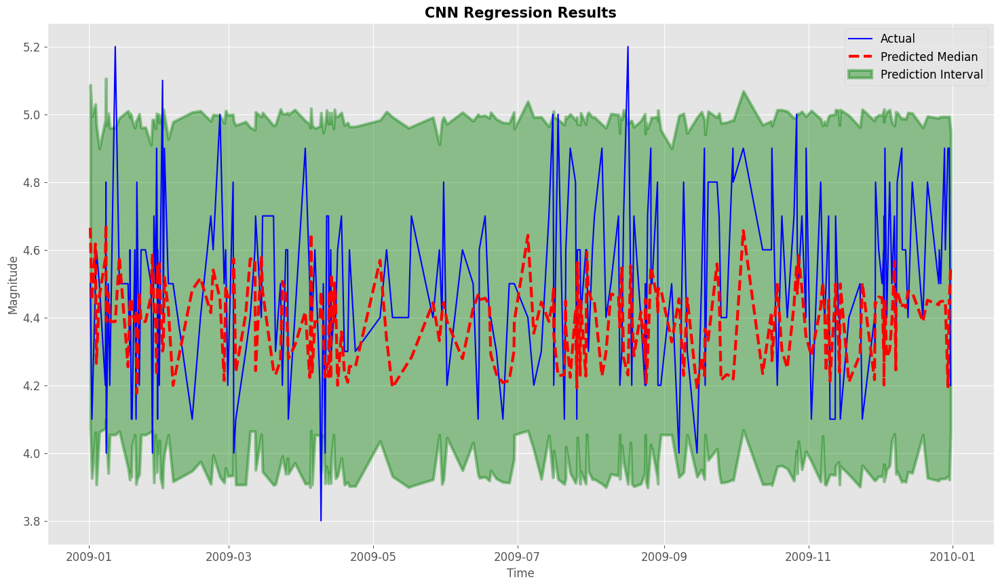

In [276]:
results_tsplot(qcnn_lower_, cnn_mean_, qcnn_median_, qcnn_upper_,'CNN')

In [277]:
# Lower Percentile
percentile_CNN_lower=(qcnn_lower_ > y_test.values).mean()
percentile_CNN_lower

0.011144937599031493

In [278]:
# Median Percentile
percentile_CNN_median=(qcnn_median_ > y_test.values).mean()
percentile_CNN_median

0.35581904609304066

In [279]:
# Upper Percentile
percentile_CNN_upper=(qcnn_upper_ > y_test.values).mean()
percentile_CNN_upper

0.9745767238156279

In [280]:
# Coverage
coverage_CNN = np.logical_and(
            qcnn_lower_ < y_test.values,
            qcnn_upper_ > y_test.values).mean()
coverage_CNN

0.9634317862165963

In [281]:
# Mean Features Importance
print('CNN mean prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(CNN_model, X_test_sc.values.reshape(-1,4,1), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_CNN_perm_mean = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_CNN_perm_mean.sort_values(by='Weight',ascending=False)

CNN mean prediction Features Permutation Importance
8/8 [==============================] - 0s 3ms/step


,Weight,Feature
1,-0.000043,depth
0,-0.000105,place
2,-0.000155,longitude
3,-0.000637,latitude


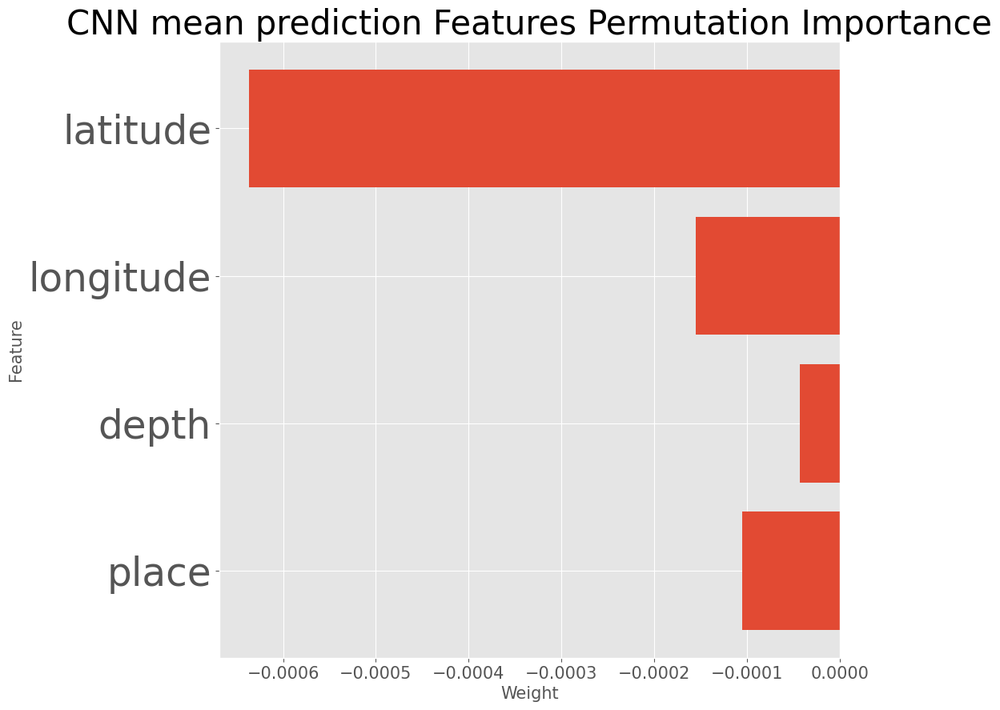

In [282]:
plt.rcParams['figure.figsize']=(10,10)
FI_CNN_perm_mean_values = FI_CNN_perm_mean.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_CNN_perm_mean_values], [row[0] for row in FI_CNN_perm_mean_values])
plt.title('CNN mean prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [283]:
# Lower Features Importance
print('CNN lower prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qCNN_model_lower, X_test_sc.values.reshape(-1,4,1), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_CNN_perm_lower = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_CNN_perm_lower.sort_values(by='Weight',ascending=False)

CNN lower prediction Features Permutation Importance
8/8 [==============================] - 0s 3ms/step


,Weight,Feature
1,0.004556,depth
0,0.002531,place
2,0.000948,longitude
3,0.000731,latitude


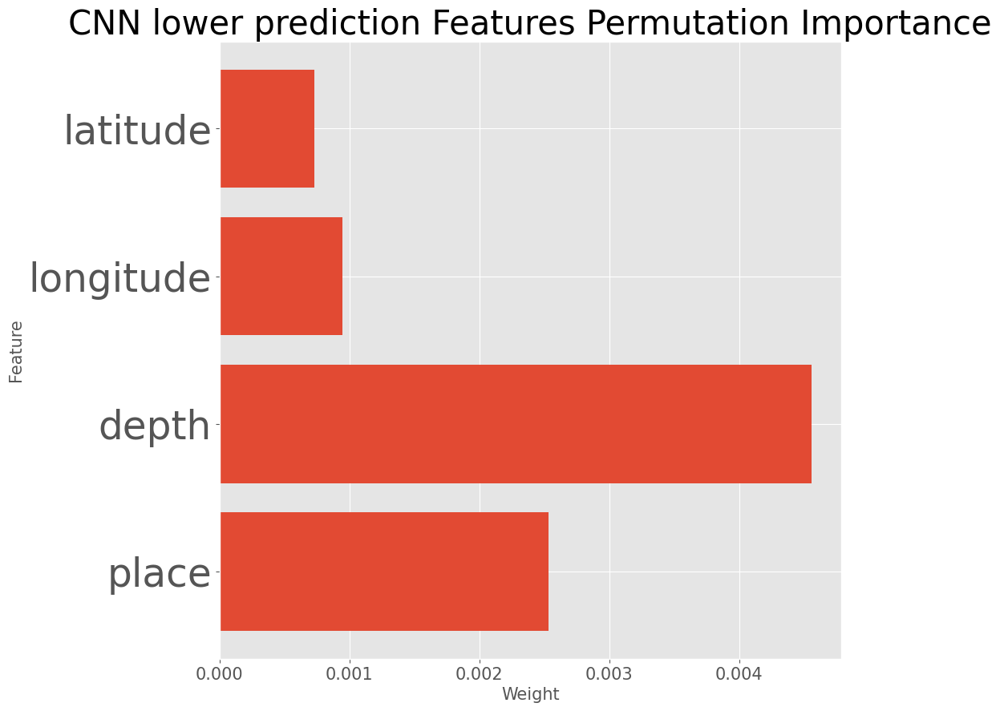

In [284]:
plt.rcParams['figure.figsize']=(10,10)
FI_CNN_perm_lower_values = FI_CNN_perm_lower.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_CNN_perm_lower_values], [row[0] for row in FI_CNN_perm_lower_values])
plt.title('CNN lower prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [285]:
# Median Features Importance
print('CNN median prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qCNN_model_median, X_test_sc.values.reshape(-1,4,1), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_CNN_perm_median = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_CNN_perm_median.sort_values(by='Weight',ascending=False)

CNN median prediction Features Permutation Importance
8/8 [==============================] - 0s 3ms/step


,Weight,Feature
0,0.000411,place
2,-0.000154,longitude
1,-0.000191,depth
3,-0.002546,latitude


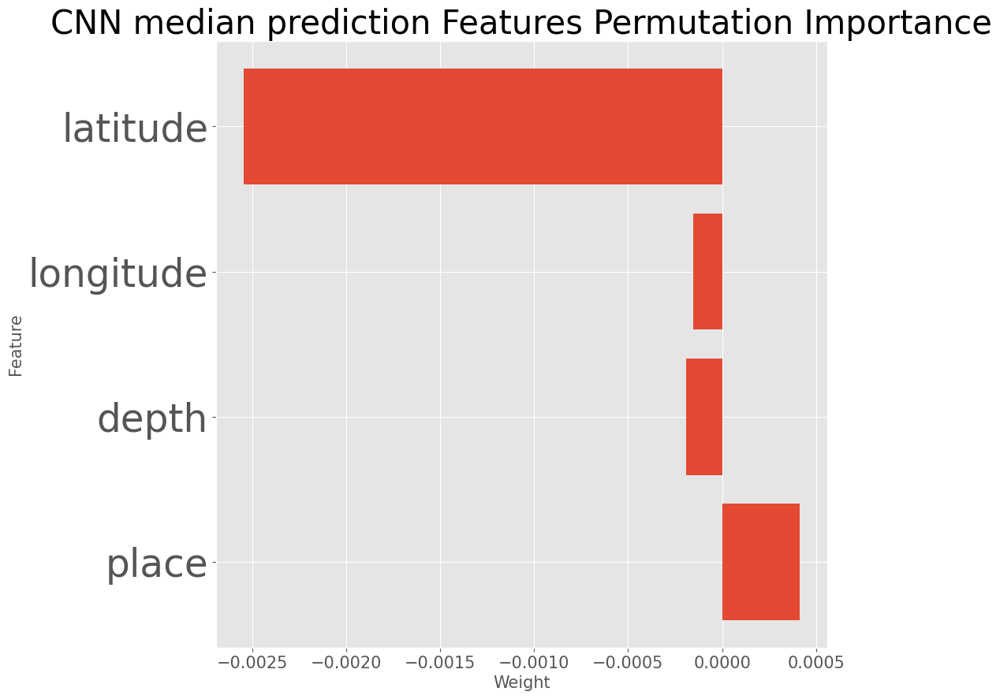

In [286]:
plt.rcParams['figure.figsize']=(10,10)
FI_CNN_perm_median_values = FI_CNN_perm_median.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_CNN_perm_median_values], [row[0] for row in FI_CNN_perm_median_values])
plt.title('CNN median prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

In [287]:
# Upper Features Importance
print('CNN upper prediction Features Permutation Importance')
feature_importances = permutation_feature_importance(qCNN_model_upper, X_test_sc.values.reshape(-1,4,1), np.log1p(y_test_sc))
# Create a pandas dataframe with two columns: Weight and Feature
feature_names = ['place', 'depth', 'longitude', 'latitude']
FI_CNN_perm_upper = pd.DataFrame({'Weight': feature_importances, 'Feature': feature_names})
# Print the feature importances
FI_CNN_perm_upper.sort_values(by='Weight',ascending=False)

CNN upper prediction Features Permutation Importance
8/8 [==============================] - 0s 3ms/step


,Weight,Feature
0,1.715289e-03,place
1,1.386719e-03,depth
3,-3.243562e-07,latitude
2,-2.937347e-05,longitude


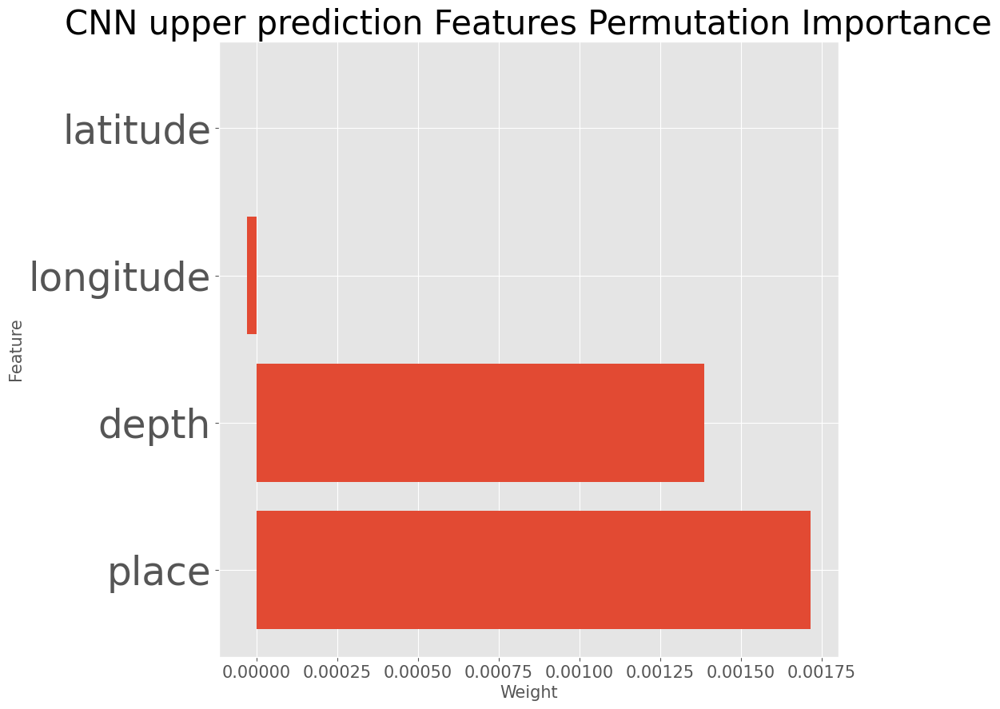

In [288]:
plt.rcParams['figure.figsize']=(10,10)
FI_CNN_perm_upper_values = FI_CNN_perm_upper.values.tolist()
fig, ax = plt.subplots()
plt.barh([row[1] for row in FI_CNN_perm_upper_values], [row[0] for row in FI_CNN_perm_upper_values])
plt.title('CNN upper prediction Features Permutation Importance', fontsize=30)
ax.set_xlabel("Weight", fontsize=15)
ax.set_ylabel("Feature",fontsize=15)
plt.yticks(fontsize=35)
plt.xticks(fontsize=15)
plt.show()

277/277 [==============================] - 1s 2ms/step


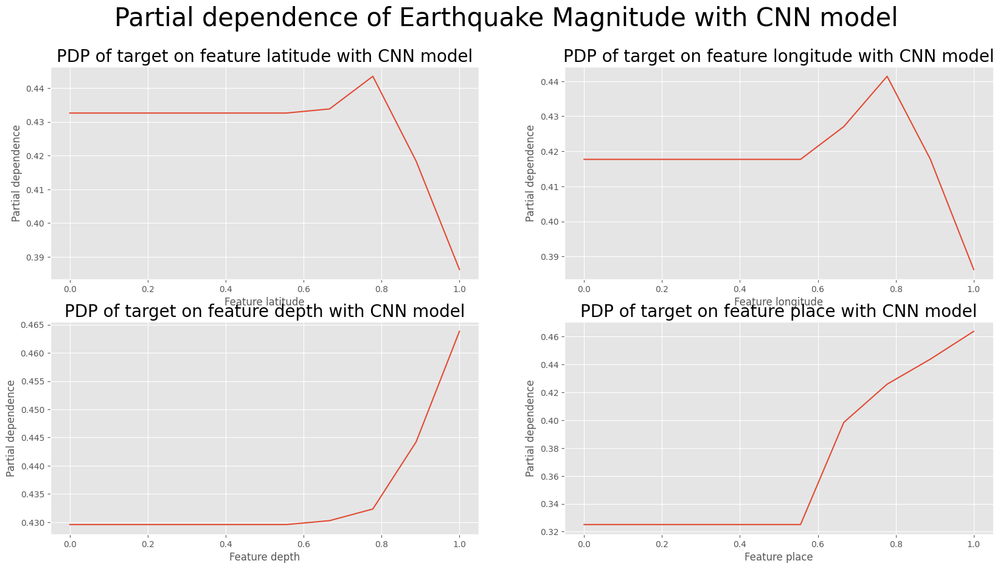

In [289]:
# Mean Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with CNN model',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence_mod(CNN_model, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with CNN model", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


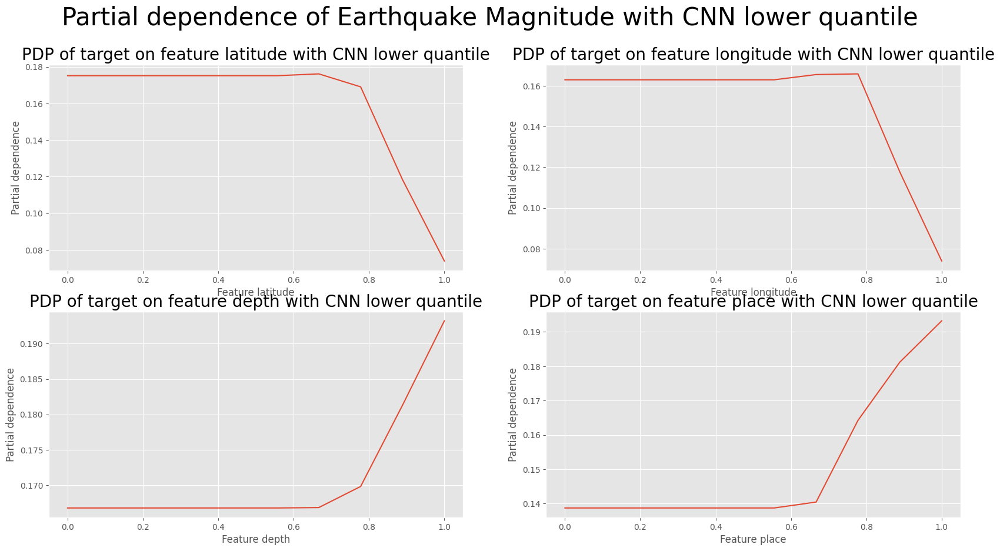

In [290]:
# Lower Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with CNN lower quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence_mod(qCNN_model_lower, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with CNN lower quantile", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


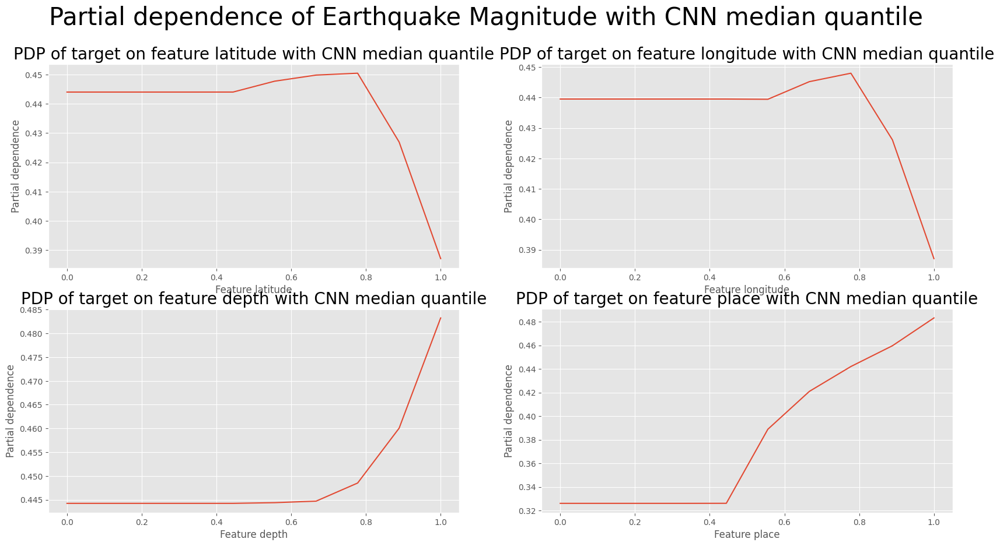

In [291]:
# Median Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with CNN median quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence_mod(qCNN_model_median, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with CNN median quantile", fontsize=20)
plt.show()

277/277 [==============================] - 1s 2ms/step


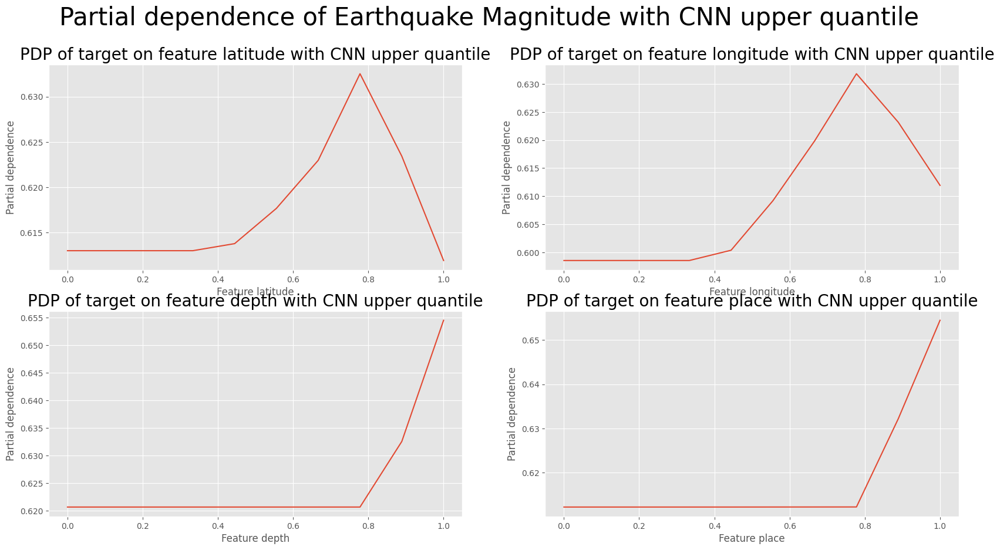

In [292]:
# Upper Partial dependence plot
plt.figure(figsize=(20, 10))
plt.suptitle('Partial dependence of Earthquake Magnitude with CNN upper quantile',fontsize=30)

for j in range (n_features):
    # Calculate the partial dependence for feature j
    grid, pdp = partial_dependence_mod(qCNN_model_upper, X_sc.to_numpy(), j, kind="average")
    # Plot the partial dependence curve
    plt.subplot(2, 2, j+1)
    plt.plot(grid, pdp)
    plt.xlabel(f"Feature {X_sc.columns[j]}")
    plt.ylabel("Partial dependence")
    plt.title(f"PDP of target on feature {X_sc.columns[j]} with CNN upper quantile", fontsize=20)
plt.show()

### Results

I’ve trained and fitted 6 models, k-nearest neighours as a benchmark, compared with modern machine learning models: 2 ensemble models and neural networks from shallow, to deep feed forward networks and convolutional neural networks.
The idea to use knn is coming from the non-linearitty of data and because it was already used in this type of study by Pisarenko for instance.

In the above pictures with blue line are represented the projection of the last year of observations: 2009 used as test set. With the dotted red line is represented the median quantile and in green the prediction interval.

it can be seen that the forecast interval in knn is jagged and does not cover some spikes. The situation improves in random forests but the median quantile doesn't generalize well the actual values. With GBM median quantile generalize well the actual values and the prediction interval is large.
With neural networks family the prediction interval is jagged, in both feedforward neural networks predicted median do not generalize well observations.
With the CNN the prediction interval is larger and seems to generalize better in the first part of the year.


With the following graphs are reported the evaluation metrics results in train and test set, with the 3 quantile points and the mean prediction. Results are coming from the angles and lines are just drafted for a better visualization.
Better performances are coming from lines close to the x-axes, so by the ensemble models.
Gradient boosting perform in a better way then random forest that overfit.


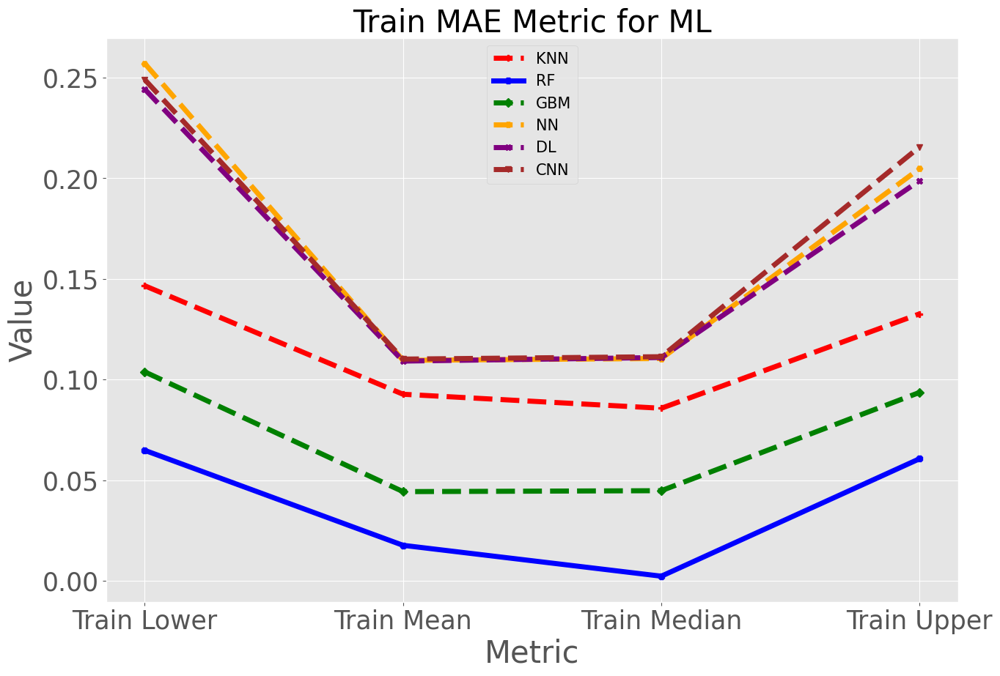

In [293]:
overall_train_metric(mae_qknn_lower_tr, mae_knn_mean_tr, mae_qknn_median_tr, mae_qknn_upper_tr,
                  mae_qrf_lower_tr, mae_rf_mean_tr, mae_qrf_median_tr, mae_qrf_upper_tr,
                  mae_qgbm_lower_tr, mae_gbm_mean_tr, mae_qgbm_median_tr, mae_qgbm_upper_tr,
                  mae_qnn_lower_tr, mae_nn_mean_tr, mae_qnn_median_tr, mae_qnn_upper_tr,
                  mae_qdl_lower_tr, mae_dl_mean_tr, mae_qdl_median_tr, mae_qdl_upper_tr,
                  mae_qcnn_lower_tr, mae_cnn_mean_tr, mae_qcnn_median_tr, mae_qcnn_upper_tr,'MAE')

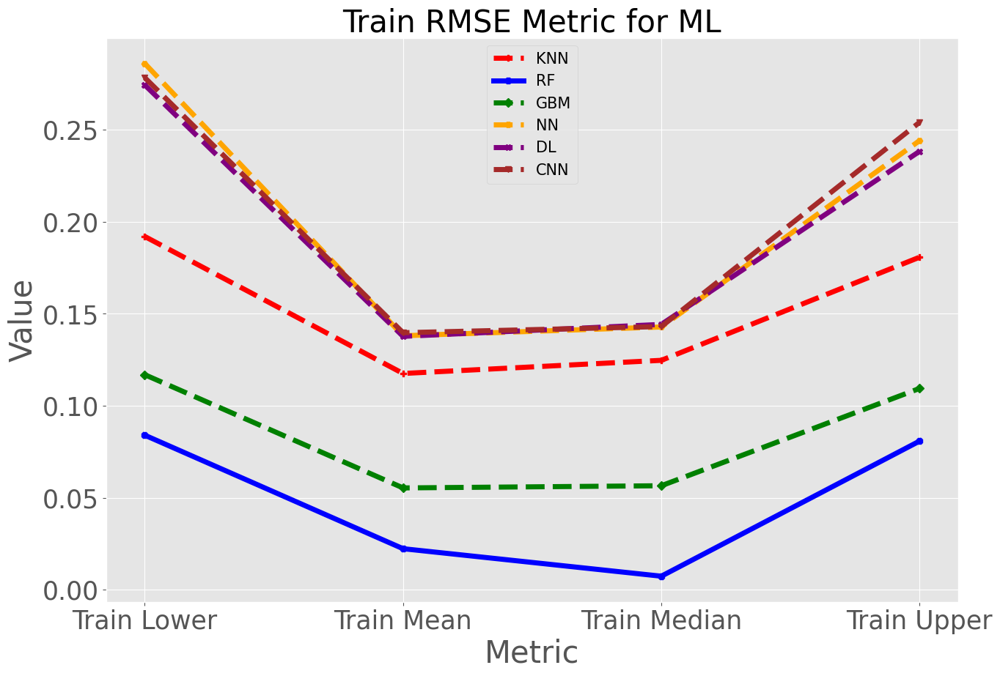

In [294]:
overall_train_metric(rmse_qknn_lower_tr, rmse_knn_mean_tr, rmse_qknn_median_tr, rmse_qknn_upper_tr,
                  rmse_qrf_lower_tr, rmse_rf_mean_tr, rmse_qrf_median_tr, rmse_qrf_upper_tr,
                  rmse_qgbm_lower_tr, rmse_gbm_mean_tr, rmse_qgbm_median_tr, rmse_qgbm_upper_tr,
                  rmse_qnn_lower_tr, rmse_nn_mean_tr, rmse_qnn_median_tr, rmse_qnn_upper_tr,
                  rmse_qdl_lower_tr, rmse_dl_mean_tr, rmse_qdl_median_tr, rmse_qdl_upper_tr,
                  rmse_qcnn_lower_tr, rmse_cnn_mean_tr, rmse_qcnn_median_tr, rmse_qcnn_upper_tr,'RMSE')

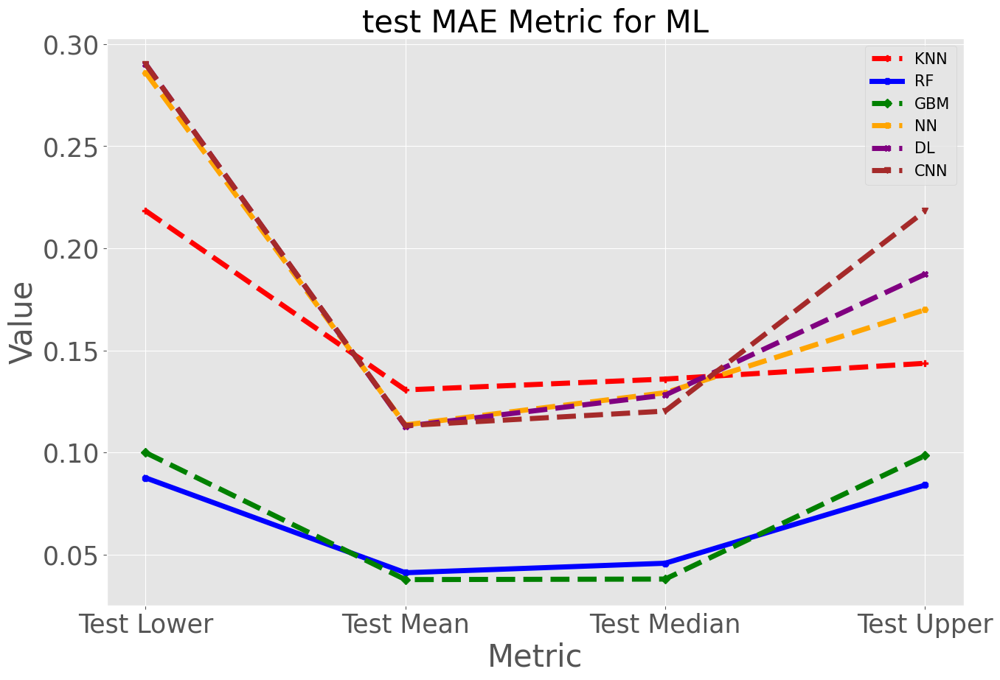

In [295]:
overall_test_metric(mae_qknn_lower_te, mae_knn_mean_te, mae_qknn_median_te, mae_qknn_upper_te,
                  mae_qrf_lower_te, mae_rf_mean_te, mae_qrf_median_te, mae_qrf_upper_te,
                  mae_qgbm_lower_te, mae_gbm_mean_te, mae_qgbm_median_te, mae_qgbm_upper_te,
                  mae_qnn_lower_te, mae_nn_mean_te, mae_qnn_median_te, mae_qnn_upper_te,
                  mae_qdl_lower_te, mae_dl_mean_te, mae_qdl_median_te, mae_qdl_upper_te,
                  mae_qcnn_lower_te, mae_cnn_mean_te, mae_qcnn_median_te, mae_qcnn_upper_te,'MAE')

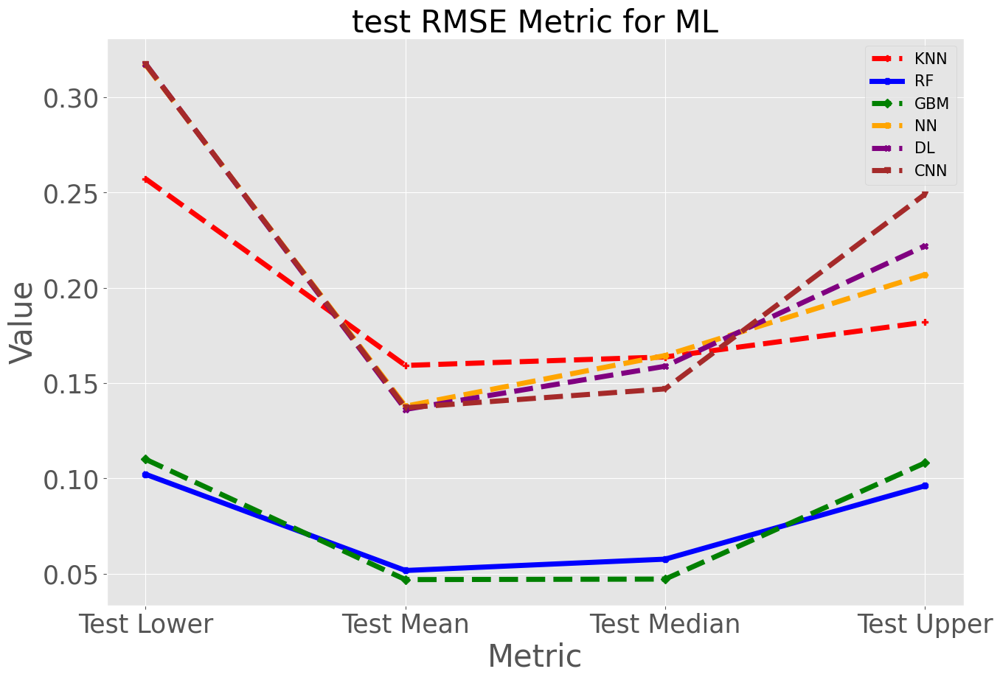

In [296]:
overall_test_metric(rmse_qknn_lower_te, rmse_knn_mean_te, rmse_qknn_median_te, rmse_qknn_upper_te,
                  rmse_qrf_lower_te, rmse_rf_mean_te, rmse_qrf_median_te, rmse_qrf_upper_te,
                  rmse_qgbm_lower_te, rmse_gbm_mean_te, rmse_qgbm_median_te, rmse_qgbm_upper_te,
                  rmse_qnn_lower_te, rmse_nn_mean_te, rmse_qnn_median_te, rmse_qnn_upper_te,
                  rmse_qdl_lower_te, rmse_dl_mean_te, rmse_qdl_median_te, rmse_qdl_upper_te,
                  rmse_qcnn_lower_te, rmse_cnn_mean_te, rmse_qcnn_median_te, rmse_qcnn_upper_te,'RMSE')

### Quantile Calibration Assesment

How can we trust about performance metrics results?

We look if the predicted quantiles match the observed quantiles for each quantile point.

For the lower quantile KNN and RF are good, for the median quantile we have random forest and gbm well calibrated, and for the upper quantile CNN and GBM fit well.

Both gradient boosting and convolutional neural network models capture almost all of the true values within its prediction interval.


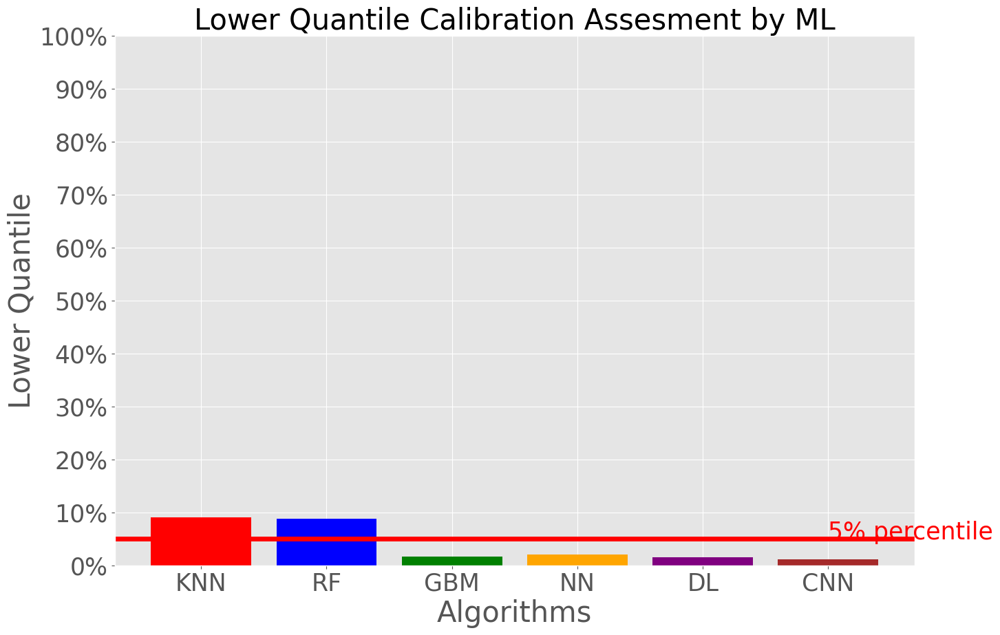

In [297]:
lower_quantile = np.array([percentile_KNN_lower, percentile_RF_lower, percentile_GBM_lower,
                           percentile_NN_lower, percentile_DL_lower, percentile_CNN_lower])
labels = ['KNN', 'RF', 'GBM', 'NN', 'DL','CNN']

colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown']
plt.bar(labels, lower_quantile, color=colors)

# Set the y scale to 0-1 and format it as percentage
plt.ylim(0, 1)
plt.yticks(np.arange(0, 1.1, 0.1), [f'{x*100:.0f}%' for x in np.arange(0, 1.1, 0.1)])

# Draw the horizontal line and add the text
plt.axhline(y=0.05, color='red', linestyle='-', linewidth=5)
plt.text(5.0, 0.05, '5% percentile', color='red', fontsize=25, horizontalalignment='left')

plt.title('Lower Quantile Calibration Assesment by ML', fontsize=30)
plt.xlabel('Algorithms',fontsize=30)
plt.ylabel('Lower Quantile',fontsize=30)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)

plt.show()

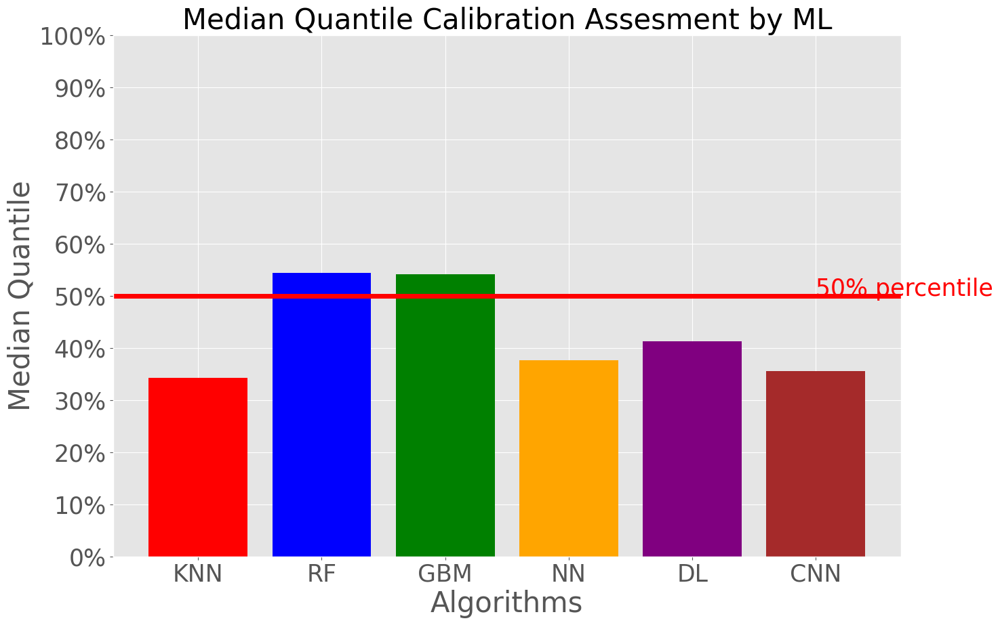

In [298]:
median_quantile = np.array([percentile_KNN_median, percentile_RF_median, percentile_GBM_median,
                           percentile_NN_median, percentile_DL_median, percentile_CNN_median])
labels = ['KNN', 'RF', 'GBM', 'NN', 'DL','CNN']

colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown']
plt.bar(labels, median_quantile, color=colors)

# Set the y scale to 0-1 and format it as percentage
plt.ylim(0, 1)
plt.yticks(np.arange(0, 1.1, 0.1), [f'{x*100:.0f}%' for x in np.arange(0, 1.1, 0.1)])

# Draw the horizontal line and add the text
plt.axhline(y=0.50, color='red', linestyle='-', linewidth=5)
plt.text(5.0, 0.50, '50% percentile', color='red', fontsize=25, horizontalalignment='left')

plt.title('Median Quantile Calibration Assesment by ML', fontsize=30)
plt.xlabel('Algorithms',fontsize=30)
plt.ylabel('Median Quantile',fontsize=30)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)

plt.show()

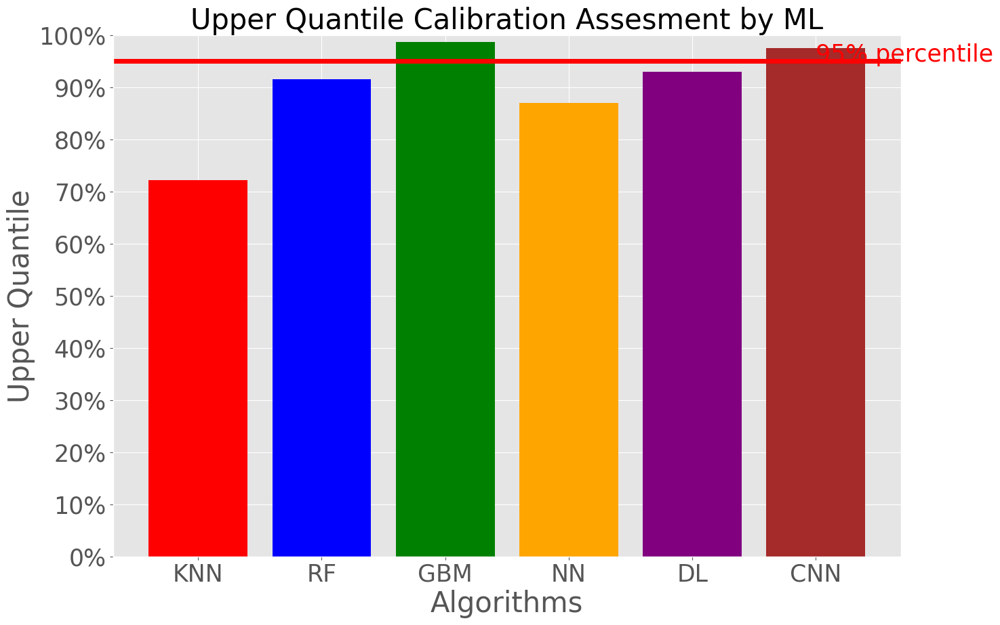

In [299]:
upper_quantile = np.array([percentile_KNN_upper, percentile_RF_upper, percentile_GBM_upper,
                           percentile_NN_upper, percentile_DL_upper, percentile_CNN_upper])
labels = ['KNN', 'RF', 'GBM', 'NN', 'DL','CNN']

colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown']
plt.bar(labels, upper_quantile, color=colors)

# Set the y scale to 0-1 and format it as percentage
plt.ylim(0, 1)
plt.yticks(np.arange(0, 1.1, 0.1), [f'{x*100:.0f}%' for x in np.arange(0, 1.1, 0.1)])

# Draw the horizontal line and add the text
plt.axhline(y=0.95, color='red', linestyle='-', linewidth=5)
plt.text(5.0, 0.95, '95% percentile', color='red', fontsize=25, horizontalalignment='left')

plt.title('Upper Quantile Calibration Assesment by ML', fontsize=30)
plt.xlabel('Algorithms',fontsize=30)
plt.ylabel('Upper Quantile',fontsize=30)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)

plt.show()

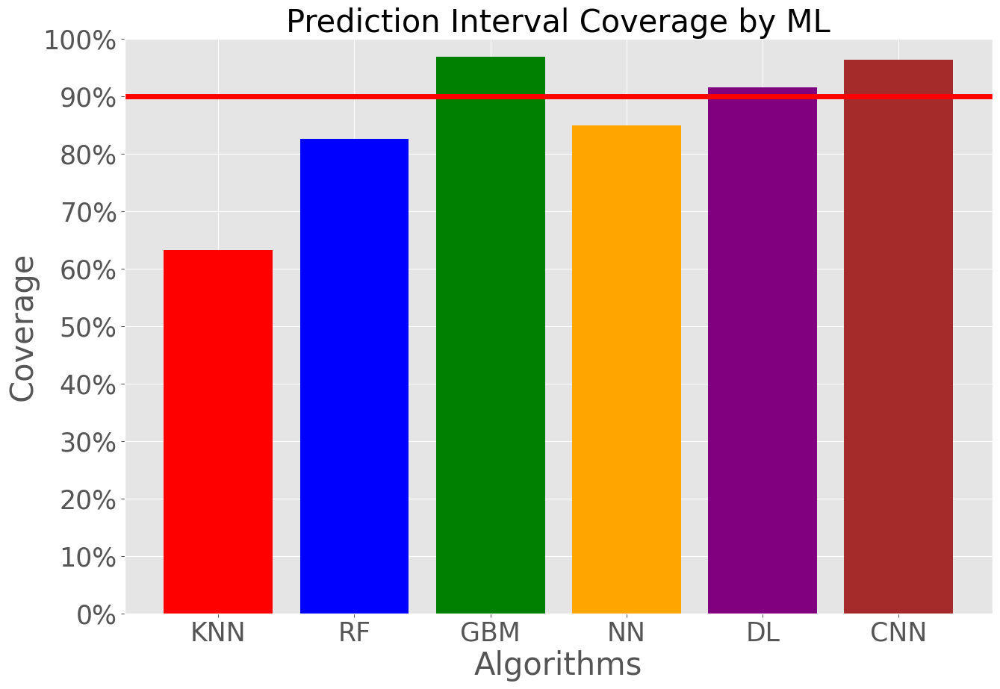

In [300]:
coverage = np.array([coverage_KNN, coverage_RF, coverage_GBM, coverage_NN, coverage_DL, coverage_CNN])
labels = ['KNN', 'RF', 'GBM', 'NN', 'DL','CNN']

colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown']
plt.bar(labels, coverage, color=colors)

# Set the y scale to 0-1 and format it as percentage
plt.ylim(0, 1)
plt.yticks(np.arange(0, 1.1, 0.1), [f'{x*100:.0f}%' for x in np.arange(0, 1.1, 0.1)])

# Draw the horizontal line and add the text
plt.axhline(y=0.90, color='red', linestyle='-', linewidth=5)
#plt.text(5.0, 0.90, '90% percentile', color='red', fontsize=25, horizontalalignment='left')

plt.title('Prediction Interval Coverage by ML', fontsize=30)
plt.xlabel('Algorithms',fontsize=30)
plt.ylabel('Coverage',fontsize=30)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)

plt.show()
